In [1]:
# Imports 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import scipy.stats as stats
from statsmodels.imputation import mice
import seaborn as sns
import optuna 
import pickle
import matplotlib.cm as cm
import xgboost as xgb
import optuna
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import mean_squared_error
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import RobustScaler
import matplotlib.ticker as ticker
from sklearn.impute import KNNImputer
from matplotlib.ticker import FixedLocator







/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_outliers(df, columns):
    for column in columns:
        # Calculate the IQR of the column
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define the upper and lower bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identify the outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        print(f"{column} has {outliers.shape[0]} outliers ({outliers.shape[0] * 100 / df.shape[0]:.2f}% of the data)")

        # Create a boxplot to visualize the outliers
        plt.figure(figsize=(10, 4))
        sns.boxplot(x=df[column])
        plt.title(f'Boxplot of {column}')
        plt.show()

In [3]:
# Functions 

import seaborn as sns

def plot_missing_values(df):
    missing_values_percent = df.isnull().mean() * 100
    missing_values_percent = missing_values_percent[missing_values_percent > 0].sort_values(ascending=False)
    
    plt.figure(figsize=(12, 8))
    barplot = sns.barplot(x=missing_values_percent.values, y=missing_values_percent.index, palette='viridis')
    
    
    # Add percentage values near the bars
    for p in barplot.patches:
        width = p.get_width()
        plt.text(width, p.get_y() + p.get_height() / 2, '{:1.2f}%'.format(width), va='center')
    
    
    plt.title('Percentage of Missing Values Per Column', fontsize=16)
    plt.xlabel('Percentage', fontsize=14)
    plt.ylabel('Column Names', fontsize=14)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    
    plt.show()
    
    
    
def missing_values_percentage(df):
    missing_values_count = df.isnull().sum()
    missing_values_percent = (missing_values_count / df.shape[0]) * 100
    missing_values_df = pd.DataFrame({'column_name': df.columns,
                                      'percent_missing': missing_values_percent,
                                      'data_type': df.dtypes})
    missing_values_df = missing_values_df[missing_values_df['percent_missing'] > 0]
    return missing_values_df.reset_index(drop=True)
    
    
def plot_target_distribution(df, target_col='churn'):
    churned = df[target_col].value_counts()[1]
    not_churned = df[target_col].value_counts()[0]
    total = df.shape[0]
    
    print(f"Churn percentage : {churned/total *100 :.2f}% ")
    print(f"Not Churn percentage : {not_churned/total *100 :.2f}% ")
    
    plt.figure(figsize=(10,8))
    sns.countplot(x=target_col, data=df, palette='viridis',hue=target_col)
    plt.title('Churn Distribution')
    plt.xlabel("Churn")
    plt.ylabel("Customer Count")
    _ = plt.xticks((0, 1), ['Not Churned ({0:.2f}%)'.format(not_churned/total *100), 'Churned ({0:.2f}%)'.format(churned/total *100)])

# Use the function to plot the churn distribution


def plot_categorical_columns(df):
    categorical_columns = df.select_dtypes(include=['object']).columns

    for column in categorical_columns:
        plt.figure(figsize=(10, 4))
        sns.countplot(x=column, data=df)
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Count')
        plt.xticks(rotation=90)
        plt.show()

# Use the function to plot the distributions of categorical columns
#plot_categorical_columns(train_df)

def group_small_categories(df, columns, churn_col='churn'):
    """
    This function groups categories of given columns if they do not contain 2% of the total data 
    and the churn rate does not exceed 70%.

    Parameters:
    df (DataFrame): The input DataFrame.
    columns (list): A list of columns to be grouped.
    churn_col (str): The name of the churn column.

    Returns:
    DataFrame: The DataFrame with the small categories grouped.
    """
    # Create a copy of the DataFrame
    df_copy = df.copy()

    # Calculate the threshold for the number of records
    count_threshold = 0.015 * len(df)

    # Calculate the threshold for the churn rate
    churn_threshold = 0.7
    
    list_all = []

    for col in columns:
        # Calculate the counts and churn rates for each category
        counts = df_copy[col].value_counts()
        churn_rates = df_copy.groupby(col,observed =True)[churn_col].mean()

        # Find the categories to be grouped
        small_categories = counts[counts < count_threshold].index
        high_churn_categories = churn_rates[churn_rates > churn_threshold].index
        to_group = set(small_categories).union(high_churn_categories)
     
        # Replace the categories to be grouped with 'Other'
        df_copy[col] = df_copy[col].apply(lambda x: 'Other' if x in to_group else x)
        
        
    return df_copy

    
def find_categorical_columns(df, threshold=100):
    categorical_columns = {}

    for column in df.columns:
        unique_values = df[column].nunique()
        total_rows = len(df)

        if unique_values < threshold:
            categorical_columns[column] = unique_values

    return pd.DataFrame(categorical_columns.items(), columns=['Categorical Column ', 'Unique Values'])




from sklearn.preprocessing import OrdinalEncoder

def ordinal_encoding(df, ordinal_variables):
    """
    This function takes a DataFrame and a list of ordinal variables and encodes them using LabelEncoder.
    
    Parameters:
    df (DataFrame): The input DataFrame with the ordinal variables.
    ordinal_variables (list): A list of ordinal variables to be encoded.
    
    Returns:
    DataFrame: The DataFrame with the ordinal variables encoded.
    """
    # Create a copy of the DataFrame
    df_copy = df.copy()
    
    # Initialize the LabelEncoder
    le = OrdinalEncoder()
    
    # Perform ordinal encoding for each ordinal variable
    for var in ordinal_variables:
        # Fit and transform the LabelEncoder on the data
        df_copy[var] = le.fit_transform(df_copy[var].astype(str))
        
    return df_copy



def plot_learning_curve(model, X, y):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y)
    plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
    plt.plot(train_sizes, test_scores.mean(axis=1), label='Cross-validation score')
    plt.xlabel('Training set size')
    plt.ylabel('Score')
    plt.title('Learning Curve')
    plt.legend()
    plt.show()

def plot_feature_importance(model, feature_names):
    try:
        importance = model.coef_
    except AttributeError:
        importance = model.feature_importances_
    plt.barh(feature_names, importance)
    plt.xlabel('Importance')
    plt.title('Feature Importance')
    plt.show()
    

def robust_scaling(df, columns):
    df_copy = df.copy()
    scaler = RobustScaler()
    df_copy[columns] = scaler.fit_transform(df_copy[columns])
    return df_copy



def knn_imputation(df, columns, n_neighbors=5,weights='uniform'):
    df_copy = df.copy()
    knn_imputer = KNNImputer(n_neighbors=n_neighbors,weights=weights)
    df_copy[columns] = knn_imputer.fit_transform(df_copy[columns])
    return df_copy



def apply_log_transform(df, columns):
    df_copy = df.copy()
    for col in columns:
        # Add 1 to the column data to avoid division by zero errors
        df_copy[col] = np.log(df_copy[col] + 1)
    return df_copy


from scipy.stats import chi2_contingency

def chi_square_test(df, target, categorical_columns):
    chi2_results = {}
    for col in categorical_columns:
        contingency_table = pd.crosstab(df[col], df[target])
        chi2, p, dof, ex = chi2_contingency(contingency_table)
        chi2_results[col] = p
    return chi2_results



def trim_to_percentiles(df, columns):
    for col in columns:
        tenth_percentile = np.percentile(df[col], 10)
        seventy_fifth_percentile = np.percentile(df[col], 75)
        df[col] = np.clip(df[col], tenth_percentile, seventy_fifth_percentile)
    return df



# Median imputation 
def impute_missing_with_median(df,columns):
    """
    Function to impute missing values with the median value of each column.

    Parameters:
    df (DataFrame): The input dataframe with missing values.

    Returns:
    DataFrame: The dataframe with missing values imputed.
    """
    df_copy = df.copy()
    for col in columns:
        if df_copy[col].isnull().any():
            median_value = df_copy[col].median()
            df_copy[col] = df_copy[col].fillna(median_value)
    return df_copy


def impute_missing_with_most_frequent(df, columns):
    """
    Function to impute missing values with the most frequent value of specified columns.

    Parameters:
    df (DataFrame): The input dataframe with missing values.
    columns (list): List of column names to impute.

    Returns:
    DataFrame: The dataframe with missing values imputed.
    """
    df_copy = df.copy()
    for col in columns:
        if df_copy[col].isnull().any():
            most_frequent_value = df_copy[col].mode()[0]
            df_copy[col] = df_copy[col].fillna(most_frequent_value)
    return df_copy


from sklearn.preprocessing import StandardScaler

def standardize_columns(df, columns):
    """
    Function to standardize specified columns in a DataFrame.

    Parameters:
    df (DataFrame): The input DataFrame with features to standardize.
    columns (list): List of column names to standardize.

    Returns:
    DataFrame: The DataFrame with standardized columns.
    """
    scaler = StandardScaler()
    df[columns] = scaler.fit_transform(df[columns])
    return df






In [4]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, ConfusionMatrixDisplay

# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix')
    plt.show()

# Plot ROC curve
def plot_roc_curve(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

# Plot feature importance
def plot_feature_importance(model, X_train):
    importances = model.feature_importances_
    indices = np.argsort(importances)
    plt.figure(figsize=(12, 8))
    plt.title('Feature Importances')
    plt.barh(range(len(indices)), importances[indices], color='b', align='center')
    plt.yticks(range(len(indices)), [X_train.columns[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()
    
    
    
def filter_columns_for_log_transform(df, columns):
    """
    Function to filter columns that have a minimum value greater than or equal to 0.

    Parameters:
    df (DataFrame): The input DataFrame.
    columns (list): List of column names to check.

    Returns:
    list: List of column names that have a minimum value greater than or equal to 0.
    """
    filtered_columns = [col for col in columns if df[col].min() >= 0]
    return filtered_columns




import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

def perform_pca(df, numerical_columns, categorical_columns=None):
    # Standardizing the numerical features
    x_num = df[numerical_columns].values
    x_num = StandardScaler().fit_transform(x_num)
    
    # Performing PCA on numerical features
    pca = PCA()
    principal_components = pca.fit_transform(x_num)
    
    # Creating a DataFrame with the principal components
    principal_df = pd.DataFrame(data = principal_components, columns = [f'PC{i+1}' for i in range(principal_components.shape[1])])
    
    # Adding back the categorical columns
    if categorical_columns:
        categorical_df = df[categorical_columns].reset_index(drop=True)
        result_df = pd.concat([principal_df, categorical_df], axis=1)
    else:
        result_df = principal_df
    
    # Scree plot
    plt.figure(figsize=(10, 5))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.title('Scree Plot')
    plt.grid(True)
    plt.show()
    
    # Biplot
    def biplot(df, pca, pc1=0, pc2=1):
        plt.figure(figsize=(10, 7))
        plt.scatter(df[f'PC{pc1+1}'], df[f'PC{pc2+1}'], alpha=0.5)
        for i, vector in enumerate(pca.components_):
            plt.arrow(0, 0, vector[pc1] * max(df[f'PC{pc1+1}']), vector[pc2] * max(df[f'PC{pc2+1}']),
                      color='r', alpha=0.5)
            plt.text(vector[pc1] * max(df[f'PC{pc1+1}']) * 1.2, vector[pc2] * max(df[f'PC{pc2+1}']) * 1.2,
                     numerical_columns[i], color='g', ha='center', va='center')
        plt.xlabel(f'PC{pc1+1}')
        plt.ylabel(f'PC{pc2+1}')
        plt.title('Biplot')
        plt.grid(True)
        plt.show()

    # Generating biplot
    biplot(principal_df, pca)

    return result_df

# Example usage:
# df = pd.read_csv('your_data.csv')
# numerical_columns = ['num_column1', 'num_column2']
# categorical_columns = ['cat_column1', 'cat_column2']
# pca_df = perform_pca(df, numerical_columns, categorical_columns)
# print(pca_df)


# Example usage:
# df = pd.read_csv('your_data.csv')
# columns = ['column1', 'column2', 'column3', 'column4']
# pca_df = perform_pca(df, columns)
# print(pca_df)


In [74]:
import os 
def load_model(model_path):
    model_final = None

    if os.path.exists(model_path):

        with open(model_path, 'rb') as f:
            model_final = pickle.load(f)

    return model_final

def save_model(model, model_path):
    with open(model_path, "wb") as f:
        pickle.dump(model, f)

In [155]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import QuantileTransformer, StandardScaler, OrdinalEncoder
from sklearn.impute import KNNImputer
import pandas as pd

class CustomQuantileTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns, output_distribution='normal'):
        self.output_distribution = output_distribution
        self.qt = QuantileTransformer(output_distribution=self.output_distribution)
        self.columns = columns 

    def fit(self, X, y=None):
        self.qt.fit(X[self.columns])
        return self

    def transform(self, X, y=None):
        
        X_copy = X.copy()
        X_copy[self.columns] = self.qt.transform(X[self.columns])
        return X_copy

class CustomStandardScaler(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.scaler = StandardScaler()
        self.columns = columns

    def fit(self, X, y=None):
        self.scaler.fit(X[self.columns])
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        X_copy[self.columns] = self.scaler.transform(X[self.columns])
        return X_copy
    
    
from miceforest import mean_match_default
from sklearn.base import BaseEstimator, TransformerMixin

class CustomKNNImputer(BaseEstimator, TransformerMixin):
    def __init__(self, columns, n_neighbors=5, weights='uniform'):
        self.n_neighbors = n_neighbors
        self.weights = weights
        self.imputer = KNNImputer(n_neighbors=self.n_neighbors, weights=self.weights)
        self.columns = columns

    def fit(self, X, y=None):
        print(X)
        self.imputer.fit(X[self.columns])
        return self

    def transform(self, X, y=None):
        print(f"in transform {X}")
        X_copy = X.copy()
        X_copy[self.columns] = self.imputer.transform(X[self.columns])
        return X_copy
    

import miceforest as mf
    
class CustomMICEImputer(BaseEstimator, TransformerMixin):
    def __init__(self, columns, mean_match_scheme=mean_match_default, iterations=10):
        self.columns = columns
        self.mean_match_scheme = mean_match_scheme
        self.iterations = iterations
        self.kernel = None

    def fit(self, X, y=None):
        X_copy = X.copy()
        X_copy[self.columns] = X_copy[self.columns].astype('category')
        self.kernel = mf.ImputationKernel(
            data=X_copy,
            mean_match_scheme=self.mean_match_scheme,
        )
        self.kernel.mice(self.iterations)
        self.original_dtypes = X_copy.dtypes
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        for col in self.columns:
            X_copy[col] = X_copy[col].astype(self.original_dtypes[col])
        imputed_data = self.kernel.impute_new_data(X_copy)
        X_copy = imputed_data.complete_data()
        return X_copy

from sklearn.impute import SimpleImputer

class CustomMostFrequentImputer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.imputer = SimpleImputer(strategy='most_frequent')

    def fit(self, X, y=None):
        self.imputer.fit(X[self.columns])
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        X_copy[self.columns] = self.imputer.transform(X[self.columns])
        return X_copy

class OneHotEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, categorical_variables, dtype='int'):
        self.categorical_variables = categorical_variables
        self.dtype = dtype

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Perform one-hot encoding
        X_copy = pd.get_dummies(X, columns=self.categorical_variables, drop_first=True, dtype=self.dtype)
        return X_copy

class CustomOrdinalEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, ordinal_variables):
        self.ordinal_variables = ordinal_variables
        self.encoder = OrdinalEncoder()

    def fit(self, X, y=None):
        self.encoder.fit(X[self.ordinal_variables])
        return self

    def transform(self, X):
        # Perform ordinal encoding
        X_copy = X.copy()
        X_copy[self.ordinal_variables] = self.encoder.transform(X[self.ordinal_variables])
        return X_copy

class ColumnFilter(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[self.columns]
    
    
    




In [7]:

# Plot Functions 
def high_corr_features(df, threshold):
    # Compute the correlation matrix
    corr = df.select_dtypes(exclude=['object']).corr()

    # Reset index so that 'features' are included in the melt operation
    corr_reset = corr.reset_index()

    # Melt the correlation DataFrame to a long format
    corr_melted = corr_reset.melt(id_vars='index')

    # Rename the columns
    corr_melted.columns = ['Feature 1', 'Feature 2', 'Correlation']

    # Remove pairs with the same feature
    corr_melted = corr_melted[corr_melted['Feature 1'] != corr_melted['Feature 2']]

    # Remove duplicate pairs
    corr_melted['sorted_features'] = corr_melted.apply(lambda row: ''.join(sorted([row['Feature 1'], row['Feature 2']])), axis=1)
    corr_melted['Correlation'] = corr_melted['Correlation'].abs()
    corr_melted = corr_melted.drop_duplicates(subset='sorted_features')
    corr_melted = corr_melted.drop(columns='sorted_features').sort_values(by='Correlation', ascending=False)
    
    # Filter correlations above the threshold
    high_corr = corr_melted[corr_melted['Correlation'] > threshold].reset_index(drop=True)
    
    return high_corr

def visualize_high_corr(df, threshold = 0.9):
    # Create a new column for feature pairs
    df['Feature Pair'] = df['Feature 1'] + ' - ' + df['Feature 2']

    # Sort the DataFrame by correlation
    df = df.sort_values(by='Correlation', ascending=True)

    # Create a colormap
    colors = cm.viridis(df['Correlation'].values)

    # Plot a horizontal bar chart of the feature pairs and their correlation
    plt.figure(figsize=(10, 8))
    plt.barh(df['Feature Pair'], df['Correlation'], color=colors)
    plt.title("High Correlation Pairs")
    plt.xlabel("Correlation")
    
    # Add a horizontal line to represent the threshold
    plt.axvline(x=threshold, color='r', linestyle='--')
    
    plt.text(threshold+0.01, plt.gca().get_ylim()[1]-0.65, f'Threshold: {threshold}', color='r', va='center')


    plt.show()



def visualize_features(df, target, features):
    num_features = len(features)
    f, axes = plt.subplots(nrows=2, ncols=num_features, figsize=(5*num_features, 12))

    # If there's only one feature, make axes a list of one item
    if num_features == 1:
        axes = [axes]

    for i, feature in enumerate(features):
        sns.kdeplot(df[feature], color='blue', label='train_set', ax=axes[0][i])
        axes[1][i].hist(df[feature][df[target] == 0], color='#2ecc71', alpha=0.5, label='not' + ' ' + target, bins=25)
        axes[1][i].hist(df[feature][df[target] == 1], color='#e74c3c', alpha=0.5, label=target, bins=25)

        axes[0][i].set_title(f'{feature} Histogram', fontsize=14)
        axes[1][i].set_title(f'{feature} Histogram by {target}', fontsize=14)

        for j in range(2):
            axes[j][i].set_xlabel(f'{feature}')
            axes[j][i].set_ylabel('Count')
            axes[j][i].legend(loc='best')

    plt.tight_layout()
    plt.show()
    
def visualize_categorical_features(df, target, features):
    num_features = len(features)
    f, axes = plt.subplots(nrows=2, ncols=num_features, figsize=(5*num_features, 12))

    # If there's only one feature, make axes a list of one item
    if num_features == 1:
        axes = np.array([axes])

    for i, feature in enumerate(features):
        sns.countplot(x=feature, data=df, ax=axes[0][i])
        axes[0][i].set_title(f'{feature} Countplot', fontsize=14)
        axes[0][i].set_xlabel(f'{feature}')
        axes[0][i].set_ylabel('Count')

        sns.countplot(x=feature, hue=target, data=df, ax=axes[1][i])
        axes[1][i].set_title(f'{feature} Countplot by {target}', fontsize=14)
        axes[1][i].set_xlabel(f'{feature}')
        axes[1][i].set_ylabel('Count')

        # Change legend labels
        handles, labels = axes[1][i].get_legend_handles_labels()
        axes[1][i].legend(handles, ['Not Churned', 'Churned'], loc='best')

        # Truncate and rotate x-axis labels for readability
        for ax in axes[:, i]:
            labels = [label.get_text()[:10]+'...' if len(label.get_text())>10 else label.get_text() for label in ax.get_xticklabels()]
            ax.xaxis.set_major_locator(ticker.FixedLocator(range(len(labels))))  # Set x-ticks
            ax.set_xticklabels(labels, rotation=45)

    plt.tight_layout()
    plt.show()
    
    
def plot_large_correlation_matrix(df, threshold=0.7):
    # Calculate correlation matrix
    corr_matrix = df.corr().abs()

    # Only consider correlations above the threshold
    high_corr = corr_matrix[corr_matrix > threshold]

    # Create a mask to hide the upper triangle of the correlation matrix (which is symmetric)
    mask = np.triu(np.ones_like(high_corr, dtype=bool))

    # Set the figure size proportional to the number of columns
    plt.figure(figsize=(0.1*df.shape[1], 0.1*df.shape[1]))

    # Create a heatmap
    sns.heatmap(high_corr, mask=mask, annot=False, annot_kws={"size": 8}, cmap='coolwarm')

    plt.show()
        
def visualize_categorical_features_percentage_wise(df, target, features):
    num_features = len(features)
    f, axes = plt.subplots(nrows=2, ncols=num_features, figsize=(5*num_features, 12))

    # If there's only one feature, make axes a list of one item
    if num_features == 1:
        axes = np.array([axes])

    for i, feature in enumerate(features):
        sns.countplot(x=feature, data=df, ax=axes[0][i])
        axes[0][i].set_title(f'{feature} Countplot', fontsize=14)
        axes[0][i].set_xlabel(f'{feature}')
        axes[0][i].set_ylabel('Count')

        # Calculate the percentage of 'Churned' and 'Not Churned' for each category
        churned = df[df[target] == 1][feature].value_counts()
        not_churned = df[df[target] == 0][feature].value_counts()
        total = df[feature].value_counts()
        churned_percentage = churned / total * 100
        not_churned_percentage = not_churned / total * 100

        # Create a DataFrame for the percentages
        percentage_df = pd.DataFrame({f'{target}': churned_percentage, f'Not {target}': not_churned_percentage})

        # Plot the percentages
        percentage_df.plot(kind='bar', stacked=True, ax=axes[1][i])
        axes[1][i].set_title(f'{feature} Percentage by {target}', fontsize=14)
        axes[1][i].set_xlabel(f'{feature}')
        axes[1][i].set_ylabel('Percentage')

        # Truncate and rotate x-axis labels for readability
        for ax in axes[:, i]:
            labels = [label.get_text()[:10]+'...' if len(label.get_text())>10 else label.get_text() for label in ax.get_xticklabels()]
            ax.xaxis.set_major_locator(FixedLocator(range(len(labels))))
            ax.set_xticklabels(labels, rotation=45)

    plt.tight_layout()
    plt.show()




# Basic imputation vs KNN imputation
    
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_outliers(df, continuous_variables, target_col):
    """
    Function to plot boxplots of continuous variables by target variable
    and highlight outliers.

    Parameters:
    df (DataFrame): The dataframe containing the data.
    continuous_variables (list): List of continuous variable names to plot.
    target_col (str): The name of the target column.

    Returns:
    None
    """
    # Calculate the number of rows needed for the subplots
    num_rows = int(np.ceil(len(continuous_variables) / 3))

    # Create a figure
    fig, axs = plt.subplots(num_rows, 3, figsize=(15, 5*num_rows))

    for i, var in enumerate(continuous_variables):
        # Calculate the row and column indices for the subplot
        row = i // 3
        col = i % 3

        # Plot the variable against the target column
        sns.boxplot(data=df, x=target_col, y=var, ax=axs[row, col])
        axs[row, col].set_title(f'{var} by {target_col}')

        # Calculate IQR
        Q1 = df[var].quantile(0.25)
        Q3 = df[var].quantile(0.75)
        IQR = Q3 - Q1

        # Define a threshold for outliers
        threshold = 1.5

        # Identify outliers
        outliers_df = df[(df[var] < (Q1 - threshold * IQR)) | (df[var] > (Q3 + threshold * IQR))]

        # Overlay outliers on the same plot using swarmplot
        sns.swarmplot(data=outliers_df, x=target_col, y=var, color='r', ax=axs[row, col], marker='o', label='Outliers')

    plt.tight_layout()
    plt.show()
    
    
    
import matplotlib.pyplot as plt
import seaborn as sns

def plot_outlier_continuous_variables_classification(df, continuous_variables, target_col):
    # Create a copy of the DataFrame
    df_copy = df.copy()

    # Determine the number of rows needed for the plots
    num_rows = len(continuous_variables) // 5
    num_rows += len(continuous_variables) % 5

    # Create a figure
    fig, axs = plt.subplots(num_rows, 5, figsize=(15, 5*num_rows))

    # Flatten the axes array if there's only one row
    if num_rows == 1:
        axs = axs.flatten()

    for i, var in enumerate(continuous_variables):
        # Calculate the row and column indices for the subplot
        row = i // 5
        col = i % 5

        # Plot the variable against the target column
        sns.boxplot(data=df_copy, x=target_col, y=var, ax=axs[row, col])
        axs[row, col].set_title(f'{var} by {target_col}')

    plt.tight_layout()
    plt.show()
    
    
import matplotlib.pyplot as plt
import seaborn as sns

def plot_outlier_continuous_variables_classification(df, continuous_variables, target_col):
    # Create a copy of the DataFrame
    df_copy = df.copy()

    # Determine the number of rows needed for the plots
    num_rows = len(continuous_variables) // 5
    num_rows += len(continuous_variables) % 5

    # Create a figure
    fig, axs = plt.subplots(num_rows, 5, figsize=(15, 5*num_rows))

    # Flatten the axes array if there's only one row
    if num_rows == 1:
        axs = axs.flatten()

    for i in range(num_rows * 5):
        if i < len(continuous_variables):
            var = continuous_variables[i]
            # Calculate the row and column indices for the subplot
            row = i // 5
            col = i % 5

            # Plot the variable against the target column
            sns.boxplot(data=df_copy, x=target_col, y=var, ax=axs[row, col])
            axs[row, col].set_title(f'{var} by {target_col}')
        else:
            # Remove the unused subplot
            fig.delaxes(axs.flatten()[i])

    plt.tight_layout()
    plt.show()


    
   

def plot_model_and_study(model, study):
    fig, axs = plt.subplots(2, 2, figsize=(20, 15))

    # Feature importance - Gain
    xgb.plot_importance(model, ax=axs[0, 0], importance_type='gain', show_values=False)
    axs[0, 0].set_title('Feature Importance - Gain')

    # Feature importance - Weight
    xgb.plot_importance(model, ax=axs[0, 1], importance_type='weight', show_values=False)
    axs[0, 1].set_title('Feature Importance - Weight')

    # Convert the study data to a pandas DataFrame
    df = study.trials_dataframe()

    # Plot the optimization history
    axs[1, 0].plot(df['number'], df['value'])
    axs[1, 0].set_title('Optimization History')
    axs[1, 0].set_xlabel('Trial number')
    axs[1, 0].set_ylabel('Objective Value')

    # Plot the parameter importance
    importances = optuna.importance.get_param_importances(study)
    axs[1, 1].bar(importances.keys(), importances.values())
    axs[1, 1].set_title('Parameter Importance')
    axs[1, 1].set_xlabel('Parameter')
    axs[1, 1].set_ylabel('Importance')

    plt.tight_layout()
    plt.show()
    

from sklearn.metrics import confusion_matrix

def plot_classification_results(actual, predicted, labels):
    # Create a confusion matrix
    cm = confusion_matrix(actual, predicted, labels=labels)

    # Convert the confusion matrix to a DataFrame
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)

    # Create a heatmap from the DataFrame
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')

    # Set the plot title and labels
    plt.title('Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    # Show the plot
    plt.show()
    
    
# Categorical Encoding
def one_hot_encoding(df, categorical_variables,dtype = 'int'):
    """
    This function takes a DataFrame and a list of categorical variables and encodes them using one-hot encoding.
    
    Parameters:
    df (DataFrame): The input DataFrame with the categorical variables.
    categorical_variables (list): A list of categorical variables to be encoded.
    
    Returns:
    DataFrame: The DataFrame with the categorical variables encoded.
    """
    # Create a copy of the DataFrame
    df_copy = df.copy()
    
    # Perform one-hot encoding for each categorical variable
    #for var in categorical_variables:
    #    df_copy[var] = df_copy[var].astype('category')
        
    # Perform one-hot encoding
    df_copy = pd.get_dummies(df_copy, columns=categorical_variables, drop_first=True,dtype=dtype)
                
    return df_copy

In [8]:
# display settings 
pd.set_option('display.max_columns', None)

In [9]:
# Load data
data = pd.read_csv('./case_data/churn_data.csv')
metadata = pd.read_excel('./case_data/churn_metadata.xlsx')

## Data Splitting

Before proceeding with our analysis, we will first divide the dataset into a training set and a test set. This approach ensures that we do not leak any information from the test set into the training set, mirroring the conditions of a production environment.

We will allocate 30% of the data for testing and the remaining 70% for training. The training set will also include a validation set for model tuning and validation.

In [10]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(data, test_size=0.3, random_state=42)


In [11]:
# We have 35000 rows and 100 columns in the data and we have 30% of the data for testing and 70% for training.
train_df.shape,test_df.shape

((35055, 100), (15024, 100))

In [12]:
train_df.drop(columns=['Customer_ID'],inplace=True)

## Identifying Categorical Columns

Our next step is to identify the categorical columns in our dataset. We will use a unique value threshold of 100 to distinguish between categorical and continuous variables. 

After identifying potential categorical columns, we will further refine this list using our domain knowledge, as documented in the `churn_metadata.xlsx` file. This approach ensures that our final list of categorical columns is both data-driven and contextually relevant.


In [13]:
categorical_columns = find_categorical_columns(train_df.loc[:, ~train_df.columns.isin(['churn'])])

categorical_column_list = categorical_columns['Categorical Column '].tolist()

#forgntvl,numbcars,adults,truck,rv,uniqsubs,months

remove_list = ['blck_dat_Mean','drop_dat_Mean','recv_sms_Mean',
               'unan_dat_Mean','callfwdv_Mean','threeway_Mean','adults',
               'callfwdv_Mean','months','uniqsubs','actvsubs',
               'hnd_price','phones','models','lor','income']

categorical_column_list = [item for item in categorical_column_list if item not in remove_list]
numeric_column_list = [item for item in train_df.columns if item not in categorical_column_list and item != 'churn' and item != 'Customer_ID']
print(f'Number of categorical columns: {len(categorical_column_list)}')
print(f'Number of numeric columns: {len(numeric_column_list)}')
print(f"target column: churn")


Number of categorical columns: 25
Number of numeric columns: 73
target column: churn


## Feature Selection Strategy

Given that our dataset contains 100 columns, it would be challenging to use all of them in a model effectively. Therefore, we need to adopt several strategies to reduce the number of unrelated columns to our target variable.

Initially, we can apply filter techniques to remove some data from the base. These techniques include:

- **Low Variance Filter:** Removes features with low variance as they don't contribute much to the model.
- **High Correlation Filter:** Removes highly correlated features to avoid multicollinearity.
- **High Missing Values Filter:** Removes features with a high percentage of missing values.

Dimensionality reduction techniques like Principal Component Analysis (PCA) can also be used to reduce the number of columns. However, the downside is that the results may be difficult to interpret.

After dealing with missing values and encoding categorical variables, we can employ wrapper techniques or use feature importance from models to select the best features. 

1. **Wrapper Techniques:** These techniques create many models with different subsets of input features and select those features that result in the best performing model according to a pre-defined performance metric. Examples of wrapper methods include:
   - **Recursive Feature Elimination:** This is a greedy optimization algorithm which aims to find the best performing feature subset. It repeatedly creates models and keeps aside the best or the worst performing feature at each iteration. It constructs the next model with the left features until all the features are exhausted. It then ranks the features based on the order of their elimination.
   - **Forward Selection:** This is an iterative method where we start with having no feature in the model. In each iteration, we keep adding the feature which best improves our model until an addition of a new variable does not improve the performance of the model.
   - **Backward Elimination:** In this method, we start with all the features and removes the least significant feature at each iteration which improves the performance of the model. We repeat this until no improvement is observed on removal of features.

2. **Feature Importance from Models:** Certain algorithms like Decision Trees, Random Forests, and XGBoost provide a feature importance matrix which can be used to select features. This is a much faster approach than wrapper methods. However, they might not be as accurate since they do not necessarily optimize the feature set for the specific algorithm you might want to apply for your final model.


In [15]:
train_df.describe()

,rev_Mean,mou_Mean,totmrc_Mean,da_Mean,ovrmou_Mean,ovrrev_Mean,vceovr_Mean,datovr_Mean,roam_Mean,change_mou,change_rev,drop_vce_Mean,drop_dat_Mean,blck_vce_Mean,blck_dat_Mean,unan_vce_Mean,unan_dat_Mean,plcd_vce_Mean,plcd_dat_Mean,recv_vce_Mean,recv_sms_Mean,comp_vce_Mean,comp_dat_Mean,custcare_Mean,ccrndmou_Mean,cc_mou_Mean,inonemin_Mean,threeway_Mean,mou_cvce_Mean,mou_cdat_Mean,mou_rvce_Mean,owylis_vce_Mean,mouowylisv_Mean,iwylis_vce_Mean,mouiwylisv_Mean,peak_vce_Mean,peak_dat_Mean,mou_peav_Mean,mou_pead_Mean,opk_vce_Mean,opk_dat_Mean,mou_opkv_Mean,mou_opkd_Mean,drop_blk_Mean,attempt_Mean,complete_Mean,callfwdv_Mean,callwait_Mean,months,uniqsubs,actvsubs,totcalls,totmou,totrev,adjrev,adjmou,adjqty,avgrev,avgmou,avgqty,avg3mou,avg3qty,avg3rev,avg6mou,avg6qty,avg6rev,hnd_price,phones,models,truck,rv,lor,adults,income,numbcars,forgntvl,eqpdays,churn
count,34957.000000,34957.000000,34957.000000,34957.000000,34957.000000,34957.000000,34957.000000,34957.000000,34957.000000,34784.000000,34784.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,35055.000000,34083.000000,34083.000000,34083.000000,34766.000000,35054.000000,35054.000000,34404.000000,34404.000000,24487.000000,27041.000000,26183.000000,17780.000000,34404.000000,35054.000000,35055.000000
mean,58.798937,512.724728,46.171908,0.893434,41.724566,13.743063,13.466901,0.273073,1.222332,-15.632508,-1.253143,5.938397,0.039005,3.975486,0.030343,27.572505,0.028916,144.298483,0.894903,54.918504,0.042961,108.586360,0.796639,1.750939,4.624885,3.659072,29.732839,0.287814,227.777794,1.855848,111.580086,24.700537,28.442361,7.924975,18.221544,88.186169,0.364784,173.944150,0.725621,65.797599,0.431864,165.347559,1.130227,9.983231,145.193387,109.382998,0.012628,1.791570,18.777464,1.553074,1.359464,2855.788960,7598.282783,1028.638503,956.748566,7495.704243,2814.802453,57.913291,482.599957,173.199195,519.523235,180.064670,59.355441,508.404865,177.941114,58.731303,102.410171,1.778057,1.540423,0.187856,0.081822,6.211418,2.543508,5.797617,1.572385,0.058947,391.823644,0.496078
std,45.050909,527.917997,23.640396,2.251066,99.707613,31.394674,30.953602,3.577955,7.645722,256.895730,38.641296,9.020287,0.594947,10.354051,2.269238,38.117054,0.477395,158.819285,9.166115,85.155129,1.625025,119.306648,8.136013,4.333823,11.947875,10.045397,53.972231,1.121021,266.331607,24.964576,163.186584,34.253222,49.165933,16.202260,41.102515,103.427136,4.052634,210.028792,10.358152,91.832816,4.680832,237.525347,16.157461,15.439940,159.991365,120.389701,0.526766,5.519683,9.601522,1.365058,0.694290,3670.553954,8474.467851,848.800798,835.640033,8402.484487,3636.165859,36.200624,439.348790,167.827287,538.563780,194.530455,47.452062,499.033067,183.715696,41.176871,61.117444,1.303219,0.894392,0.390603,0.274097,4.734400,1.457117,2.180974,0.627018,0.235528,255.426808,0.499992
min,-5.862500,0.000000,-6.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3875.000000,-768.575000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,0.000000,0.000000,4.350000,4.350000,0.000000,0.000000,0.990000,0.000000,0.000000,0.000

In [16]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35055 entries, 19260 to 15795
Data columns (total 99 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   rev_Mean          34957 non-null  float64
 1   mou_Mean          34957 non-null  float64
 2   totmrc_Mean       34957 non-null  float64
 3   da_Mean           34957 non-null  float64
 4   ovrmou_Mean       34957 non-null  float64
 5   ovrrev_Mean       34957 non-null  float64
 6   vceovr_Mean       34957 non-null  float64
 7   datovr_Mean       34957 non-null  float64
 8   roam_Mean         34957 non-null  float64
 9   change_mou        34784 non-null  float64
 10  change_rev        34784 non-null  float64
 11  drop_vce_Mean     35055 non-null  float64
 12  drop_dat_Mean     35055 non-null  float64
 13  blck_vce_Mean     35055 non-null  float64
 14  blck_dat_Mean     35055 non-null  float64
 15  unan_vce_Mean     35055 non-null  float64
 16  unan_dat_Mean     35055 non-null  float64

## Handling Missing Values

From our initial data exploration, it's evident that some columns in our dataset contain missing values. To better understand the extent of these missing values, we will visualize them. 

We will plot the percentage of missing values in each column that contains at least one missing value. This will provide us with a clearer picture of the data completeness and guide our strategy for handling these missing values.

/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2470397885.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x=missing_values_percent.values, y=missing_values_percent.index, palette='viridis')


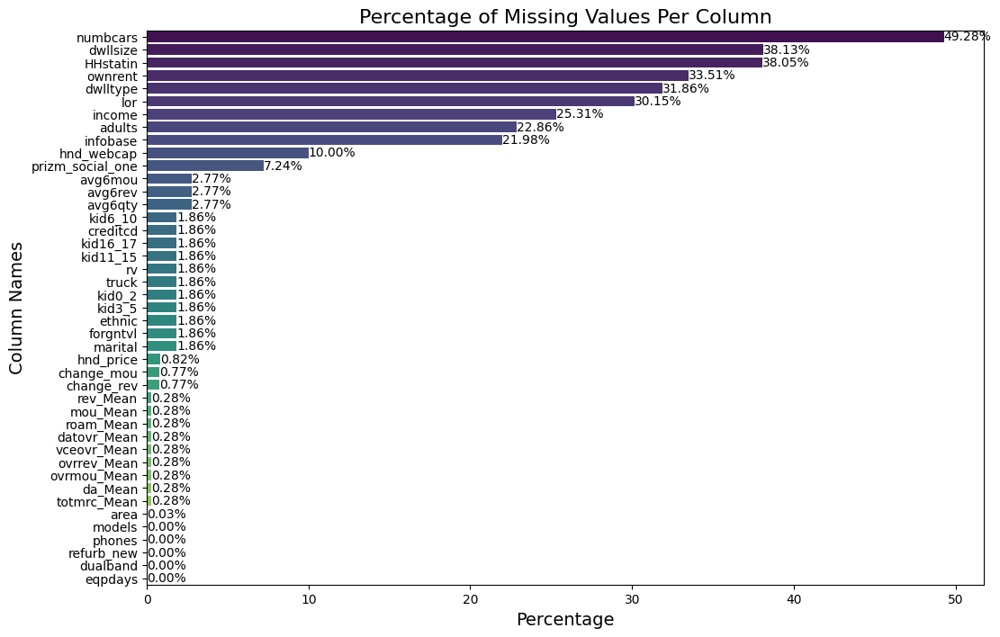

In [17]:
plot_missing_values(train_df)

## Missing Value Analysis

From the above visualization, it's apparent that certain groups of columns share the same percentage of missing values. This could potentially indicate a pattern or relationship in the occurrence of these missing values.

To investigate this further, we will conduct a missing value analysis. Our goal is to identify any patterns or correlations in the missing data, which could provide insights into the underlying mechanisms leading to missing values.

For this analysis, we will utilize the `missingno` library. This library offers a flexible and easy-to-use set of tools for visualizing missing data, which will aid us in our investigation.


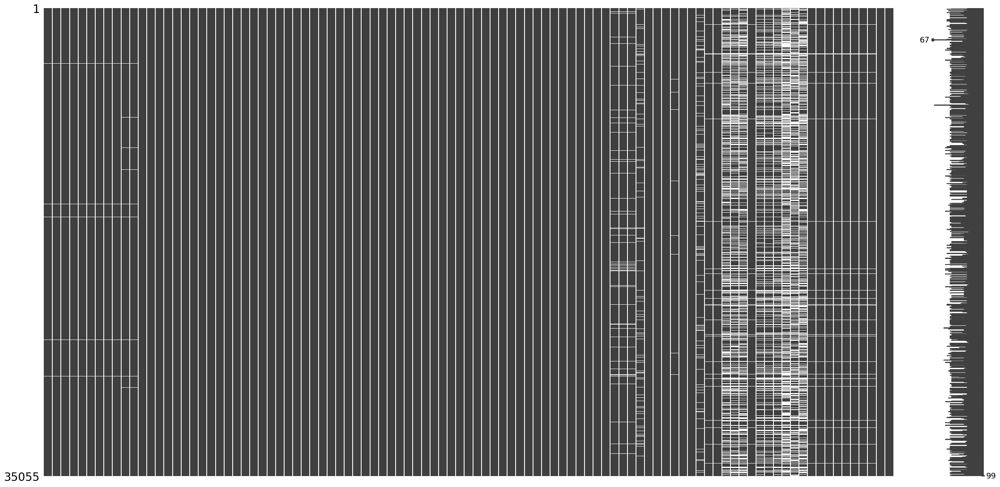

In [18]:
msno.matrix(train_df,figsize=(30,15))
plt.show()

## Identifying Patterns in Missing Values

Upon examining the matrix plot above, we observe an identical pattern of missing data across several columns. This observation suggests that there may be a systematic relationship leading to these missing values.

To further investigate this potential relationship, we can visualize the correlation of missing values using a heatmap. A heatmap will allow us to see if the presence of missing values in one column correlates with missing values in another column, providing further insight into the underlying patterns of our data.

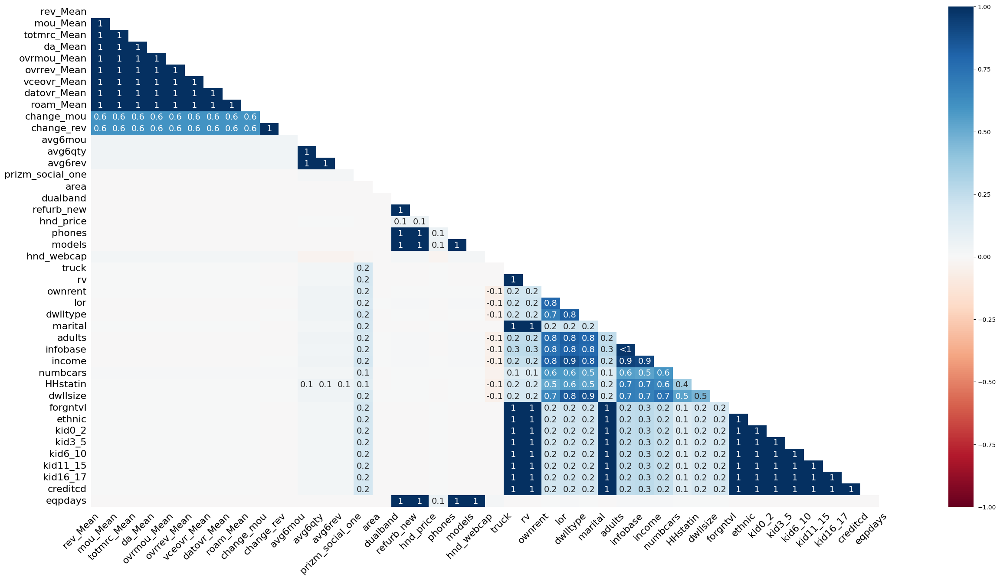

In [19]:
msno.heatmap(train_df,figsize=(30,15))
plt.show()

## Missing Value Analysis

After conducting a missing value analysis, we have observed that most of the columns with missing values do not follow the MCAR (Missing Completely At Random) pattern. 

In MCAR, the missingness of data is independent of any other variable in the dataset, which is not the case here. 

Instead, we have identified two other patterns:

1. **MAR (Missing At Random):** This pattern suggests that the missingness of data can be explained by other variables in the dataset. 

2. **MNAR (Missing Not At Random):** This pattern indicates that the missingness of data is related to the values of the data itself. This could be due to reasons such as data loss from the source or inability to collect certain data.

In the upcoming steps, we will address these missing values using appropriate techniques tailored to the observed patterns.






Churn percentage : 49.61% 
Not Churn percentage : 50.39% 


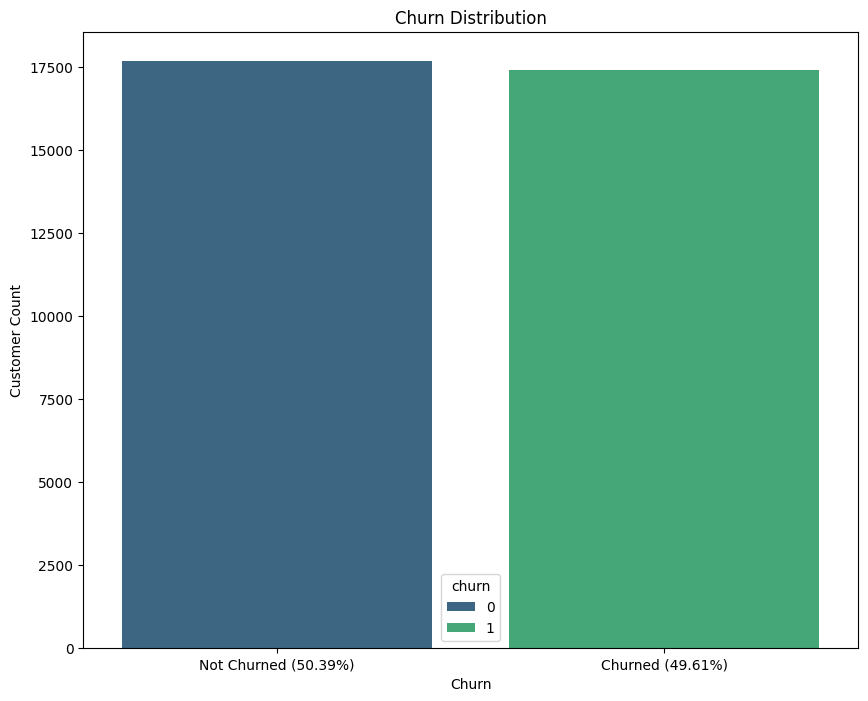

In [20]:
# Lets look at the target distrubution 
plot_target_distribution(train_df, target_col='churn')

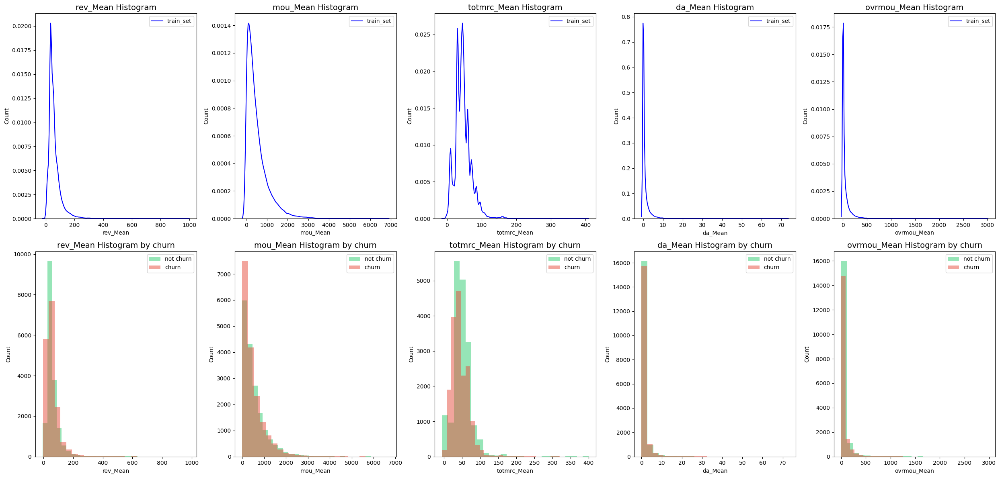

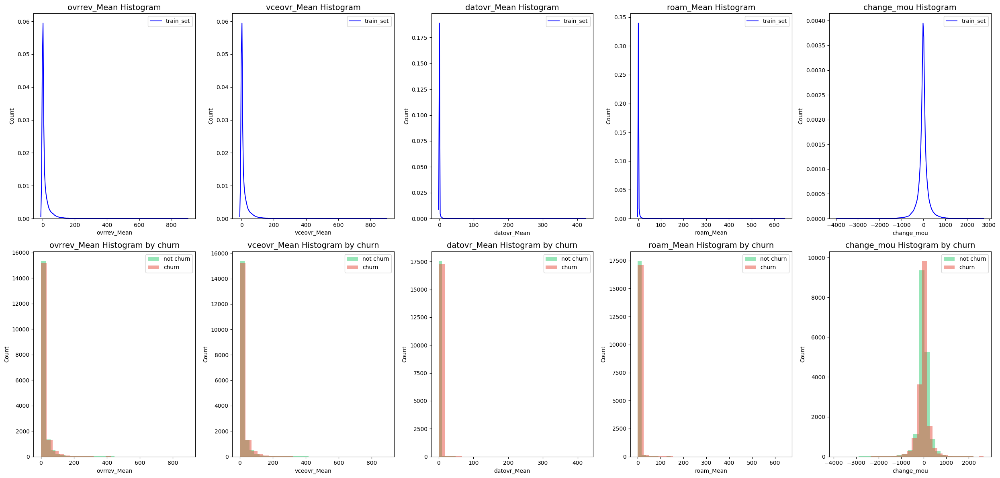

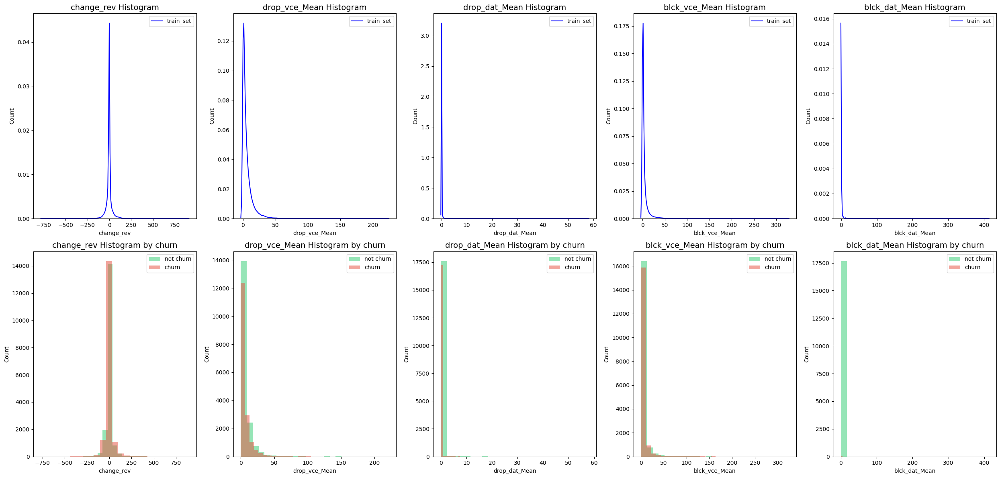

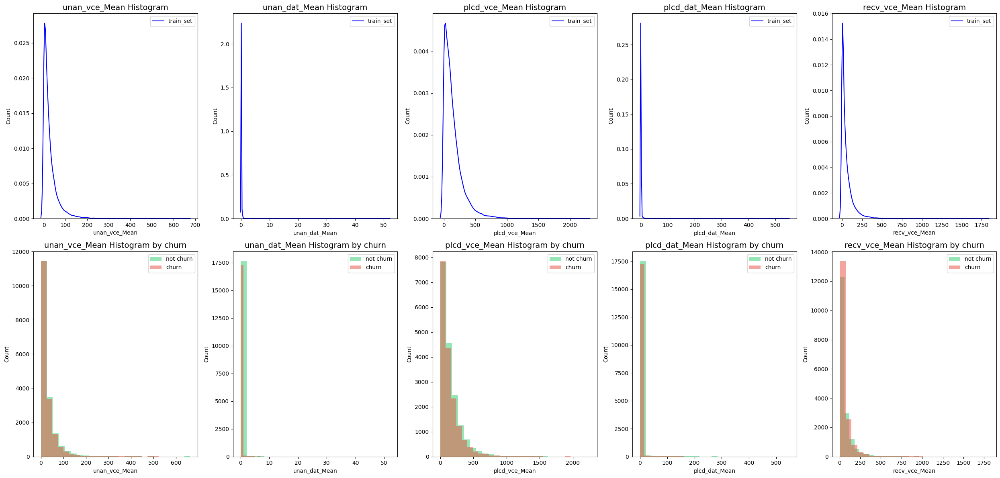

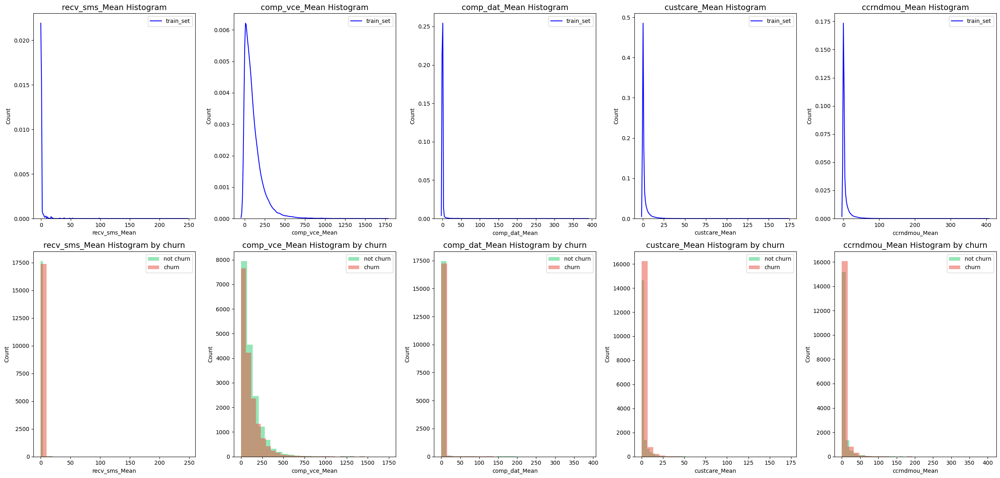

...

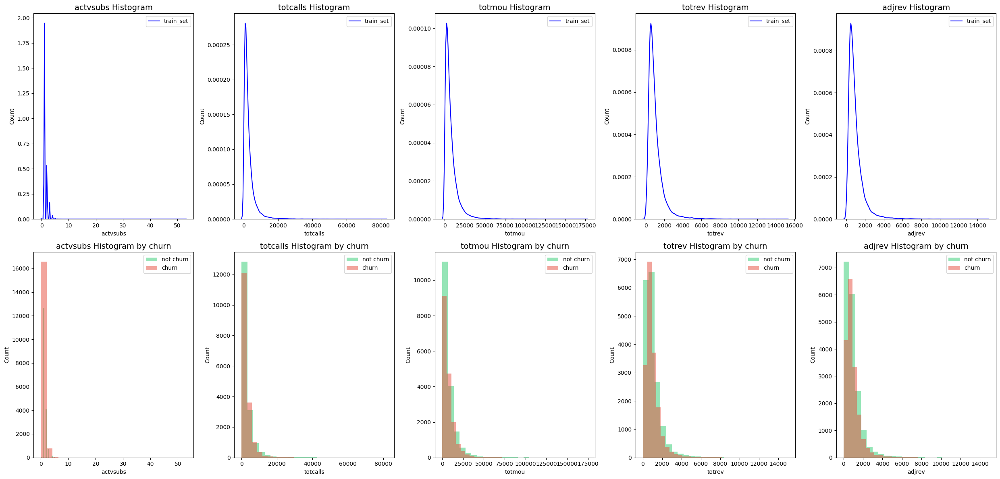

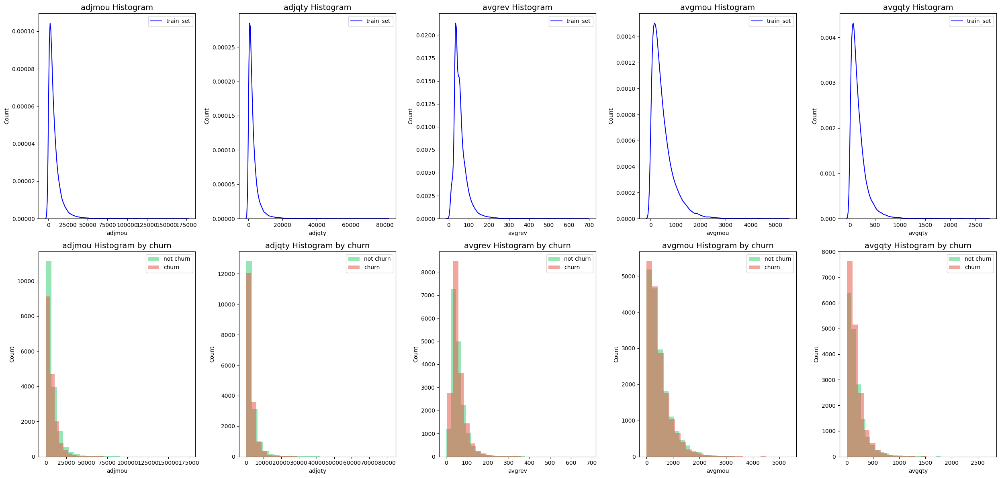

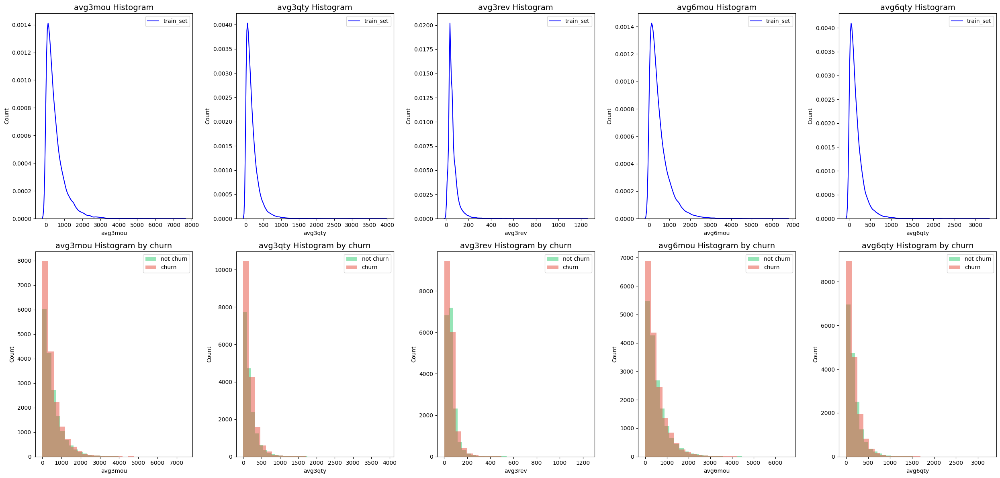

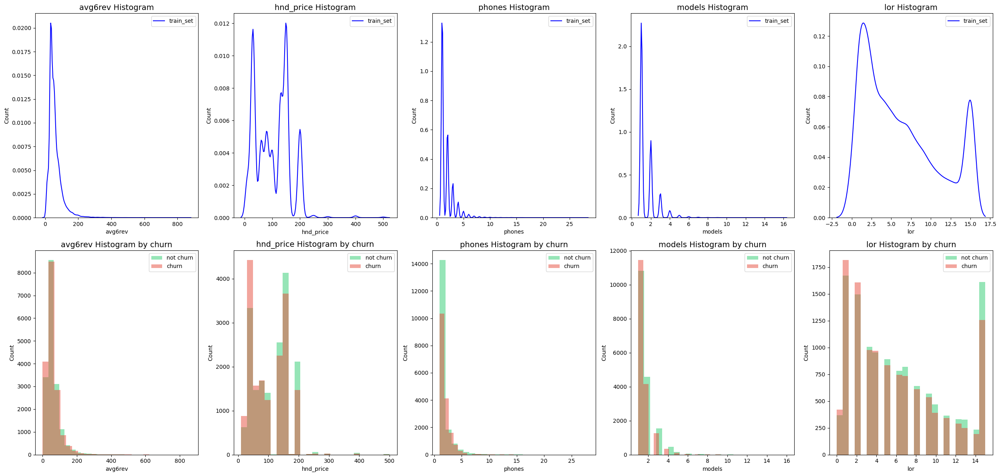

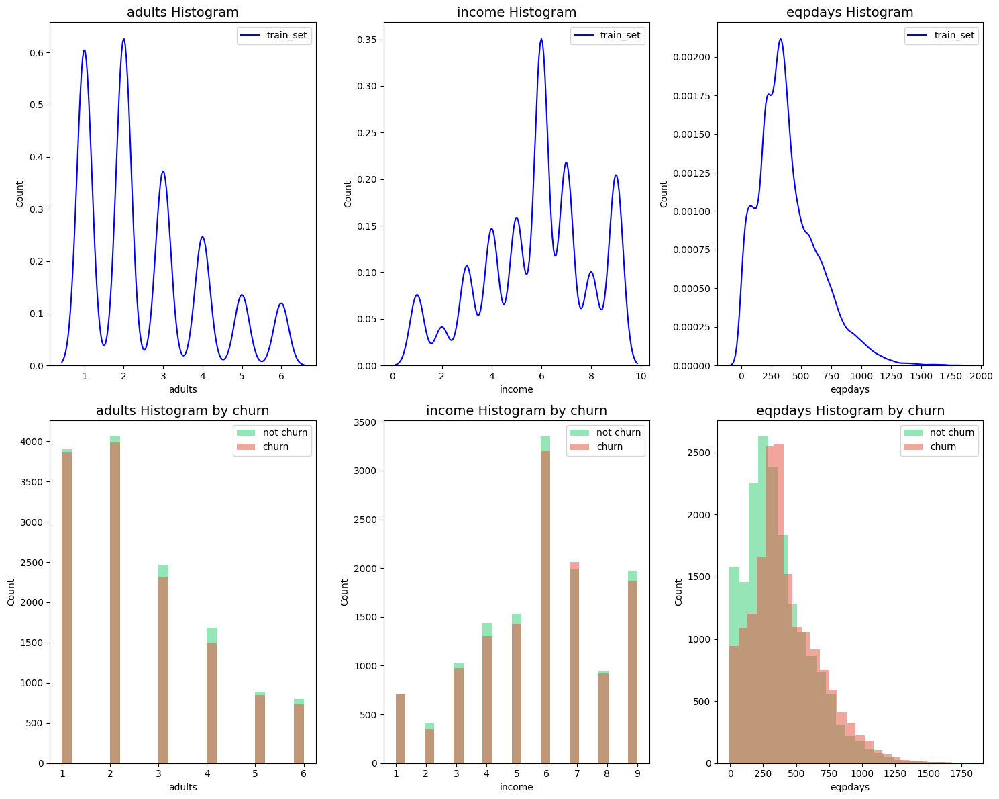

In [21]:
#Visualizing the distributions for numeric features 
for n in range(0,len(numeric_column_list), 5):
    visualize_features(df = train_df, target='churn', features=numeric_column_list[n:n+5])

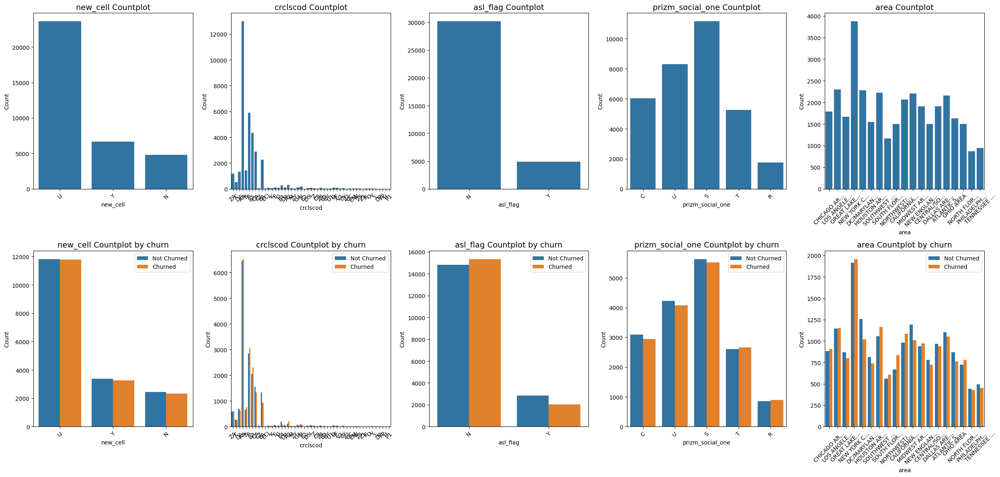

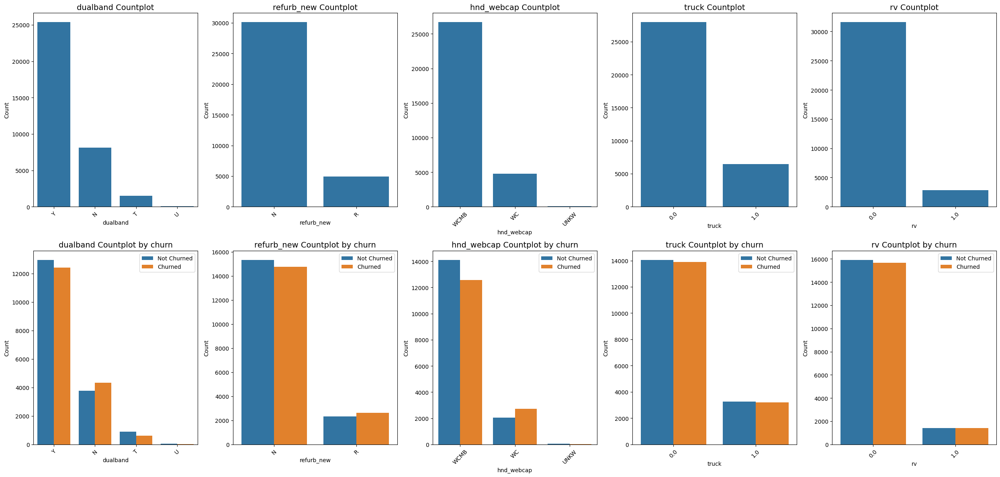

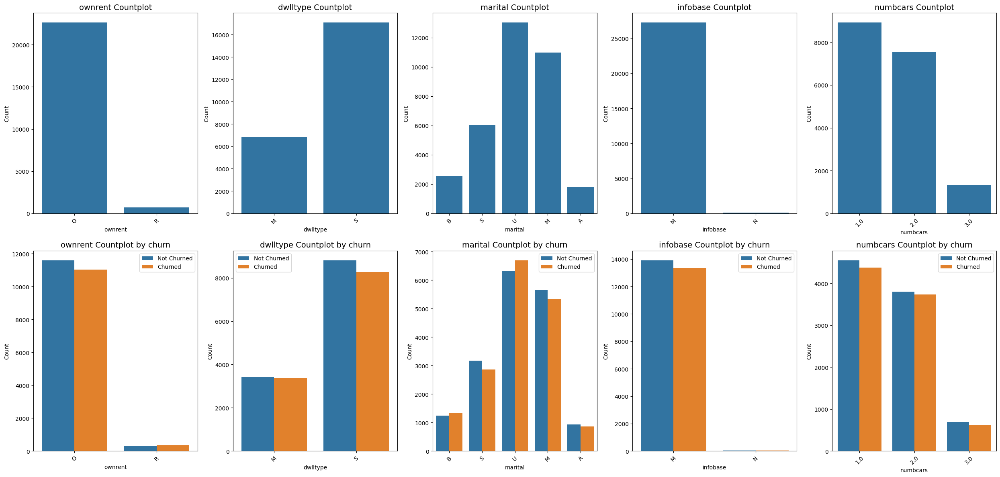

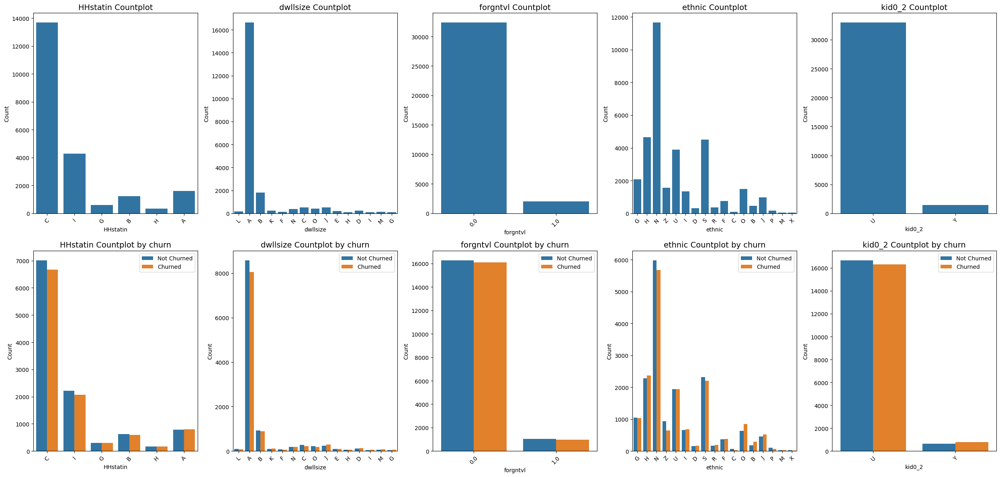

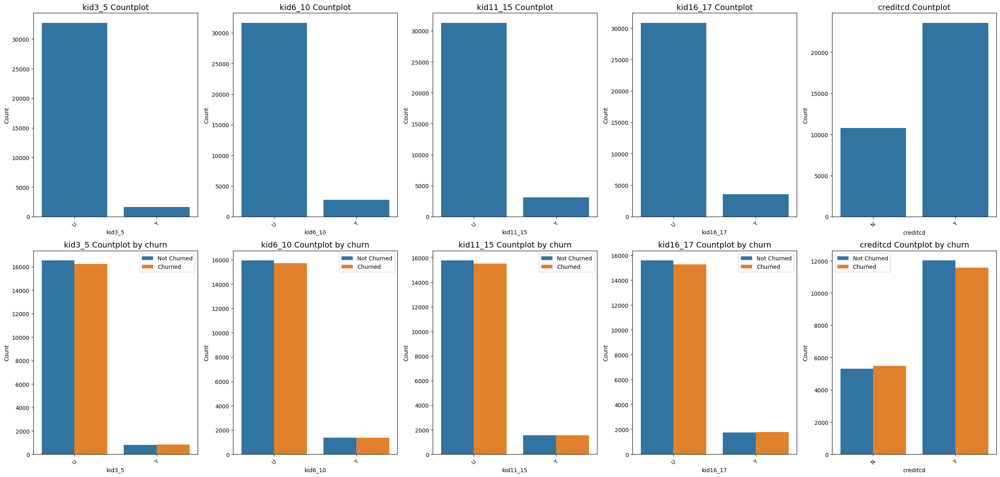

In [22]:
#Visualizing the distributions for categorical features 
for n in range(0,len(categorical_column_list), 5):
    visualize_categorical_features(df = train_df, target='churn', features=categorical_column_list[n:n+5])

In [ ]:
#Visualizing the distributions for categorical features with percentage wise 
#for n in range(0, len(categorical), 3):
#  visualize_categorical_features_percentage_wise(df = train_df, target='churn', features=train_df.select_dtypes(include=['object']).columns[n:n+3])

In [26]:
chi_square_results = chi_square_test(train_df, 'churn', categorical_column_list)
df = pd.DataFrame(list(chi_square_results.items()), columns=['Feature', 'Chi Test Result'])
df = df.sort_values('Chi Test Result', ascending=False)
df

,Feature,Chi Test Result
21,kid6_10,1.000000e+00
9,rv,8.345418e-01
15,HHstatin,8.044394e-01
22,kid11_15,7.397754e-01
8,truck,5.746342e-01
17,forgntvl,3.122333e-01
14,numbcars,2.813339e-01
13,infobase,2.121377e-01
0,new_cell,2.081285e-01
3,prizm_social_one,1.911528e-01


## Analysis and Possible Data Transformation

Our dataset is predominantly positively skewed, with outliers that are significantly larger than the typical data values. To address this, we can apply a log transformation to the data. 

While tree-based models are generally robust to skewness and outliers, other models like logistic regression could be affected. Therefore, applying a log transformation can help normalize the data and reduce the impact of outliers, making our dataset more suitable for a wider range of models.

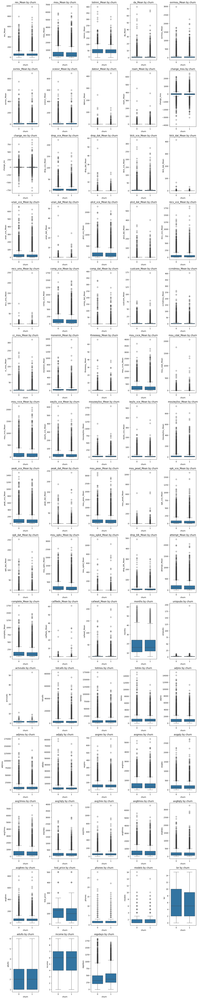

In [27]:
# Outlier analysis
plot_outlier_continuous_variables_classification(train_df,numeric_column_list, 'churn')

## Outlier Analysis and Its Impact on Churn Rate

Upon examining the outliers and their potential effects on the churn rate, we do not observe any significant pattern or correlation between the outliers and the churn rate. This leads us to conclude that the outliers are not significantly affecting the churn rate.

However, it's worth noting that we do have a considerable number of extreme values classified as outliers. This suggests that data trimming or other outlier handling techniques could be valid and beneficial for our further analysis.

## Handling Categorical Columns with Few Categories

From the above analysis, we observe that several categorical columns in our dataset have a very small number of unique categories. This can potentially impact the performance of certain models like Decision Trees, XGBoost, and LightGBM. The reason being, these models make splits based on these categories, and having too few categories might lead to sub-optimal splits.

To address this, we have a couple of strategies:

1. **Grouping Small Categories:** One approach is to group these small categories into a single category. Since these categories don't provide much information individually (due to their small size), combining them can help in reducing the dimensionality without losing much information.

2. **Adjusting Model Parameters:** Another approach is to adjust the `min_samples_split` parameter in our model. This parameter determines the minimum number of samples required to split an internal node. By setting a higher value, we can prevent the model from making splits that result in very small groups.

Both of these strategies aim to improve the performance of our model by ensuring that it can make meaningful splits based on the categorical variables.

In [32]:
# This function groups the small categories below the %70 percent churn rate and %2 of the total data
train_df_grouped = group_small_categories(train_df, categorical_column_list)

In [33]:
for col in categorical_column_list:
    if train_df_grouped[col].nunique() != train_df[col].nunique():
        print(f'new-{col}: {train_df_grouped[col].nunique()} unique values')
        print(f'old-{col}: {train_df[col].nunique()} unique values')


new-crclscod: 9 unique values
old-crclscod: 49 unique values
new-dwllsize: 3 unique values
old-dwllsize: 15 unique values
new-ethnic: 11 unique values
old-ethnic: 17 unique values


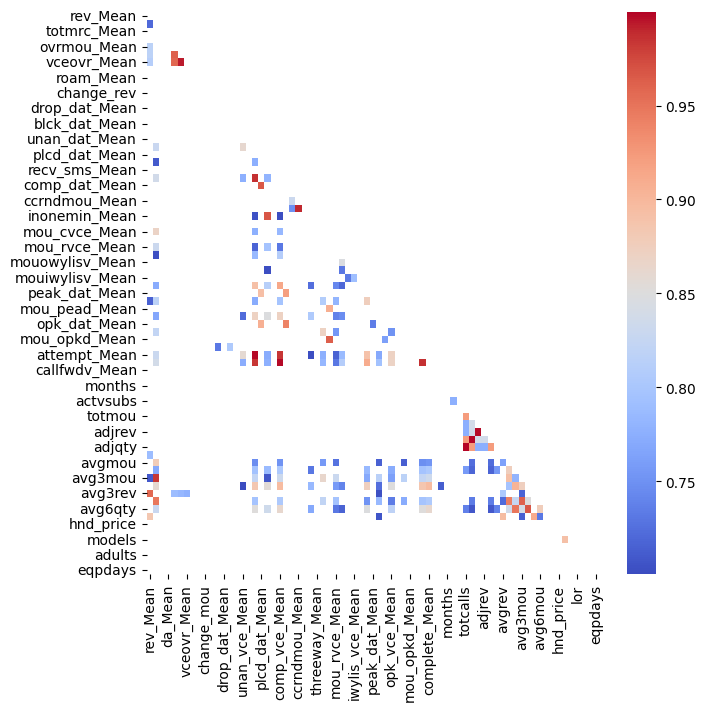

In [34]:
# Usage:
plot_large_correlation_matrix(train_df[numeric_column_list], threshold=0.7)

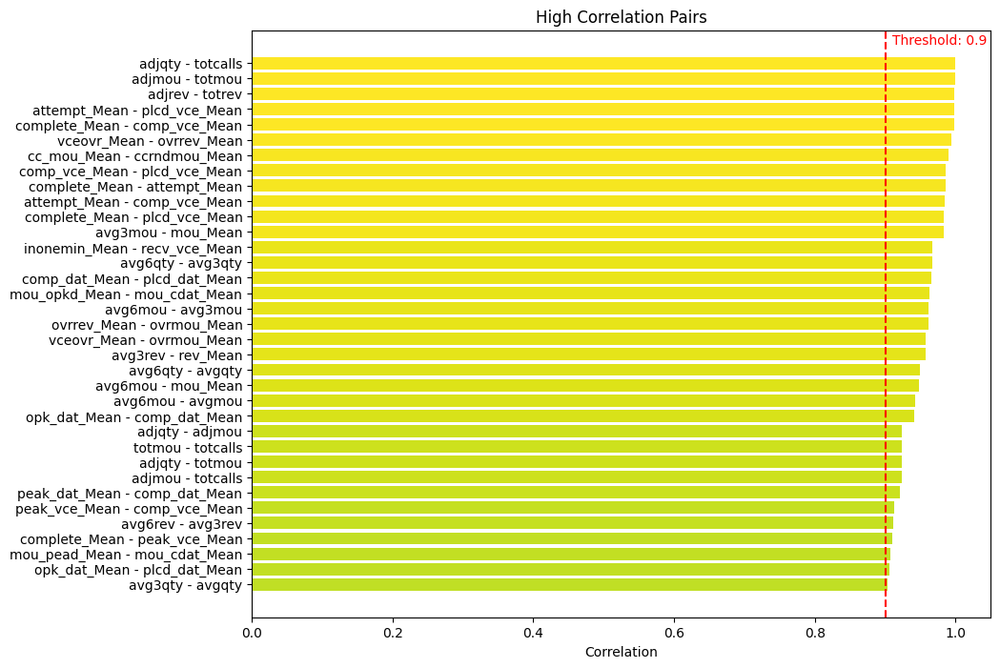

In [35]:
high_corr = high_corr_features(train_df, 0.9)
visualize_high_corr(high_corr)

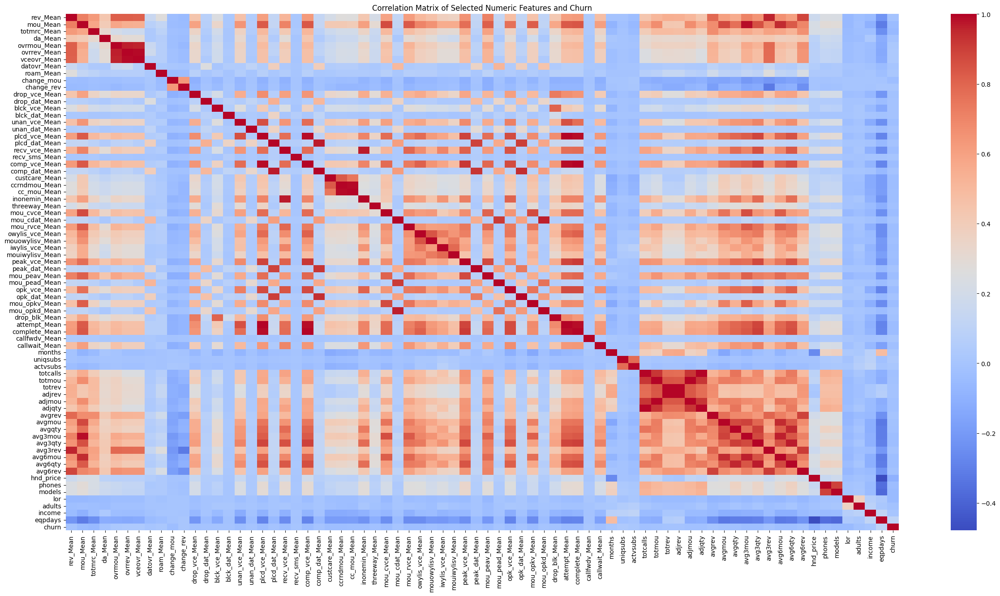

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

columns_to_include = numeric_column_list + ['churn']

# Compute the correlation matrix for the selected columns
correlation_matrix = train_df[columns_to_include].corr()

# Plot the heatmap
plt.figure(figsize=(30, 15))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix of Selected Numeric Features and Churn')
plt.show()



## High Correlation Among Features

Our dataset exhibits a high degree of correlation among its features. Specifically, we have identified 34 pairs of columns that share more than 90% correlation with each other.

High correlation between different features means that these features are conveying similar information to the model. This can lead to issues of multicollinearity in certain models, which can in turn degrade the model's performance.

In the following sections, we will explore strategies to handle this high correlation.



Based on the visualizations and correlation analysis presented above, we can make some informed assumptions about the importance of various features in our dataset.

**Important Features:**
Features such as 'months', 'eqpdays', 'hnd_prices', 'phones', 'mou_Mean', 'totcals', 'totmou' (and generally all 'tot' columns), and 'adj-' columns appear to be significant. These features have strong correlations and their distribution graphs indicate a good spread of data.

**Less Important Features:**
Certain features, however, seem to have less impact. These include some of the categorical columns like 'kid' information(except 6-10 year old as chi square test is quite high), low variance columns like 'blck_dat_Mean', and other columns with low variance. Additionally, features with a high category rate but low divergence, such as 'HHHstatin', may not contribute significantly to our model.

From the visualizations presented above, it's clear that we can construct a logical framework using the binned features. By selecting one feature with a similar density and churn distribution, we can build a classifier, such as a decision tree. This approach is not solely based on visual analysis, but also incorporates scoring methods to ensure the robustness of the model.

In [37]:
from sklearn.metrics import accuracy_score


def calculate_points(row):
    points = 0
    # Rule-based conditions
    if row['eqpdays'] < 400:
        points += 1
    if  400 <= row['eqpdays'] <- 550:
        points -=1
    if row['avg3mou'] < 50:
        points += 1
    if row['uniqsubs'] < 2:
        points += 1
    if row['months'] < 12:
        points += 1
    if 12 <= row['months'] <= 20:
        points -= 1
    if row['change_mou'] > 0:
        points += 1
    if 25 <= row['rev_Mean'] < 45:
        points += 1
    if 45 <= row['rev_Mean'] < 60:
        points -= 1
    if 0 < row['rev_Mean'] < 25:
        points -= 1
    if 45 <= row['rev_Mean'] < 50 :
        points -= 1
    if 0 < row['totmrc_Mean'] < 10:
        points -= 1
    if 30 <= row['totmrc_Mean'] < 75:
        points += 1
    if 10 <= row['totmrc_Mean'] <= 25:
        points -= 1
    if row['phones'] <= 1:
        points += 1

    return points

# Apply the scoring function to each row in the DataFrame
train_df['points'] = train_df.apply(calculate_points, axis=1)

# Predict churn based on the total points
train_df['predicted_churn'] = train_df['points'].apply(lambda x: 1 if x <= 0 else 0)

# Assuming 'churn' column is the actual churn label in the train_df
# 0 means churn, 1 means no churn
actual_churn = train_df['churn']
predicted_churn = train_df['predicted_churn']

# Calculate the accuracy score
accuracy = accuracy_score(actual_churn, predicted_churn)

print(f"Accuracy: {accuracy:.2f}")

# Drop the temporary columns
train_df.drop(columns=['points', 'predicted_churn'], inplace=True)

Accuracy: 0.52


In [44]:
# Basic imputation 

# Impute missing values with the median value of each column and each category with most frequent mode 

train_df_basic_imputed = impute_missing_with_median(train_df, numeric_column_list)

train_df_basic_imputed = impute_missing_with_most_frequent(train_df_basic_imputed, categorical_column_list)

train_df_basic_imputed.isnull().sum().sum()



0

## K-Nearest Neighbors (KNN) Imputation

KNN Imputation is a sophisticated technique for handling missing data. It employs the k-nearest neighbors algorithm to estimate and fill missing values in the dataset.

Compared to basic imputation methods such as mean, median, or mode imputation, KNN Imputation offers a more robust and accurate approach. It considers the 'neighborhood' of the missing value (i.e., similar data points) to make a more informed estimation.

However, KNN Imputation does come with its own set of challenges. Firstly, it is computationally intensive, especially for larger datasets. This can significantly increase the time required for data preprocessing. Secondly, as KNN is a distance-based algorithm, it requires the data to be normalized before imputation. This is to ensure that all features contribute equally to the distance computation, regardless of their scale.

## Normalization and Standardization

During our data analysis, we've observed that our dataset is predominantly skewed. Many of our data points contain either extremely high maximum values or a significant number of outliers.

Given the presence of outliers and skewed data, certain normalization techniques like Absolute Maximum Scaling or Min-Max Scaling are not suitable. These techniques are sensitive to outliers, and applying them could lead to distorted data.

However, there are several techniques that can be effectively used to handle skewed and outlier data, especially when log transformation is not applicable. One such common and effective technique is the Robust Scaler.

### Robust Scaler & Log transformation or Quantile Transformation

The Robust Scaler is a method that centers and scales the data using statistics that are robust to outliers. This makes it a suitable choice for our dataset.
Or we can also use Quantile Transformation on the data they both are quite robust against outliers like in our data 

To implement this, we will first plot the outliers in our data. Based on this plot, we can then apply the Robust Scaler. Alternatively, we could consider log transformation or standardization, depending on the specific characteristics of our data.


In [14]:
positive_skewed_continues_features  = ['rev_Mean','mou_Mean','da_Mean','ovrmou_Mean','ovrrev_Mean','vceovr_Mean','datovr_Mean','roam_Mean','drop_vce_Mean','drop_dat_Mean','blck_vce_Mean','blck_dat_Mean','unan_vce_Mean','unan_dat_Mean','plcd_dat_Mean'
 ,'recv_vce_Mean','recv_sms_Mean','comp_vce_Mean','comp_dat_Mean','custcare_Mean','ccrndmou_Mean','cc_mou_Mean','inonemin_Mean','threeway_Mean','mou_cvce_Mean','mou_cdat_Mean','mou_rvce_Mean','owylis_vce_Mean','mouowylisv_Mean','iwylis_vce_Mean',
 'mouiwylisv_Mean','peak_vce_Mean','peak_dat_Mean','mou_peav_Mean','mou_pead_Mean','opk_vce_Mean','opk_dat_Mean','mou_opkv_Mean','mou_opkd_Mean','drop_blk_Mean','attempt_Mean','complete_Mean','complete_Mean','callfwdv_Mean','callwait_Mean',
 'uniqsubs','actvsubs','totcalls','totmou','totrev','adjrev','adjmou','adjqty','avgrev','avgmou','avgqty','avg3mou','avg3qty','avg3rev','avg6mou','avg6qty','avg6rev','eqpdays']

In [15]:
train_df_ = train_df.copy()
# Quantile Transformer
from sklearn.preprocessing import QuantileTransformer

qt  = QuantileTransformer(output_distribution='normal')

train_df_[positive_skewed_continues_features] = qt.fit_transform(train_df_[positive_skewed_continues_features])

#train_df_basic_imputed[positive_skewed_continues_features].hist(figsize=(20,20))





In [43]:
log_transform_applible_features = filter_columns_for_log_transform(train_df,positive_skewed_continues_features)

In [45]:
train_df_robusted = robust_scaling(train_df, positive_skewed_continues_features)


train_df_basic_imputed = robust_scaling(train_df_basic_imputed, positive_skewed_continues_features)

train_df_log_transformed = apply_log_transform(train_df, log_transform_applible_features)

# For the left over features
train_df_log_transformed = robust_scaling(train_df_log_transformed, [col for col in positive_skewed_continues_features if col not in log_transform_applible_features])

In [16]:
normal_distribution_columns = ['change_mou','change_rev','lor','adults','income','months']


In [46]:
# Standartization as they show normal distribution

train_df_robusted = standardize_columns(train_df_robusted, normal_distribution_columns)


train_df_basic_imputed = standardize_columns(train_df_basic_imputed, normal_distribution_columns)


train_df_log_transformed = standardize_columns(train_df_log_transformed, normal_distribution_columns)

train_df_ = standardize_columns(train_df_, normal_distribution_columns)




In [47]:
# Step 1: Check for infinite values
for df in [train_df_robusted, train_df_basic_imputed, train_df_log_transformed]:
    infinite_values = df.isin([np.inf, -np.inf])
    if infinite_values.any().any():
        print("Infinite values found. Replacing them with NaN...")
        df.replace([np.inf, -np.inf], np.nan, inplace=True)


In [48]:
X_basic_imputed_for_rfe = train_df_basic_imputed.drop(columns=['churn'])
y_basic_imputed_for_rfe = train_df_basic_imputed['churn']

In [18]:
knn_list = numeric_column_list + ['churn']

## KNN Imputation

For our KNN imputation, we will be setting the `n_neighbors` parameter to 5. This means that the imputed value will be chosen based on the five closest neighbors.

We will also be using 'uniform' weights for the imputation. This implies that all neighbors are weighted equally, regardless of their distance. In other words, the impact of a neighbor on the imputed value is not influenced by its distance to the missing value.

An alternative approach could have been to use 'distance' weights. In this case, closer neighbors would have a greater impact on the imputation than those further away. However, for our current purposes, we have chosen to treat all neighbors equally.


In [19]:
imputated_traindf_knn = knn_imputation(train_df_, knn_list, n_neighbors=5,weights='uniform')

In [ ]:
imputated_train_df_knn_mode = impute_missing_with_most_frequent(imputated_traindf_knn, categorical_column_list)

In [ ]:
imputated_traindf_knn.columns[imputated_traindf_knn.isna().sum() != 0]

The Multiple Imputation by Chained Equations (MICE) is a robust imputation method that leverages LightGBM, a gradient boosting framework, to naturally handle categorical types. This method is particularly effective in scenarios where data is Not Missing At Random (NMAR).

In the course of this project, I have experimented with various models using the MICE technique. However, due to the time constraints of this challenge and in the interest of reproducibility, I will only share the relevant code in the sections below.

In [68]:
imputated_traindf_knn

,rev_Mean,mou_Mean,totmrc_Mean,da_Mean,ovrmou_Mean,ovrrev_Mean,vceovr_Mean,datovr_Mean,roam_Mean,change_mou,change_rev,drop_vce_Mean,drop_dat_Mean,blck_vce_Mean,blck_dat_Mean,unan_vce_Mean,unan_dat_Mean,plcd_vce_Mean,plcd_dat_Mean,recv_vce_Mean,recv_sms_Mean,comp_vce_Mean,comp_dat_Mean,custcare_Mean,ccrndmou_Mean,cc_mou_Mean,inonemin_Mean,threeway_Mean,mou_cvce_Mean,mou_cdat_Mean,mou_rvce_Mean,owylis_vce_Mean,mouowylisv_Mean,iwylis_vce_Mean,mouiwylisv_Mean,peak_vce_Mean,peak_dat_Mean,mou_peav_Mean,mou_pead_Mean,opk_vce_Mean,opk_dat_Mean,mou_opkv_Mean,mou_opkd_Mean,drop_blk_Mean,attempt_Mean,complete_Mean,callfwdv_Mean,callwait_Mean,months,uniqsubs,actvsubs,new_cell,crclscod,asl_flag,totcalls,totmou,totrev,adjrev,adjmou,adjqty,avgrev,avgmou,avgqty,avg3mou,avg3qty,avg3rev,avg6mou,avg6qty,avg6rev,prizm_social_one,area,dualband,refurb_new,hnd_price,phones,models,hnd_webcap,truck,rv,ownrent,lor,dwlltype,marital,adults,infobase,income,numbcars,HHstatin,dwllsize,forgntvl,ethnic,kid0_2,kid3_5,kid6_10,kid11_15,kid16_17,creditcd,eqpdays,churn
19260,1.538824,0.495161,33.333333,1.485276,0.585977,0.528192,0.541297,-5.199338,2.923107,0.365650,-0.421313,1.404533,-5.199338,-0.189310,-5.199338,0.922330,-5.199338,147.666667,-5.199338,-0.202098,-5.199338,0.106841,-5.199338,0.723343,1.275302,1.380863,-0.225202,0.814401,0.388876,-5.199338,-0.001566,0.476619,0.582130,-0.184203,-0.262686,-0.055229,-5.199338,0.217729,-5.199338,0.040157,-5.199338,0.346832,-5.199338,1.004131,0.338834,0.103057,-5.199338,-5.199338,0.023177,-5.199338,-0.370902,U,ZA,N,0.104395,0.529080,1.129102,1.160366,0.540954,0.117486,1.169413,0.319913,-0.116966,0.489307,0.092972,1.501861,0.074087,-0.321611,1.070745,NaN,CHICAGO AREA,Y,N,79.98999,1.0,1.0,WCMB,0.0,0.0,NaN,-1.312003,M,B,-1.059309,M,-1.741281,1.0,C,L,0.0,G,U,U,U,U,U,N,0.761353,1.0
35703,0.710069,1.702604,61.980000,-5.199338,0.903301,0.828364,0.841656,-5.199338,-5.199338,-1.902034,0.266122,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,0.000000,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-0.705884,0.708752,-0.370902,U,C,N,0.854591,1.569995,0.280558,0.194997,1.501651,0.793100,1.022041,2.259990,1.328338,1.809317,1.019956,0.653377,1.969415,1.176890,0.778225,C,LOS ANGELES AREA,N,N,129.98999,1.0,1.0,WCMB,0.0,0.0,O,-0.044657,S,S,-0.373009,M,0.551316,2.0,I,A,0.0,H,U,U,U,U,U,Y,0.072829,1.0
32721,0.922555,2.124192,84.990000,0.858910,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,0.886102,0.021561,3.108580,-5.199338,0.821412,-5.199338,1.948471,-5.199338,623.000000,-5.199338,3.140668,-5.199338,2.042638,-5.199338,1.620592,1.307063,1.275265,3.166721,2.256745,1.232247,-5.199338,2.305007,2.385264,1.959694,2.220032,1.684161,2.387471,-5.199338,1.692535,-5.199338,2.369341,-5.199338,1.634219,-5.199338,2.595615,2.072958,2.031784,-5.199338,1.597698,-0.914187,-5.199338,-0.370902,Y,DA,Y,1.625391,1.233213,0.115500,0.050393,1.248348,1.636800,1.248381,2.296833,2.709644,2.016977,2.497149,0.908975,2.063410,2.547523,1.301191,U,GREAT LAKES AREA,Y,R,79.98999,4.0,3.0,WCMB,0.0,0.0,NaN,-0.889554,S,U,-0.373009,M,-1.282762,1.0,G,A,0.0,N,U,U,U,U,U,N,-0.993800,0.0
23330,-1.093272,-1.126866,39.990000,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,-5.199338,0.039443,0.032431,0.000000,-5.199338,-5.199338,-5.199338,-0.835558,-5.199338,40.333333,-5.199338,-0.240671,-5.199338,-0.577557,-5.199338,-5.199338,-5.199338,-5.199338,0.028859,-5.199338,-0.876297,-5.199338,-0.591446,-0.589456,-0.347927,-5.199338,-5.199338,-0.583496,-5.199338,-0.876006,-5.199338,-0.362850,-5.199338,-0.706870,-5.199338,-0.387078,-0.654930,-0.580524,-5.199338,-5.199338,-0.289277,-5.199338,-0.370902,U,AA,N,-1.146647,-1.428090,-0.425211,-0.778416,-1.405974,-1.123415,-1.355497,-1.445012,-1.207722,-1.121060,-0.819656,-1.046576,-1.2

In [71]:
imputated_traindf_knn.columns

Index(['rev_Mean', 'mou_Mean', 'totmrc_Mean', 'da_Mean', 'ovrmou_Mean',
       'ovrrev_Mean', 'vceovr_Mean', 'datovr_Mean', 'roam_Mean', 'change_mou',
       'change_rev', 'drop_vce_Mean', 'drop_dat_Mean', 'blck_vce_Mean',
       'blck_dat_Mean', 'unan_vce_Mean', 'unan_dat_Mean', 'plcd_vce_Mean',
       'plcd_dat_Mean', 'recv_vce_Mean', 'recv_sms_Mean', 'comp_vce_Mean',
       'comp_dat_Mean', 'custcare_Mean', 'ccrndmou_Mean', 'cc_mou_Mean',
       'inonemin_Mean', 'threeway_Mean', 'mou_cvce_Mean', 'mou_cdat_Mean',
       'mou_rvce_Mean', 'owylis_vce_Mean', 'mouowylisv_Mean',
       'iwylis_vce_Mean', 'mouiwylisv_Mean', 'peak_vce_Mean', 'peak_dat_Mean',
       'mou_peav_Mean', 'mou_pead_Mean', 'opk_vce_Mean', 'opk_dat_Mean',
       'mou_opkv_Mean', 'mou_opkd_Mean', 'drop_blk_Mean', 'attempt_Mean',
       'complete_Mean', 'callfwdv_Mean', 'callwait_Mean', 'months', 'uniqsubs',
       'actvsubs', 'new_cell', 'crclscod', 'asl_flag', 'totcalls', 'totmou',
       'totrev', 'adjrev', 'adjmou

# MICE Library Overview

The MICE (Multivariate Imputation by Chained Equations) library is a powerful tool for handling missing data in datasets. It leverages the LightGBM gradient boosting framework to fill missing values, providing a more sophisticated approach than simple random imputation.

## Key Features

- **Configurable Category Type Setting**: MICE allows for flexible configuration of category types, enabling more precise data imputation.

- **Feature Importance (SHAP Values)**: MICE supports the calculation of SHAP (SHapley Additive exPlanations) values, which provide a measure of the importance of each feature in the dataset. This can be particularly useful for understanding the impact of different features on model predictions. However, it's worth noting that this feature can be computationally intensive.

## Considerations

While MICE provides a robust and flexible approach to data imputation, it's important to be aware of the computational resources it may require, particularly when calculating SHAP values. As with any tool, it's essential to balance the benefits of its use with the potential costs in terms of computational time and power.

In [20]:
import miceforest as mf 

from miceforest import (
  mean_match_default,
  mean_match_fast_cat,
  mean_match_shap
)

# First we have to convert the categorical columns to the category type for the miceforest to work properly
imputated_traindf_knn[categorical_column_list] = imputated_traindf_knn[categorical_column_list].astype('category')


# For the parameters as our data is not really big we can use the mid mean_match_default with reasoneble performance and reasonable speed 
# highest performance and the slowest method for the imputation is the mean_match_shap which uses shap valeus, it should be used for the best performance given enough computational resources and time
# which is mean_match_shap(which looks at the shap values), we will pass the hole data set as well as the categorical column list to the imputation kernel

# We could create an imputation kernel and give a random state for reproducibility
kds = mf.ImputationKernel(
    data = imputated_traindf_knn,
    mean_match_scheme=mean_match_default,
)


# Number of iterations to do for the implementation, higher the better, we should decide which number to use by looking at the computational power and the time we have
# For this particular length and size churn data we can use 10 iterations for the imputation(which takes around 50 minutes on cpu on a 2019 macbook pro)
# As stated in the warnings its important to use min_data_in_leaf or similar parameter in other ml models as data contains some rare classes 
kds.mice(2)

imputated_traindf_mice = kds.complete_data()

/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/miceforest/ImputationKernel.py:370: UserWarning: [crclscod,ethnic] have very rare categories, it is a good idea to group these, or set the min_data_in_leaf parameter to prevent lightgbm from outputting 0.0 probabilities.
  warn(


## Encoding Categorical Variables

Now that we have dealt with the missing values, our next step is to encode the categorical variables. This is a necessary step as most machine learning models require numerical input.

There are several encoding techniques that we can use for our use case:

- **Ordinal Encoding**: For ordinal variables, i.e., variables where the order matters, we can use ordinal encoding. This technique converts each unique category value into an integer, thereby preserving the order of the categories.

- **One-Hot Encoding**: For nominal variables, i.e., variables where the order does not matter, we can use one-hot encoding. This technique creates a new binary column for each category of the variable.

By using these encoding techniques, we can transform our categorical data into a format that can be better understood by our model.

In [21]:
# We can use the ordinal encoding for the following columns
# We have achieved this knowledge by looking at the analysis and domain knowledge acquired by the internet

one_hot_encoding_columns = ['new_cell','crclscod','asl_flag','prizm_social_one','refurb_new',
                            'area','dualband','hnd_webcap','ownrent','dwlltype',
                            'marital','infobase','HHstatin','ethnic','kid0_2',
                            'kid3_5','kid6_10','kid11_15','kid16_17','creditcd']





In [78]:
# Now we have dealt with the the missing values, we can now encode the categorical variables for the model to work properly

# There are several encoding techniques that can be used for the our use case, 

# We can use the ordinal encoding for the ordinal variables, and one hot encoding for the nominal variables,


# Ordinal Encoding

ordinal_encoding_columns = []

# We will be using drop_first to true in order to get rid of the dummy variable trap

train_df_basic_imputed_encoded  = one_hot_encoding(train_df_basic_imputed, one_hot_encoding_columns)

#train_df_knn_imputed_mode_encoded = one_hot_encoding(imputated_train_df_knn, one_hot_encoding_columns)

#train_df_mice_imputed = one_hot_encoding(imputated_traindf_mice, one_hot_encoding_columns)

train_df_log_transformed_encoded = one_hot_encoding(train_df_log_transformed, one_hot_encoding_columns)









## Ordinal Encoding

In our dataset, we have several columns that could potentially be suitable for ordinal encoding, such as 'dwellsize'. However, without specific domain knowledge or additional information about these variables, we can't establish a meaningful order for their categories.

In such cases, we might resort to mapping the categories to numbers in a random manner. However, it's important to note that this approach might not always yield the most accurate results, as it doesn't take into account any inherent order that might exist among the categories.

For demonstration purposes in this section, we will proceed with ordinal encoding based on alphabetical order by default. This approach, while arbitrary, allows us to convert the categorical variables into a format that can be processed by our model.

In [22]:
ordinal_encoding_columns = ['dwllsize']


In [85]:

#train_df_knn_imputed = ordinal_encoding(train_df_knn_imputed, ordinal_encoding_columns)

#train_df_basic_imputed_encoded = ordinal_encoding(train_df_basic_imputed_encoded, ordinal_encoding_columns)

#train_df_mice_imputed = ordinal_encoding(train_df_mice_imputed, ordinal_encoding_columns)

#train_df_log_transformed_encoded = ordinal_encoding(train_df_log_transformed_encoded, ordinal_encoding_columns)



In [ ]:
# X, y split for the different imputation methods

X_knn_imputed = imputated_traindf_mice.drop(columns=['churn'])
y_knn_imputed = imputated_traindf_mice['churn']

#X_basic_imputed_encoded = train_df_basic_imputed_encoded.drop(columns=['churn'])
#y_basic_imputed = train_df_basic_imputed_encoded['churn']


#X_mice_imputed = train_df_mice_imputed.drop(columns=['churn'])
#y_mice_imputed = train_df_mice_imputed['churn']

#X_log_transformed_encoded = train_df_log_transformed_encoded.drop(columns=['churn'])
#y_log_transformed = train_df_log_transformed_encoded['churn']

In [ ]:
# One thing is that while doing RFE its hard to interpred with the one hot encoding, so its wise to use ordinal encoding even though models might capture a little bit less information
# but it will be easier to converge and because we will be using DecisionTree as our feature selection model (Random forest should be better but we are using DecisionTree for the sake of this case study)
# Tree based model is very robust against linear relationship in the columns 


## Feature Selection

Feature selection is a crucial step in the machine learning pipeline. It allows us to select the most relevant features for our model, thereby improving its performance and interpretability. There are several feature selection techniques that we can use:

- **Filter Techniques**: These include methods like low variance filter, high correlation filter, and high missing values filter. These techniques are simple and quick to apply, but they do not take into account the model's performance.

- **Wrapper Techniques**: These include methods like Recursive Feature Elimination (RFE), Forward Selection, and Backward Elimination. These techniques consider the performance of a given model to select the best features, but they can be computationally expensive.

- **Embedded Techniques**: These include methods like Lasso, Ridge, and Elastic Net. These techniques perform feature selection during the model training process, which can lead to better performance and less computational cost.

- **Feature Importance**: These methods use machine learning algorithms like Decision Trees, Random Forests, and XGBoost to rank features based on their importance.

Each of these techniques has its own strengths and weaknesses, and the choice of technique can depend on factors like computational resources and the specific requirements of the project.

Since we have already dealt with missing values and normalization, we can use any of the above feature selection techniques. We will be trying different combinations to see which one works best for our data.

Filter techniques are a good starting point as they can help eliminate features with very high correlation or very low variance. However, wrapper methods can often lead to better performance as they use the model itself for feature selection.

For our current purposes, we will be using Recursive Feature Elimination (RFE) for feature selection.

This process of rfe takes about an hour in a macbook pro 2019 cpu, given the duration and the scope of the task we will only be using decision tree classifier to select the features with rfe 

## Feature Selection, Encoding, and Model Selection

When performing Recursive Feature Elimination (RFE), one-hot encoding can make interpretation difficult. Therefore, it's often more practical to use ordinal encoding. While models might capture slightly less information with ordinal encoding, it facilitates easier model convergence.

for the final model selection tecnique, we will be using CatBoostClassifier. CatBoost has the advantage of handling categorical features by default, which makes it a great choice for this task. Therefore, we will be performing wrapper based method with CatBoostClassifier using feature importance alongside with cross validation.

It's important to note that tree-based models, like the Decision Tree, Random Forest, and CatBoost, are robust against linear relationships in the columns. This makes them a particularly good choice for this task.

In [ ]:
# Demonstration purposes 
from sklearn.feature_selection import RFECV,RFE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
#estimator = LogisticRegression(max_iter=100,random_state=42)
estimator = DecisionTreeClassifier()
selector = RFECV(estimator, step=5, cv=StratifiedKFold(3),scoring='accuracy')

selector = selector.fit(X_basic_imputed_encoded, y_basic_imputed)
selector.support_





In [ ]:
cv_results = pd.DataFrame(selector.cv_results_)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.errorbar(
    x=cv_results["n_features"],
    y=cv_results["mean_test_score"],
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()

In [23]:
X_basic_imputed_for_rfe = imputated_traindf_mice.copy().drop(columns=['churn'])
y_basic_imputed_for_rfe = imputated_traindf_mice['churn']


In [29]:
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
import pandas as pd
import numpy as np

# Assuming X_basic_imputed_for_rfe and y_basic_imputed_for_rfe are already defined

# Convert categorical features to category dtype for CatBoost
categorical_cols = categorical_column_list
X_basic_imputed_for_rfe[categorical_cols] = X_basic_imputed_for_rfe[categorical_cols].astype('category')

# Ensure categorical features are strings
for col in categorical_cols:
    X_basic_imputed_for_rfe[col] = X_basic_imputed_for_rfe[col].astype(str)

# Identify categorical features by indices
categorical_features_indices = [i for i, col in enumerate(X_basic_imputed_for_rfe.columns) if col in categorical_cols]

# Define the estimator
estimator = CatBoostClassifier(verbose=0)  # Add verbose=0 to suppress output

# Define Stratified K-Fold
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Initialize variable to store feature importances
feature_importances = np.zeros(X_basic_imputed_for_rfe.shape[1])

# Cross-validation loop
for train_idx, test_idx in cv.split(X_basic_imputed_for_rfe, y_basic_imputed_for_rfe):
    X_train, X_test = X_basic_imputed_for_rfe.iloc[train_idx], X_basic_imputed_for_rfe.iloc[test_idx]
    y_train, y_test = y_basic_imputed_for_rfe.iloc[train_idx], y_basic_imputed_for_rfe.iloc[test_idx]
    
    # Ensure categorical features are strings in each fold
    for col in categorical_cols:
        X_train[col] = X_train[col].astype(str)
        X_test[col] = X_test[col].astype(str)
    
    # Fit the model
    estimator.fit(X_train, y_train, cat_features=categorical_features_indices)
    
    # Accumulate feature importances
    feature_importances += estimator.feature_importances_

# Average feature importances
feature_importances /= cv.get_n_splits()

# Select the most important features based on importances
important_features = np.argsort(feature_importances)[::-1]  # Sort in descending order

# Print the most important features
print("Most important features (indices):", important_features)




/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_24418/1426443728.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train[col] = X_train[col].astype(str)
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_24418/1426443728.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test[col] = X_test[col].astype(str)
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_24418/1426443728.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

Most important features (indices): [48 97  9  1  2 10 52 73 62 80 11 61 60 90 70 63  0 85 28 57 49 34 15 43
 26 56 68  5 39 41 58  8 35 32 13 37 33 54 59 82 25  4 64 74 55 31 30 76
 23  3  6 66 65 19 67 69 47 83 88 24 50 21 53 45 71 87 17 96 44 51 86 27
  7 72 38 95 91 29 75 16 12 42 78 84 18 40 92 93 81 20 79 77 36 94 46 22
 14 89]


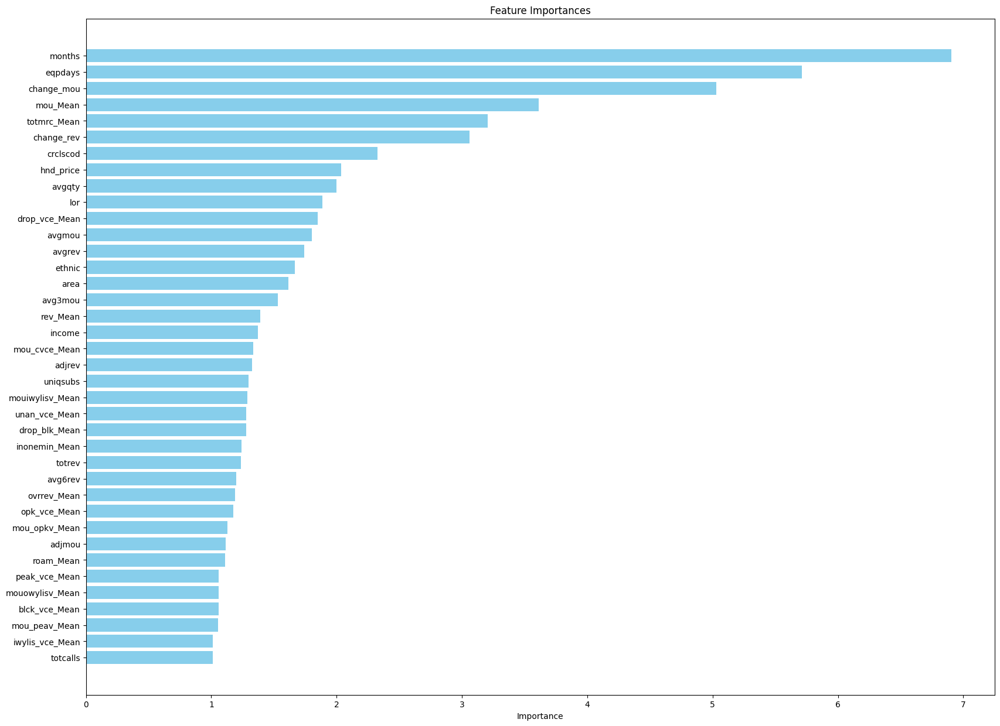

In [30]:
# Create a DataFrame of feature importances
feature_importances_df = pd.DataFrame({
    'Feature': X_basic_imputed_for_rfe.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Filter features based on the threshold
selected_features_df = feature_importances_df[feature_importances_df['Importance'] > threshold]

# Plot the feature importances if requested

plt.figure(figsize=(20, 15))
plt.barh(selected_features_df['Feature'], selected_features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.title('Feature Importances')
plt.gca().invert_yaxis()
plt.show()

In [31]:
selected_features = important_features[feature_importances[important_features] > np.mean(feature_importances)]
X_basic_imputed_for_rfe.iloc[:,selected_features].columns

Index(['months', 'eqpdays', 'change_mou', 'mou_Mean', 'totmrc_Mean',
       'change_rev', 'crclscod', 'hnd_price', 'avgqty', 'lor', 'drop_vce_Mean',
       'avgmou', 'avgrev', 'ethnic', 'area', 'avg3mou', 'rev_Mean', 'income',
       'mou_cvce_Mean', 'adjrev', 'uniqsubs', 'mouiwylisv_Mean',
       'unan_vce_Mean', 'drop_blk_Mean', 'inonemin_Mean', 'totrev', 'avg6rev',
       'ovrrev_Mean', 'opk_vce_Mean', 'mou_opkv_Mean', 'adjmou', 'roam_Mean',
       'peak_vce_Mean', 'mouowylisv_Mean', 'blck_vce_Mean', 'mou_peav_Mean'],
      dtype='object')

In [26]:
"""best_features = ['months', 'eqpdays', 'change_mou', 'mou_Mean', 'totmrc_Mean',
       'change_rev', 'crclscod', 'hnd_price', 'avgqty', 'lor', 'drop_vce_Mean',
       'avgmou', 'avgrev', 'ethnic', 'area', 'avg3mou', 'rev_Mean', 'income',
       'mou_cvce_Mean', 'adjrev', 'uniqsubs', 'mouiwylisv_Mean',
       'unan_vce_Mean', 'drop_blk_Mean', 'inonemin_Mean', 'totrev', 'avg6rev',
       'ovrrev_Mean', 'opk_vce_Mean', 'mou_opkv_Mean', 'adjmou', 'roam_Mean',
       'peak_vce_Mean', 'mouowylisv_Mean', 'blck_vce_Mean', 'mou_peav_Mean']"""

"best_features = ['months', 'eqpdays', 'change_mou', 'mou_Mean', 'totmrc_Mean',\n       'change_rev', 'crclscod', 'avgqty', 'hnd_price', 'lor', 'avgmou',\n       'drop_vce_Mean', 'area', 'ethnic', 'avg3mou', 'avgrev', 'rev_Mean',\n       'unan_vce_Mean', 'income', 'totrev', 'adjrev', 'uniqsubs',\n       'mou_cvce_Mean', 'mouiwylisv_Mean', 'totcalls', 'inonemin_Mean',\n       'drop_blk_Mean', 'roam_Mean', 'opk_vce_Mean', 'avg3qty', 'avg6rev',\n       'peak_vce_Mean', 'mouowylisv_Mean', 'adjqty', 'mou_opkv_Mean']"

## Summary of Preprocessing and Next Steps

We have completed a series of preprocessing steps to prepare our data for modeling. These steps included the use of various imputation methods, such as KNN, and the application of Recursive Feature Elimination (RFE) for feature selection. These steps were necessary to handle missing data and reduce dimensionality, respectively.

With preprocessing complete, we are now ready to encode our selected features. Encoding is a critical step that ensures our models can interpret the categorical variables correctly.

While some models, like CatBoost, can handle categorical variables without encoding, we have chosen to apply encoding universally. This decision aligns with our approach to feature scaling. Although tree-based models do not require scaled features, models like Logistic Regression do. To ensure consistency and optimal performance across all models, we have applied both encoding and scaling to our features.

In addition to the above, we plan to conduct experiments with different datasets. However we could not test all possible models within this notebook. Models using MICE imputation or Chi-squared tests, for example, are not included in our experiments. Despite this, we have showcased these models for future reference and exploration.

In [32]:
X_selected = imputated_traindf_mice[imputated_traindf_mice.iloc[:,selected_features].columns]
X_selected['churn'] = imputated_traindf_mice['churn']

one_hot_encoding_cols = [x for x in X_selected.columns if x in one_hot_encoding_columns]

ordinal_encoding_cols = [x for x in X_selected.columns if x in ordinal_encoding_columns]

X_selected = one_hot_encoding(X_selected, one_hot_encoding_cols)
X_selected = ordinal_encoding(X_selected, ordinal_encoding_cols)
#X_selected = ordinal_encoding(X_selected, one_hot_encoding_cols)

X_selected = X_selected.drop(columns=['churn'])
y_selected = imputated_traindf_mice['churn']






/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_24418/3238577434.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected['churn'] = imputated_traindf_mice['churn']


In [33]:
X_selected,y_selected

(         months   eqpdays  change_mou  mou_Mean  totmrc_Mean  change_rev  \
 19260  0.023177  0.774833    0.365650  0.509937    33.333333   -0.421313   
 35703 -0.705884  0.075345   -1.902034  1.694923    61.980000    0.266122   
 32721 -0.914187 -0.977487    0.886102  2.096715    84.990000    0.021561   
 23330 -0.289277  0.570161    0.039443 -1.132898    39.990000    0.032431   
 13272  0.335632 -0.404717   -0.819868  1.336110    74.395000   -0.145167   
 ...         ...       ...         ...       ...          ...         ...   
 11284  0.856391  1.505747   -0.182440 -0.166791    40.157500   -0.812015   
 44732 -0.810036 -0.057742    0.130921 -0.593940    39.990000    0.026025   
 38158 -1.018339 -0.313694   -0.770236  0.491827    54.990000    0.032431   
 860    2.626969  2.663720    0.056960 -1.651622    16.990000    0.019297   
 15795  0.023177  0.781626    0.516297  0.827686    10.000000    0.020785   
 
        hnd_price    avgqty       lor  drop_vce_Mean    avgmou    avgrev  

## Experimentation and Model Selection

In our experimentation, we've compared the use of Decision Tree and CatBoost for Recursive Feature Elimination (RFE). Both methods yielded similar results, but CatBoost demonstrated superior handling of categorical features.

While Decision Trees can work with one-hot encoded categorical variables, it's challenging to achieve optimal results for feature selection with categorical variables in RFE. This is due to the need to calculate overall feature importance from all the one-hot encoded columns, which can be computationally intensive and time-consuming. In our case, it took around an hour to run.

With RFE our feature selection we have selected 34 columns which is the listed above as information gain with the decision tree model with DecisionTree


On the other hand, CatBoost, with its inherent ability to handle categorical features, proved to be much more time-efficient. Furthermore, CatBoost is robust against linear relationships in the data, making it an excellent choice for feature selection in this context.

Therefore, for the sake of efficiency and robustness, we've chosen to proceed with CatBoost for our feature selection process.
With RFE our feature selection we have selected 34 columns which is the listed above as information gain with the decision tree model



In [103]:
from sklearn.metrics import accuracy_score,f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.tree import DecisionTreeClassifier

def objective_decision_tree(trial,X,y):
    param = {
        "max_depth": trial.suggest_int('max_depth',2,20),
        "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
    }

    # Initialize the StratifiedKFold object
    skf = StratifiedKFold(n_splits=3)
    
    model = DecisionTreeClassifier().set_params(**param)

    scores = []
    for train_index, val_index in skf.split(X,y):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]
        # Train model with the given hyperparameters
        model.fit(X_train, y_train_fold)

        # Predict and calculate AUCPR score on validation set
        y_val_pred = model.predict(X_val)
        score = accuracy_score(y_val_fold, y_val_pred)
        scores.append(score)
    
    if trial.number % 5 == 0:
        plot_confusion_matrix(y_val_fold, y_val_pred, class_names = ['not_churn','churn'])
        # Get feature importance
        #plot_feature_importance(model, X_train)

    
    return np.mean(scores)


[I 2024-05-30 00:06:53,994] A new study created in memory with name: Decision Tree Study
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),


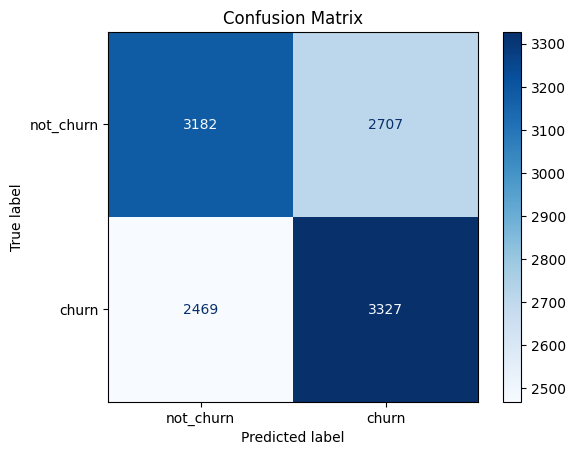

[I 2024-05-30 00:06:57,421] Trial 0 finished with value: 0.5622307802025389 and parameters: {'max_depth': 16, 'min_samples_split': 50}. Best is trial 0 with value: 0.5622307802025389.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:00,624] Trial 1 finished with value: 0.5546141777207246 and parameters: {'max_depth': 19, 'min_samples_split': 14}. Best is trial 0 with value: 0.5622307802025389.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:03,190] Trial 2 finished with value: 0.5598060191128228 and pa

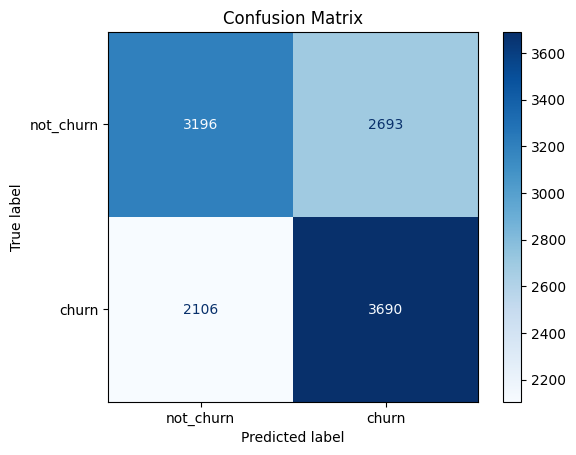

[I 2024-05-30 00:07:09,825] Trial 5 finished with value: 0.587448295535587 and parameters: {'max_depth': 10, 'min_samples_split': 50}. Best is trial 5 with value: 0.587448295535587.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:12,173] Trial 6 finished with value: 0.57378405363001 and parameters: {'max_depth': 13, 'min_samples_split': 29}. Best is trial 5 with value: 0.587448295535587.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:14,507] Trial 7 finished with value: 0.5691056910569104 and paramet

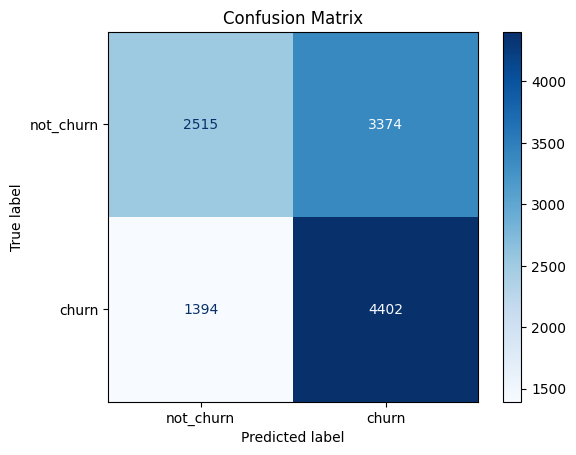

[I 2024-05-30 00:07:19,997] Trial 10 finished with value: 0.589273998003138 and parameters: {'max_depth': 3, 'min_samples_split': 38}. Best is trial 10 with value: 0.589273998003138.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:20,684] Trial 11 finished with value: 0.589273998003138 and parameters: {'max_depth': 3, 'min_samples_split': 35}. Best is trial 10 with value: 0.589273998003138.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:21,138] Trial 12 finished with value: 0.5783197831978321 and par

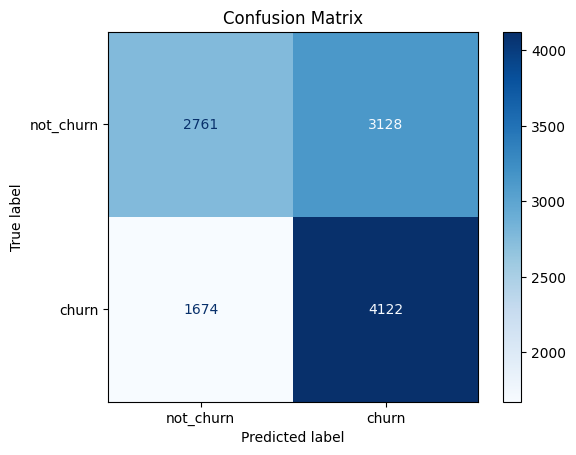

[I 2024-05-30 00:07:23,668] Trial 15 finished with value: 0.5865639709028669 and parameters: {'max_depth': 5, 'min_samples_split': 29}. Best is trial 10 with value: 0.589273998003138.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:24,787] Trial 16 finished with value: 0.5914134930822993 and parameters: {'max_depth': 6, 'min_samples_split': 41}. Best is trial 16 with value: 0.5914134930822993.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:25,965] Trial 17 finished with value: 0.5914420196833547 and 

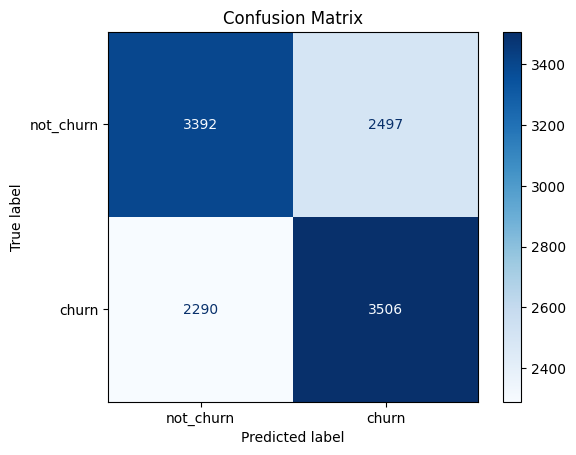

[I 2024-05-30 00:07:30,461] Trial 20 finished with value: 0.591042647268578 and parameters: {'max_depth': 8, 'min_samples_split': 44}. Best is trial 19 with value: 0.5915561260875767.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:31,884] Trial 21 finished with value: 0.5916417058907432 and parameters: {'max_depth': 7, 'min_samples_split': 44}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:33,303] Trial 22 finished with value: 0.5915561260875767 and 

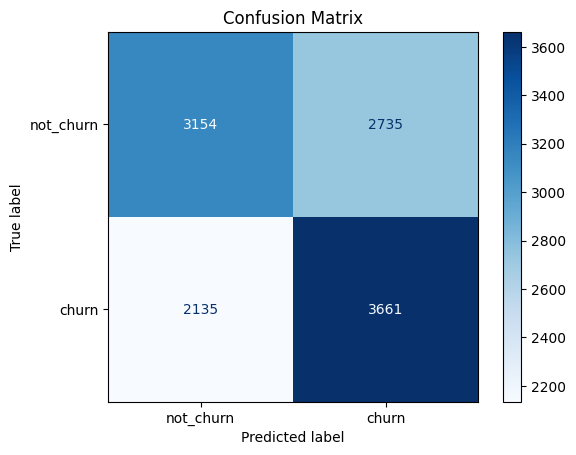

[I 2024-05-30 00:07:39,538] Trial 25 finished with value: 0.5818856083297675 and parameters: {'max_depth': 11, 'min_samples_split': 44}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:40,957] Trial 26 finished with value: 0.5916417058907432 and parameters: {'max_depth': 7, 'min_samples_split': 47}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:41,759] Trial 27 finished with value: 0.5887605191841393 an

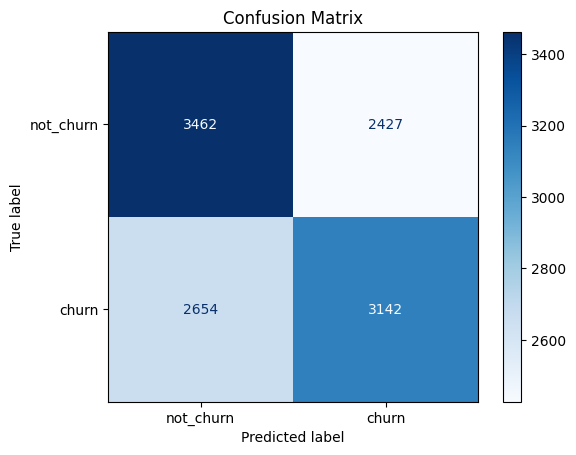

[I 2024-05-30 00:07:48,191] Trial 30 finished with value: 0.5636571102553131 and parameters: {'max_depth': 15, 'min_samples_split': 32}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:49,514] Trial 31 finished with value: 0.5916131792896876 and parameters: {'max_depth': 7, 'min_samples_split': 47}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:51,038] Trial 32 finished with value: 0.5916131792896876 an

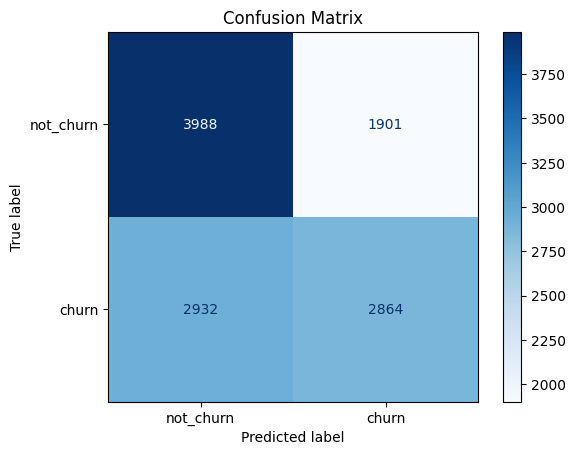

[I 2024-05-30 00:07:55,648] Trial 35 finished with value: 0.5915846526886321 and parameters: {'max_depth': 7, 'min_samples_split': 41}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:57,527] Trial 36 finished with value: 0.5883326201683069 and parameters: {'max_depth': 9, 'min_samples_split': 50}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:07:58,314] Trial 37 finished with value: 0.5887605191841393 and

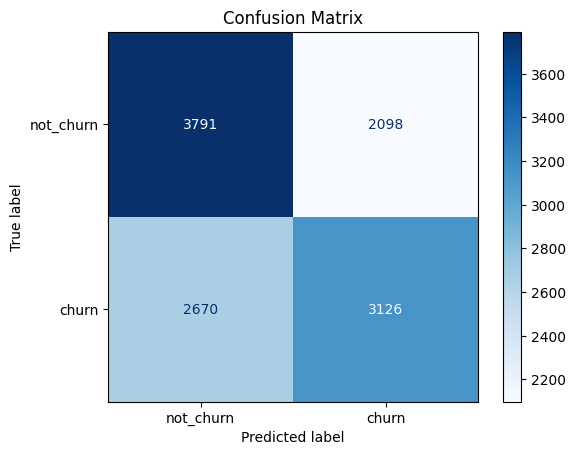

[I 2024-05-30 00:08:04,997] Trial 40 finished with value: 0.5876479817429753 and parameters: {'max_depth': 9, 'min_samples_split': 41}. Best is trial 21 with value: 0.5916417058907432.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:08:06,425] Trial 41 finished with value: 0.5916987590928541 and parameters: {'max_depth': 7, 'min_samples_split': 47}. Best is trial 41 with value: 0.5916987590928541.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:08:07,699] Trial 42 finished with value: 0.5916131792896876 and

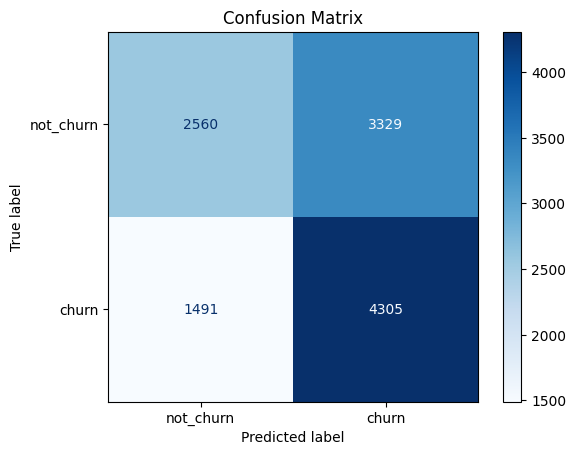

[I 2024-05-30 00:08:11,340] Trial 45 finished with value: 0.5914134930822993 and parameters: {'max_depth': 6, 'min_samples_split': 41}. Best is trial 41 with value: 0.5916987590928541.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:08:13,148] Trial 46 finished with value: 0.587391242333476 and parameters: {'max_depth': 9, 'min_samples_split': 38}. Best is trial 41 with value: 0.5916987590928541.
/var/folders/5s/1kvy18b544sfm3b036mk03140000gn/T/ipykernel_98450/2540575403.py:8: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  "min_samples_split": trial.suggest_int('min_samples_split',5,50,3),
[I 2024-05-30 00:08:14,149] Trial 47 finished with value: 0.5865639709028669 and 

In [104]:
func = lambda trial: objective_decision_tree(trial, X = X_selected, y=y_selected)
decision_tree_study = optuna.create_study(direction='maximize', study_name='Decision Tree Study')
decision_tree_study.optimize(func, n_trials=50)

In [113]:
# Best hyperparameters For DecisionTree
# This is also my answer after the hyperparameter tuning for the Q3 in the case study
decision_tree_study.best_params,decision_tree_study.best_value

print("Decision Tree Model")
print('Best hyperparameters:', decision_tree_study.best_params)
print('Best accuracy:', decision_tree_study.best_value)
save_model(decision_tree_study.best_params, "./models/decision_tree.pkl")
save_model(decision_tree_study, "./models/decision_tree_study.pkl")


Decision Tree Model
Best hyperparameters: {'max_depth': 7, 'min_samples_split': 47}
Best accuracy: 0.5916987590928541


In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
import numpy as np
import matplotlib.pyplot as plt

def plot_feature_importance_logistic_reg(model, feature_names):
    importances = model.coef_[0]
    indices = np.argsort(importances)
    plt.figure(figsize=(10, 8))
    plt.title("Feature Importances")
    plt.barh(range(len(indices)), importances[indices], align="center")
    plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
    plt.xlabel("Relative Importance")
    plt.show()

def objective_logistic_regression(trial, X, y):
    param = {
        "max_iter": trial.suggest_int('max_iter', 750,1500),
    }

    # Initialize the StratifiedKFold object
    skf = StratifiedKFold(n_splits=5)
    
    model = LogisticRegression(random_state=42).set_params(**param)

    scores = []
    for train_index, val_index in skf.split(X, y):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]
        
        # Train model with the given hyperparameters
        model.fit(X_train, y_train_fold)

        # Predict and calculate accuracy score on validation set
        y_val_pred = model.predict(X_val)
        score = accuracy_score(y_val_fold, y_val_pred)
        scores.append(score)
    
    # Optionally, plot confusion matrix and feature importance every 5 trials
    if trial.number % 5 == 0:
        plot_confusion_matrix(y_val_fold, y_val_pred, class_names=['not_churn', 'churn'])
        plt.show()
        
        # Get feature importance
        plot_feature_importance_logistic_reg(model, X.columns)
    
    return np.mean(scores)




[I 2024-05-30 00:46:42,437] A new study created in memory with name: logistic_reg_study
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the

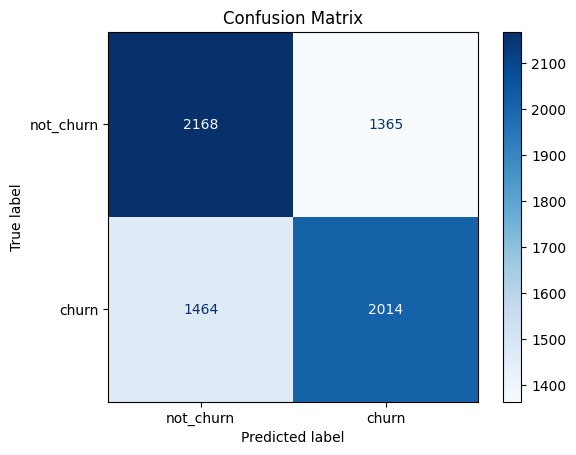

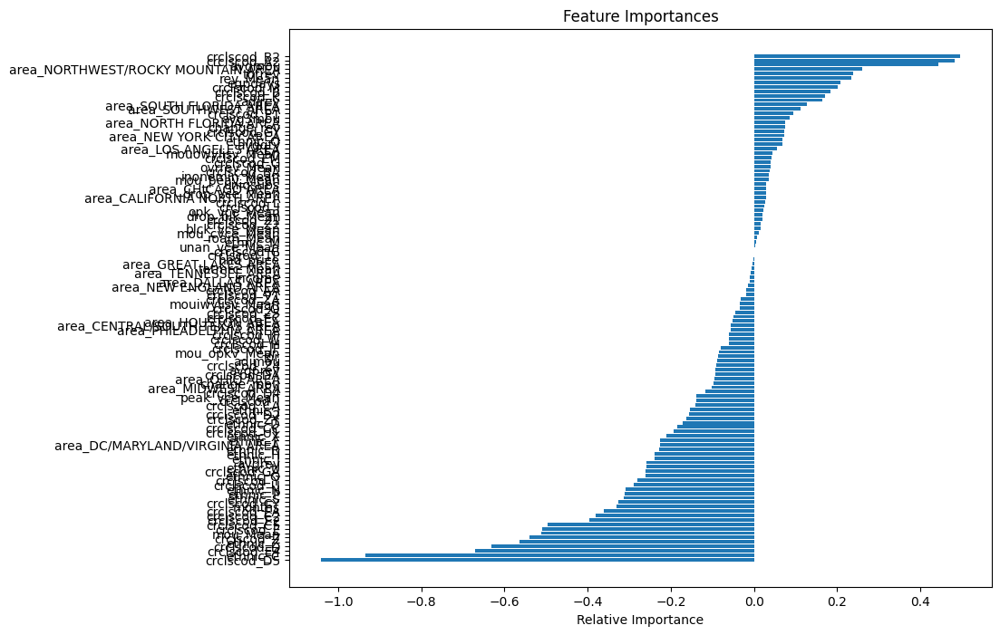

[I 2024-05-30 00:47:24,238] Trial 0 finished with value: 0.5977178719155612 and parameters: {'max_iter': 1428}. Best is trial 0 with value: 0.5977178719155612.
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://sci

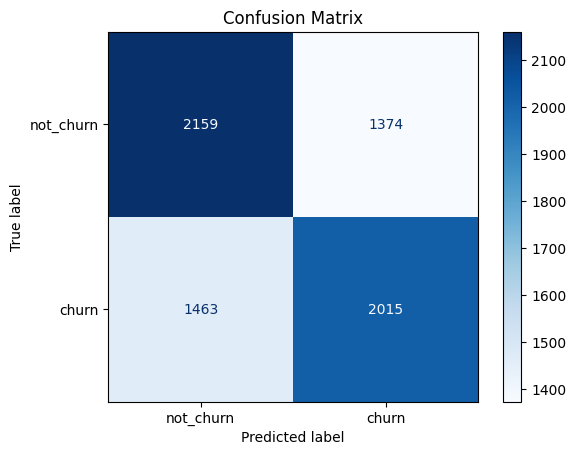

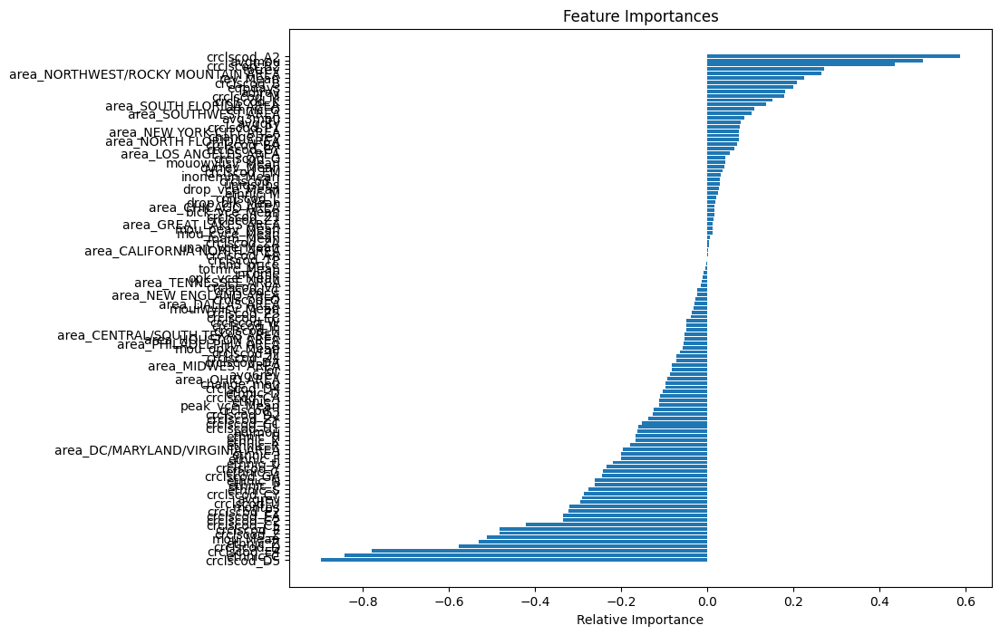

[I 2024-05-30 00:50:34,719] Trial 5 finished with value: 0.5966338610754529 and parameters: {'max_iter': 1189}. Best is trial 4 with value: 0.5980031379261161.
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://sci

In [35]:
func = lambda trial: objective_logistic_regression(trial, X = X_selected, y=y_selected)
logistic_reg_study = optuna.create_study(direction='maximize', study_name='logistic_reg_study')
logistic_reg_study.optimize(func, n_trials=25,timeout=300)



In [ ]:
# Its important to note that Logistic regression cannot converge well due to high collineraty in data 
# PCA could be used to overcome this issue but it will be computationally expensive and time consuming
# Also max_iter count could be set to 10.000 but it will be computationally expensive and time consuming


In [51]:
print("Logistic Regression Model")
print('Best hyperparameters:', logistic_reg_study.best_params)
print('Best accuracy:', logistic_reg_study.best_value)
save_model(logistic_reg_study.best_params, "./models/logistic_regression_best_params.pkl")
save_model(logistic_reg_study, "./models/logistic_regression_study.pkl")

Logistic Regression Model
Best hyperparameters: {'max_iter': 1410}
Best accuracy: 0.5980031379261161


In [42]:
from catboost import CatBoostClassifier

from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import accuracy_score

def objective_catboost(trial,X,y):
    # Define hyperparameters
    params = {
    'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1),
    'max_depth': trial.suggest_int('max_depth', 3, 10),
    'n_estimators': trial.suggest_int('n_estimators', 100, 500),
    'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.3, 1.0),
    'min_child_samples': trial.suggest_int('min_child_samples', 20, 50),
    'eval_metric': 'Accuracy'
}
    
    # Initialize the StratifiedKFold object
    skf = StratifiedKFold(n_splits=5)

    model = CatBoostClassifier(**params,verbose=0)
    #loss_function='CrossEntropy'

    scores = []
    for train_index, val_index in skf.split(X,y):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]
        # Train model with the given hyperparameters
        model.fit(X_train, y_train_fold)

        # Predict and calculate AUCPR score on validation set
        y_val_pred = model.predict(X_val)
        score = accuracy_score(y_val_fold, y_val_pred)
        scores.append(score)
        
        
    if trial.number % 5 == 0:
        plot_confusion_matrix(y_val_fold, y_val_pred, class_names = ['churn','not churn'])
        # Get feature importance
        plot_feature_importance(model, X_train)


    return np.mean(scores)





[I 2024-05-30 00:59:31,132] A new study created in memory with name: catboost_study


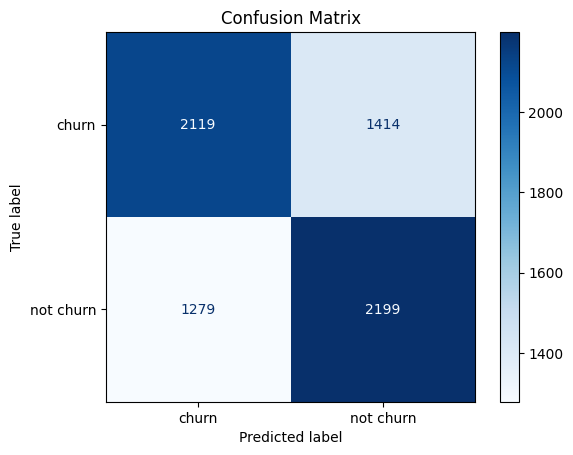

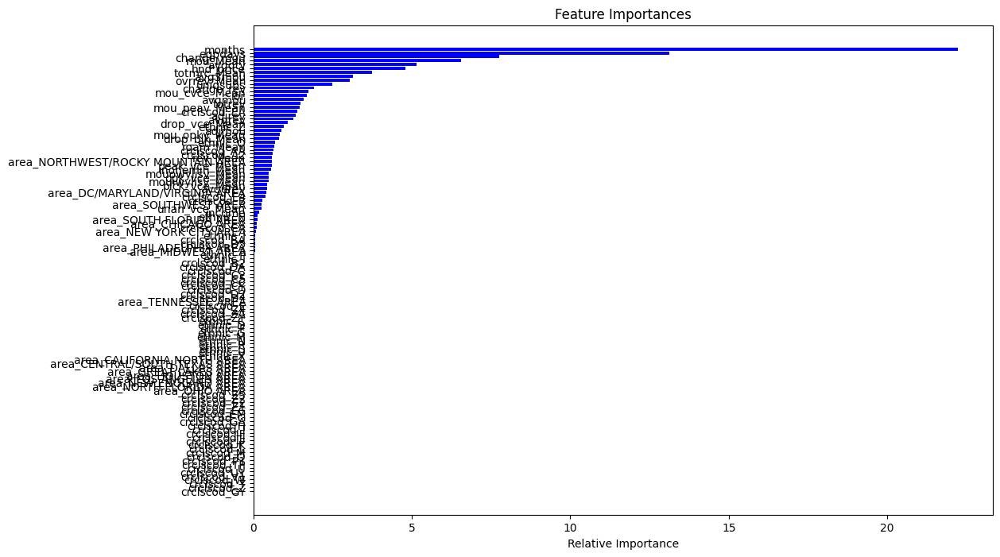

[I 2024-05-30 00:59:35,638] Trial 0 finished with value: 0.6186563970902867 and parameters: {'learning_rate': 0.0721206350256773, 'max_depth': 4, 'n_estimators': 155, 'colsample_bylevel': 0.49639674022607944, 'min_child_samples': 37}. Best is trial 0 with value: 0.6186563970902867.
[I 2024-05-30 00:59:40,089] Trial 1 finished with value: 0.6128084438739124 and parameters: {'learning_rate': 0.03126831744744293, 'max_depth': 6, 'n_estimators': 136, 'colsample_bylevel': 0.3037174286235903, 'min_child_samples': 50}. Best is trial 0 with value: 0.6186563970902867.
[I 2024-05-30 01:00:06,811] Trial 2 finished with value: 0.6250178291256596 and parameters: {'learning_rate': 0.025593013788478832, 'max_depth': 8, 'n_estimators': 278, 'colsample_bylevel': 0.517655738286928, 'min_child_samples': 37}. Best is trial 2 with value: 0.6250178291256596.
[I 2024-05-30 01:00:17,925] Trial 3 finished with value: 0.6202253601483383 and parameters: {'learning_rate': 0.06271082433549478, 'max_depth': 8, 'n_e

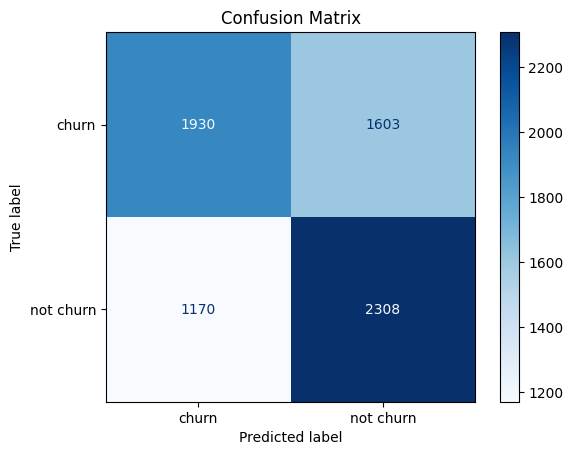

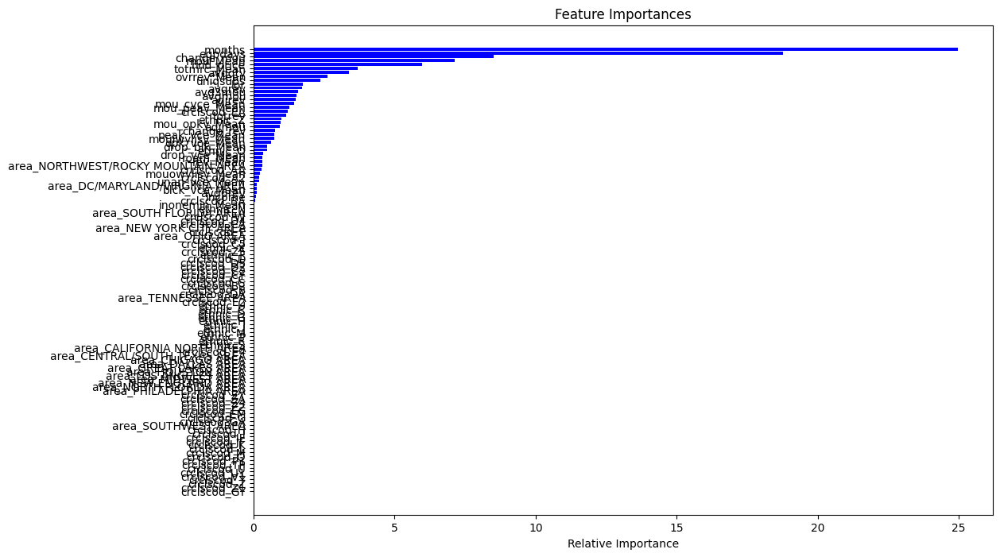

[I 2024-05-30 01:00:34,491] Trial 5 finished with value: 0.6027385537013265 and parameters: {'learning_rate': 0.009204897825896615, 'max_depth': 4, 'n_estimators': 450, 'colsample_bylevel': 0.38395677372988585, 'min_child_samples': 25}. Best is trial 2 with value: 0.6250178291256596.
[I 2024-05-30 01:01:41,673] Trial 6 finished with value: 0.6210811581800029 and parameters: {'learning_rate': 0.00937272630302675, 'max_depth': 10, 'n_estimators': 393, 'colsample_bylevel': 0.7192424498540414, 'min_child_samples': 37}. Best is trial 2 with value: 0.6250178291256596.
[I 2024-05-30 01:01:47,976] Trial 7 finished with value: 0.6257024675509912 and parameters: {'learning_rate': 0.09582867900702637, 'max_depth': 6, 'n_estimators': 159, 'colsample_bylevel': 0.8782790281723714, 'min_child_samples': 37}. Best is trial 7 with value: 0.6257024675509912.
[I 2024-05-30 01:02:48,669] Trial 8 finished with value: 0.6219084296106119 and parameters: {'learning_rate': 0.06242228857215524, 'max_depth': 10, 

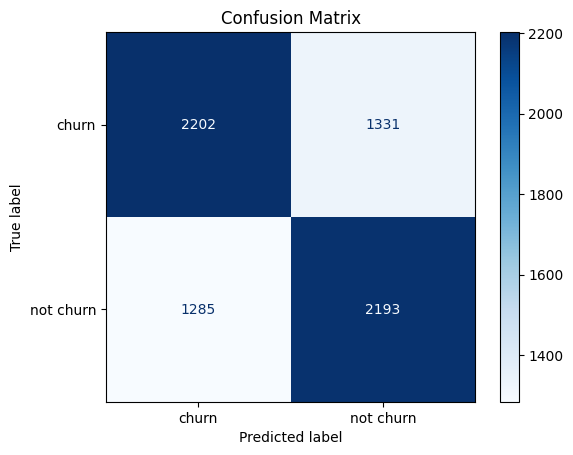

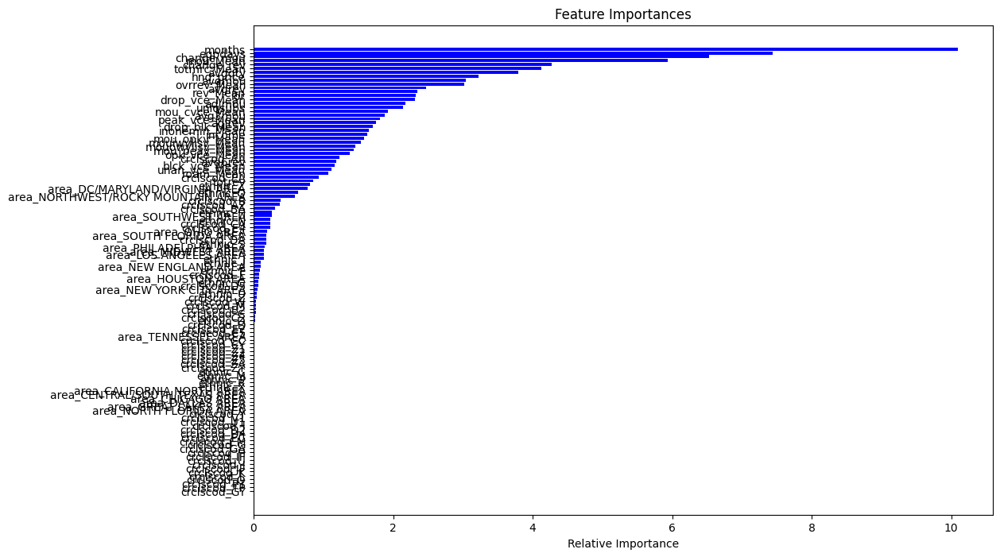

[I 2024-05-30 01:03:09,552] Trial 10 finished with value: 0.6275852232206534 and parameters: {'learning_rate': 0.09998624156029706, 'max_depth': 6, 'n_estimators': 204, 'colsample_bylevel': 0.9931889512266014, 'min_child_samples': 46}. Best is trial 10 with value: 0.6275852232206534.
[I 2024-05-30 01:03:17,626] Trial 11 finished with value: 0.6269005847953217 and parameters: {'learning_rate': 0.09802313829069575, 'max_depth': 6, 'n_estimators': 212, 'colsample_bylevel': 0.9864114752437145, 'min_child_samples': 47}. Best is trial 10 with value: 0.6275852232206534.
[I 2024-05-30 01:03:29,524] Trial 12 finished with value: 0.6266723719868778 and parameters: {'learning_rate': 0.0817104240487724, 'max_depth': 7, 'n_estimators': 232, 'colsample_bylevel': 0.9953245225204125, 'min_child_samples': 48}. Best is trial 10 with value: 0.6275852232206534.
[I 2024-05-30 01:03:36,638] Trial 13 finished with value: 0.6265012123805448 and parameters: {'learning_rate': 0.0998495380864619, 'max_depth': 5,

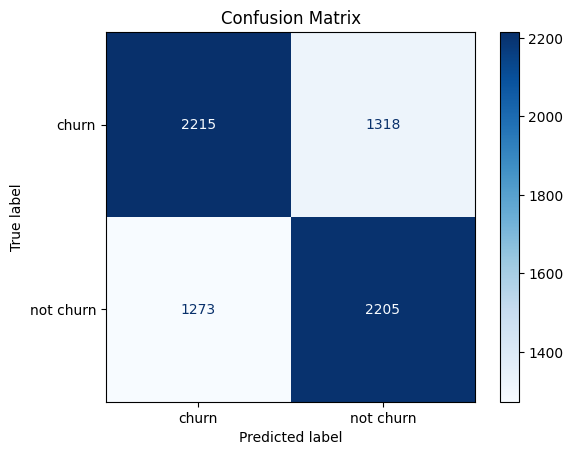

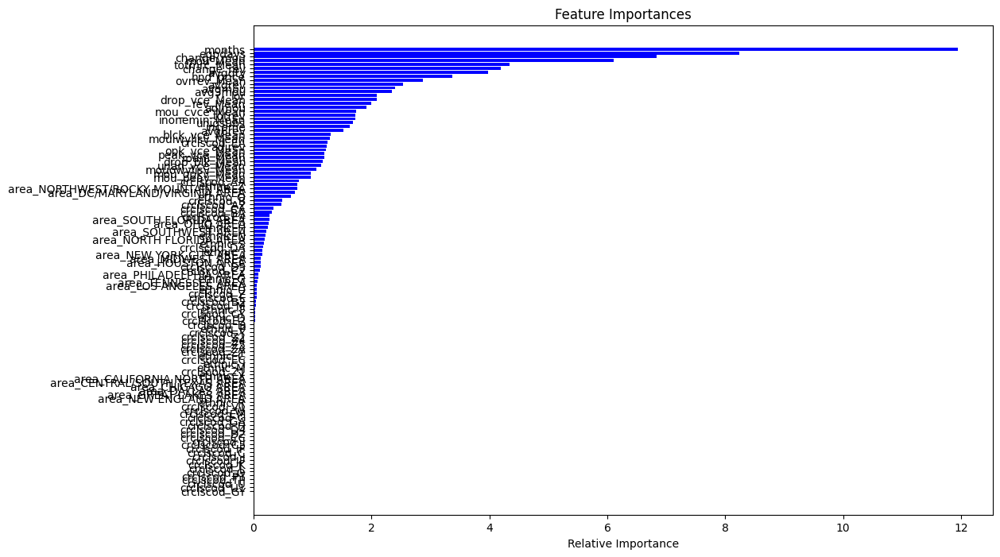

[I 2024-05-30 01:04:02,412] Trial 15 finished with value: 0.6285266010554842 and parameters: {'learning_rate': 0.08131446989091695, 'max_depth': 5, 'n_estimators': 305, 'colsample_bylevel': 0.9052771060190277, 'min_child_samples': 44}. Best is trial 15 with value: 0.6285266010554842.
[I 2024-05-30 01:04:12,653] Trial 16 finished with value: 0.6277278562259306 and parameters: {'learning_rate': 0.08028341947031573, 'max_depth': 5, 'n_estimators': 306, 'colsample_bylevel': 0.886227239113786, 'min_child_samples': 43}. Best is trial 15 with value: 0.6285266010554842.
[I 2024-05-30 01:04:23,940] Trial 17 finished with value: 0.626986164598488 and parameters: {'learning_rate': 0.08034045948711895, 'max_depth': 5, 'n_estimators': 330, 'colsample_bylevel': 0.7594247795913538, 'min_child_samples': 32}. Best is trial 15 with value: 0.6285266010554842.
[I 2024-05-30 01:04:31,311] Trial 18 finished with value: 0.6216516902011124 and parameters: {'learning_rate': 0.04873811155683027, 'max_depth': 4,

In [43]:
func = lambda trial: objective_catboost(trial, X = X_selected, y=y_selected)
catboost_study = optuna.create_study(direction='maximize', study_name='catboost_study')
catboost_study.optimize(func, n_trials=20,timeout=300)

In [44]:
print("CatBoost Model")
print('Best hyperparameters:', catboost_study.best_params)
print('Best accuracy:', catboost_study.best_value)
save_model(catboost_study.best_params, "./models/catboost_best_params.pkl")
save_model(catboost_study, "./models/catboost_study.pkl")

CatBoost Model
Best hyperparameters: {'learning_rate': 0.08131446989091695, 'max_depth': 5, 'n_estimators': 305, 'colsample_bylevel': 0.9052771060190277, 'min_child_samples': 44}
Best accuracy: 0.6285266010554842


In [52]:
from sklearn.model_selection import StratifiedKFold,KFold,GroupKFold
from sklearn.metrics import accuracy_score

from lightgbm import LGBMClassifier

from optuna.samplers import TPESampler


def objective_lightgbm(trial,X,y):
    # Define hyperparameters
    params = {
    "objective": "binary",
    "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.1),
    "max_depth": trial.suggest_int("max_depth", -1, 50),
    "num_leaves": trial.suggest_int("num_leaves", 2,128),  # add this line
    "min_child_samples": trial.suggest_int("min_child_samples", 20, 50),
    "subsample": trial.suggest_float("subsample", 0.5, 1.0),
    "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
    "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
}
    # Initialize the StratifiedKFold object
    skf = StratifiedKFold(n_splits=3)
    
    model = LGBMClassifier(**params,verbose=-1)

    scores = []
    for train_index, val_index in skf.split(X,y):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]
        # Train model with the given hyperparameters
        model.fit(X_train, y_train_fold)

        # Predict and calculate AUCPR score on validation set
        y_val_pred = model.predict(X_val)
        score = accuracy_score(y_val_fold, y_val_pred)
        scores.append(score)
        
        
    if trial.number % 5 == 0:
        plot_confusion_matrix(y_val_fold, y_val_pred, class_names = ['not churn','churn'])
        plot_feature_importance(model, X_train)

    return np.mean(scores)
    

[I 2024-05-30 01:08:24,453] A new study created in memory with name: lightgbm_study5


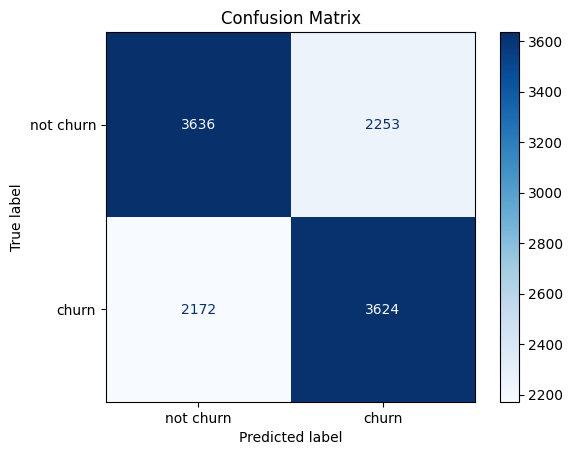

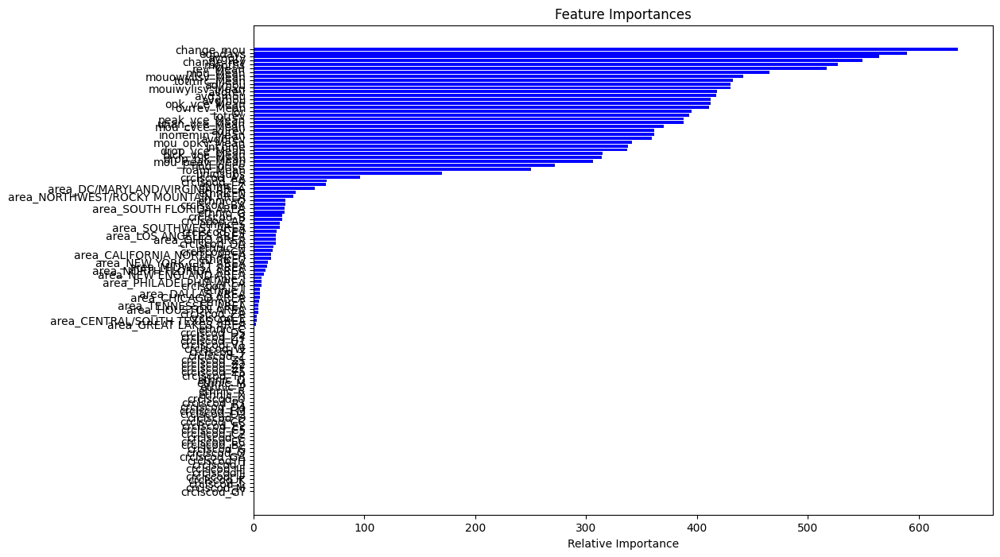

[I 2024-05-30 01:08:27,845] Trial 0 finished with value: 0.6242190842961062 and parameters: {'learning_rate': 0.03807947176588889, 'max_depth': 48, 'num_leaves': 94, 'min_child_samples': 38, 'subsample': 0.5780093202212182, 'colsample_bytree': 0.5779972601681014, 'n_estimators': 152}. Best is trial 0 with value: 0.6242190842961062.
[I 2024-05-30 01:08:32,026] Trial 1 finished with value: 0.6139780345171874 and parameters: {'learning_rate': 0.08675143843171859, 'max_depth': 30, 'num_leaves': 91, 'min_child_samples': 20, 'subsample': 0.9849549260809971, 'colsample_bytree': 0.9162213204002109, 'n_estimators': 291}. Best is trial 0 with value: 0.6242190842961062.
[I 2024-05-30 01:08:36,005] Trial 2 finished with value: 0.6273855370132649 and parameters: {'learning_rate': 0.01900067175350296, 'max_depth': 8, 'num_leaves': 40, 'min_child_samples': 36, 'subsample': 0.7159725093210578, 'colsample_bytree': 0.645614570099021, 'n_estimators': 651}. Best is trial 2 with value: 0.6273855370132649.


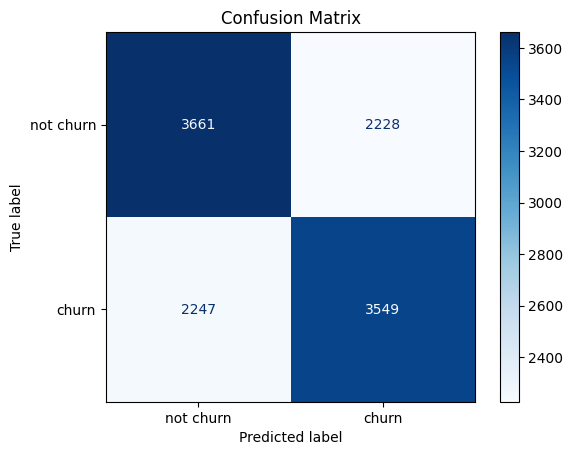

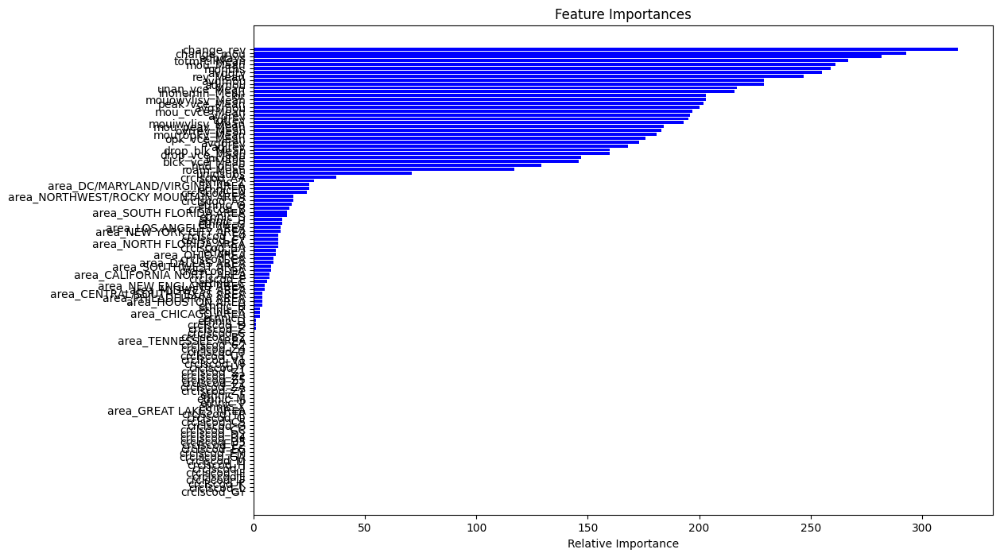

[I 2024-05-30 01:08:45,529] Trial 5 finished with value: 0.6223648552274996 and parameters: {'learning_rate': 0.08103133746352965, 'max_depth': 14, 'num_leaves': 14, 'min_child_samples': 41, 'subsample': 0.7200762468698007, 'colsample_bytree': 0.5610191174223894, 'n_estimators': 546}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:08:51,094] Trial 6 finished with value: 0.6209955783768364 and parameters: {'learning_rate': 0.004404463590406622, 'max_depth': 46, 'num_leaves': 34, 'min_child_samples': 40, 'subsample': 0.6558555380447055, 'colsample_bytree': 0.7600340105889054, 'n_estimators': 592}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:09:06,488] Trial 7 finished with value: 0.6230780202538867 and parameters: {'learning_rate': 0.01930059109702718, 'max_depth': 49, 'num_leaves': 100, 'min_child_samples': 49, 'subsample': 0.9474136752138245, 'colsample_bytree': 0.7989499894055425, 'n_estimators': 930}. Best is trial 3 with value: 0.62744259021537

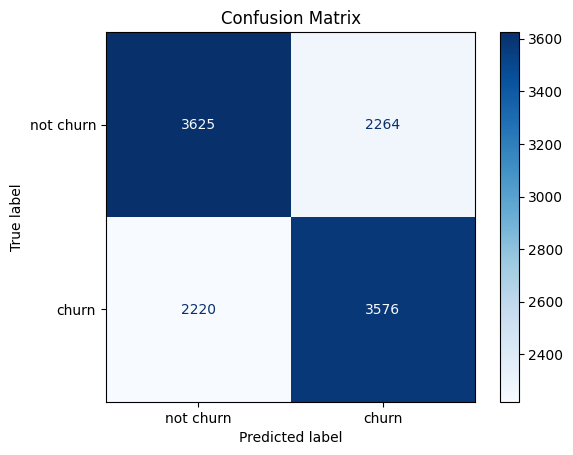

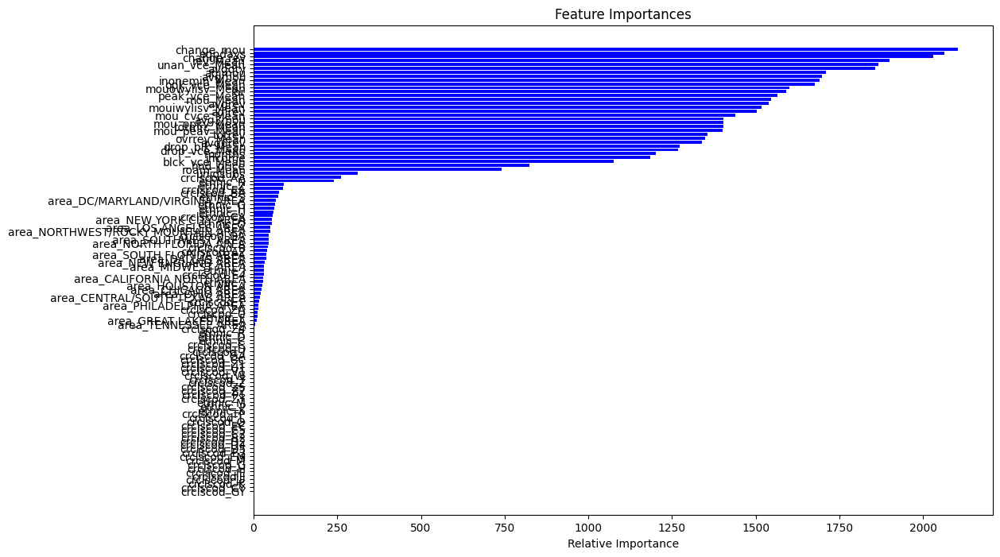

[I 2024-05-30 01:09:35,250] Trial 10 finished with value: 0.6185137640850092 and parameters: {'learning_rate': 0.05185267234915865, 'max_depth': 28, 'num_leaves': 125, 'min_child_samples': 48, 'subsample': 0.8369860450173898, 'colsample_bytree': 0.6901464801259054, 'n_estimators': 409}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:09:44,257] Trial 11 finished with value: 0.6263015261731565 and parameters: {'learning_rate': 0.022005844250117243, 'max_depth': 20, 'num_leaves': 42, 'min_child_samples': 34, 'subsample': 0.8087272364965106, 'colsample_bytree': 0.6601590998714855, 'n_estimators': 714}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:09:53,465] Trial 12 finished with value: 0.6234488660676081 and parameters: {'learning_rate': 0.03221372298550107, 'max_depth': 0, 'num_leaves': 51, 'min_child_samples': 33, 'subsample': 0.790918560204845, 'colsample_bytree': 0.5036872843099404, 'n_estimators': 688}. Best is trial 3 with value: 0.6274425902153

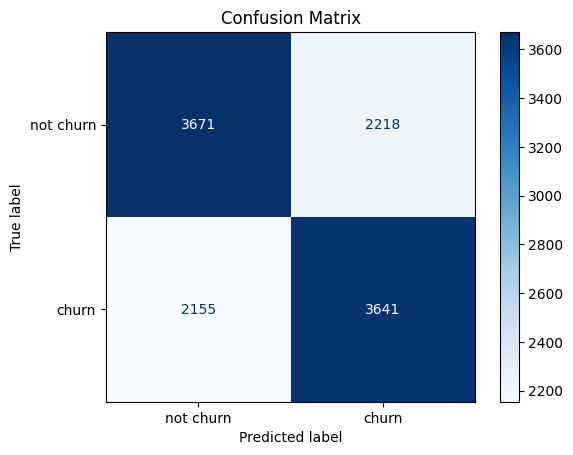

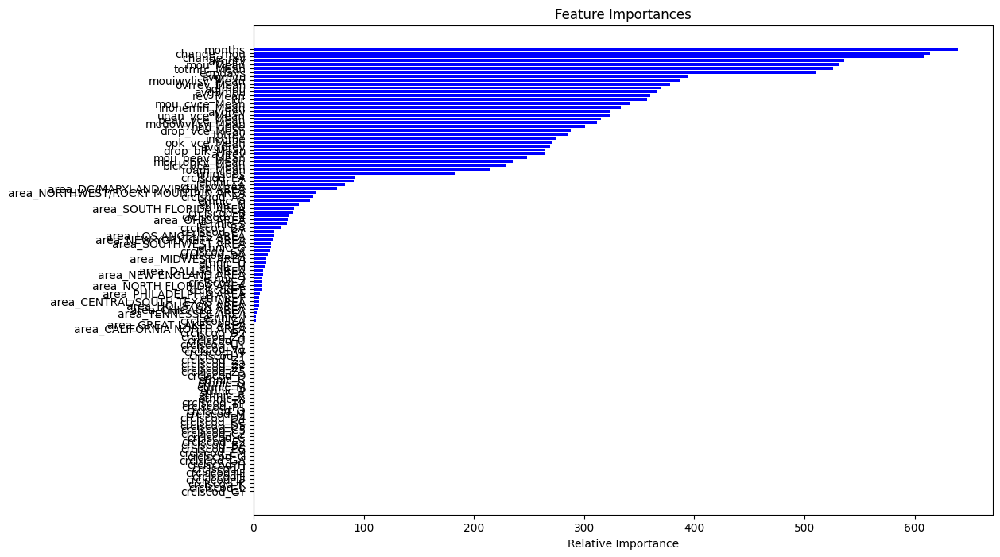

[I 2024-05-30 01:10:10,234] Trial 15 finished with value: 0.6259877335615461 and parameters: {'learning_rate': 0.021147314848345335, 'max_depth': 36, 'num_leaves': 25, 'min_child_samples': 37, 'subsample': 0.7487098945613883, 'colsample_bytree': 0.6135853797532363, 'n_estimators': 534}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:10:13,850] Trial 16 finished with value: 0.6244472971045499 and parameters: {'learning_rate': 0.044095388563889545, 'max_depth': 19, 'num_leaves': 54, 'min_child_samples': 45, 'subsample': 0.8933139358849993, 'colsample_bytree': 0.6071107493684226, 'n_estimators': 308}. Best is trial 3 with value: 0.6274425902153759.
[I 2024-05-30 01:10:21,453] Trial 17 finished with value: 0.6257024675509913 and parameters: {'learning_rate': 0.01520109367851576, 'max_depth': 7, 'num_leaves': 68, 'min_child_samples': 31, 'subsample': 0.7772732279349992, 'colsample_bytree': 0.7254102254355682, 'n_estimators': 845}. Best is trial 3 with value: 0.627442590215

In [53]:
func = lambda trial: objective_lightgbm(trial, X = X_selected, y=y_selected)
sampler = TPESampler(seed=42)
lightgbm_study = optuna.create_study(direction='maximize', study_name='lightgbm_study5',sampler=sampler)
lightgbm_study.optimize(func, n_trials=20)

In [54]:
print("LightGBM Model")
print('Best hyperparameters:', lightgbm_study.best_params)
print('Best accuracy:', lightgbm_study.best_value)
save_model(lightgbm_study.best_params, "./models/lightgbm_best_params.pkl")
save_model(lightgbm_study, "./models/lightgbm_study.pkl")

LightGBM Model
Best hyperparameters: {'learning_rate': 0.01480989220455214, 'max_depth': 14, 'num_leaves': 48, 'min_child_samples': 34, 'subsample': 0.8925879806965068, 'colsample_bytree': 0.5998368910791798, 'n_estimators': 563}
Best accuracy: 0.6274425902153759


In [66]:
# SKLEARN API 

from sklearn.metrics import accuracy_score

from xgboost import XGBClassifier

def objective_xgb(trial,X,y):
    params = {
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "gamma": 0,
        "reg_alpha": trial.suggest_int("reg_alpha", 40, 180),
        "reg_lambda": trial.suggest_float("reg_lambda", 0, 1),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1),
        "subsample": trial.suggest_float("subsample", 0.5, 1),
        "min_child_weight": trial.suggest_int("min_child_weight", 0, 10),
        "n_estimators": 1000,
        "seed": 0,
    }
    #model = xgb.XGBRegressor(**params)
    skf = StratifiedKFold(n_splits=3)
            
    model = xgb.XGBClassifier(**params,enable_categorical=True)
            
    scores = []
    for train_index, val_index in skf.split(X,y):
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train_fold, y_val_fold = y.iloc[train_index], y.iloc[val_index]
        # Train model with the given hyperparameters
        model.fit(X_train, y_train_fold)

        # Predict and calculate AUCPR score on validation set
        y_val_pred = model.predict(X_val)
        score = accuracy_score(y_val_fold, y_val_pred)
        scores.append(score)
    
        print(scores)
    if trial.number % 5 == 0:
        pass
        plot_confusion_matrix(y_val_fold, y_val_pred, class_names = ['churn','not churn'])
        xgb.plot_importance(model, importance_type='gain', title='Feature importance by gain',show_values=False)

        #plot_roc_curve(y_val_fold, y_val_pred)
        #plot_feature_importance(model, X_train)
    return np.mean(scores)

[I 2024-05-30 01:19:32,359] A new study created in memory with name: xgb_study


[0.6183996576807873]
[0.6183996576807873, 0.6302096705177578]
[0.6183996576807873, 0.6302096705177578, 0.6193410355156184]


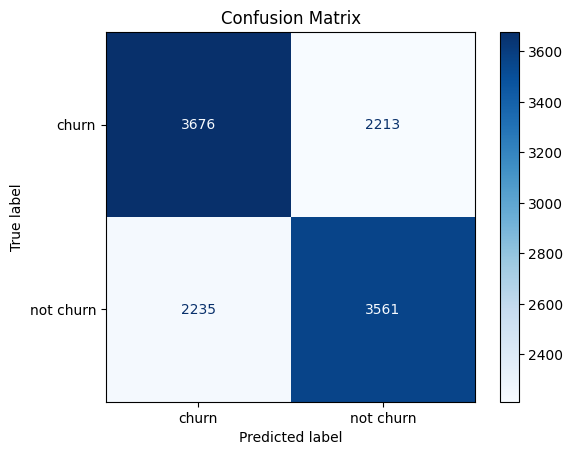

[I 2024-05-30 01:19:42,194] Trial 0 finished with value: 0.6226501212380545 and parameters: {'max_depth': 3, 'reg_alpha': 85, 'reg_lambda': 0.5453179765186269, 'colsample_bytree': 0.7643125097324753, 'subsample': 0.7317545869355084, 'min_child_weight': 6}. Best is trial 0 with value: 0.6226501212380545.


[0.6177150192554557]
[0.6177150192554557, 0.6267864783910997]


[I 2024-05-30 01:19:56,431] Trial 1 finished with value: 0.6224789616317216 and parameters: {'max_depth': 8, 'reg_alpha': 62, 'reg_lambda': 0.5960798614886709, 'colsample_bytree': 0.7570945076301695, 'subsample': 0.5811019515031912, 'min_child_weight': 2}. Best is trial 0 with value: 0.6226501212380545.


[0.6177150192554557, 0.6267864783910997, 0.6229353872486093]
[0.6099272571673086]
[0.6099272571673086, 0.6122379118528027]


[I 2024-05-30 01:20:04,830] Trial 2 finished with value: 0.6094708315504208 and parameters: {'max_depth': 3, 'reg_alpha': 148, 'reg_lambda': 0.9028274456373097, 'colsample_bytree': 0.7277916050375868, 'subsample': 0.7326824466256652, 'min_child_weight': 5}. Best is trial 0 with value: 0.6226501212380545.


[0.6099272571673086, 0.6122379118528027, 0.606247325631151]
[0.6137783483097989]
[0.6137783483097989, 0.6267008985879332]


[I 2024-05-30 01:20:20,855] Trial 3 finished with value: 0.619968620738839 and parameters: {'max_depth': 9, 'reg_alpha': 41, 'reg_lambda': 0.9722522301314512, 'colsample_bytree': 0.7727875493608289, 'subsample': 0.9423044882132908, 'min_child_weight': 2}. Best is trial 0 with value: 0.6226501212380545.


[0.6137783483097989, 0.6267008985879332, 0.6194266153187847]
[0.6100984167736414]
[0.6100984167736414, 0.6202824133504493]


[I 2024-05-30 01:20:28,380] Trial 4 finished with value: 0.6132648694908002 and parameters: {'max_depth': 3, 'reg_alpha': 123, 'reg_lambda': 0.7412621274143404, 'colsample_bytree': 0.670181763277929, 'subsample': 0.7948360021182959, 'min_child_weight': 2}. Best is trial 0 with value: 0.6226501212380545.


[0.6100984167736414, 0.6202824133504493, 0.6094137783483098]
[0.6132648694908002]
[0.6132648694908002, 0.6259306803594352]
[0.6132648694908002, 0.6259306803594352, 0.6213093709884467]


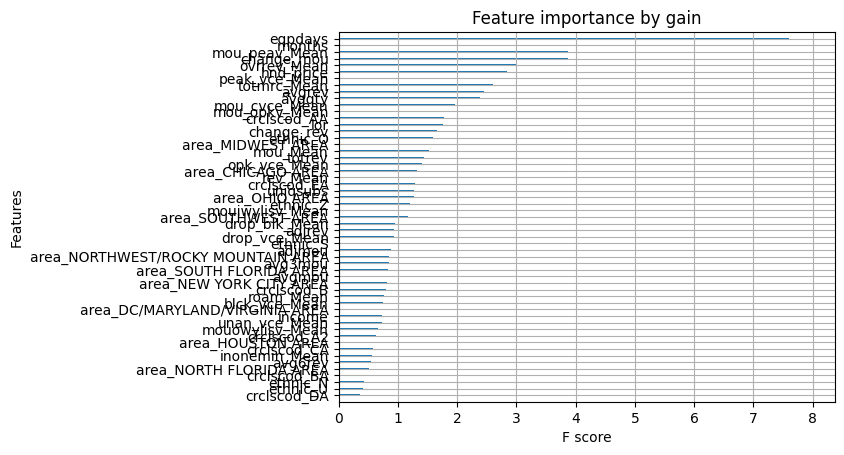

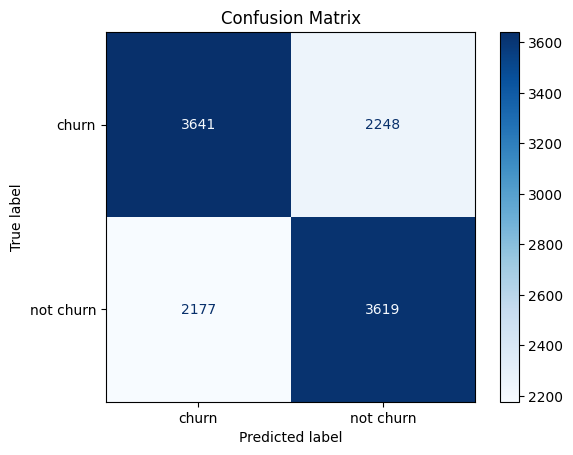

[I 2024-05-30 01:20:37,183] Trial 5 finished with value: 0.6201683069462274 and parameters: {'max_depth': 9, 'reg_alpha': 125, 'reg_lambda': 0.25281714610714456, 'colsample_bytree': 0.5851113100040429, 'subsample': 0.8469586819601933, 'min_child_weight': 6}. Best is trial 0 with value: 0.6226501212380545.


[0.6166880616174583]
[0.6166880616174583, 0.6307231493367566]


[I 2024-05-30 01:20:46,104] Trial 6 finished with value: 0.6239908714876622 and parameters: {'max_depth': 7, 'reg_alpha': 94, 'reg_lambda': 0.689481840612225, 'colsample_bytree': 0.7287713705374215, 'subsample': 0.717207193177029, 'min_child_weight': 7}. Best is trial 6 with value: 0.6239908714876622.


[0.6166880616174583, 0.6307231493367566, 0.624561403508772]
[0.6149764655541292]
[0.6149764655541292, 0.6285836542575952]


[I 2024-05-30 01:20:56,018] Trial 7 finished with value: 0.6202538867493939 and parameters: {'max_depth': 4, 'reg_alpha': 107, 'reg_lambda': 0.8523290866922146, 'colsample_bytree': 0.7902557478677242, 'subsample': 0.6625823315164646, 'min_child_weight': 0}. Best is trial 6 with value: 0.6239908714876622.


[0.6149764655541292, 0.6285836542575952, 0.617201540436457]
[0.6183996576807873]
[0.6183996576807873, 0.6293538724860933]


[I 2024-05-30 01:21:06,623] Trial 8 finished with value: 0.6235914990728855 and parameters: {'max_depth': 5, 'reg_alpha': 93, 'reg_lambda': 0.5720925600159316, 'colsample_bytree': 0.9678985947670669, 'subsample': 0.582710473900127, 'min_child_weight': 7}. Best is trial 6 with value: 0.6239908714876622.


[0.6183996576807873, 0.6293538724860933, 0.6230209670517758]
[0.6118100128369705]
[0.6118100128369705, 0.6247325631151048]


[I 2024-05-30 01:21:16,170] Trial 9 finished with value: 0.6170589074311796 and parameters: {'max_depth': 5, 'reg_alpha': 126, 'reg_lambda': 0.69920566879672, 'colsample_bytree': 0.7166770631288237, 'subsample': 0.5624517215286179, 'min_child_weight': 4}. Best is trial 6 with value: 0.6239908714876622.


[0.6118100128369705, 0.6247325631151048, 0.6146341463414634]
[0.6063329054343175]
[0.6063329054343175, 0.6175438596491228]
[0.6063329054343175, 0.6175438596491228, 0.6160890029952931]


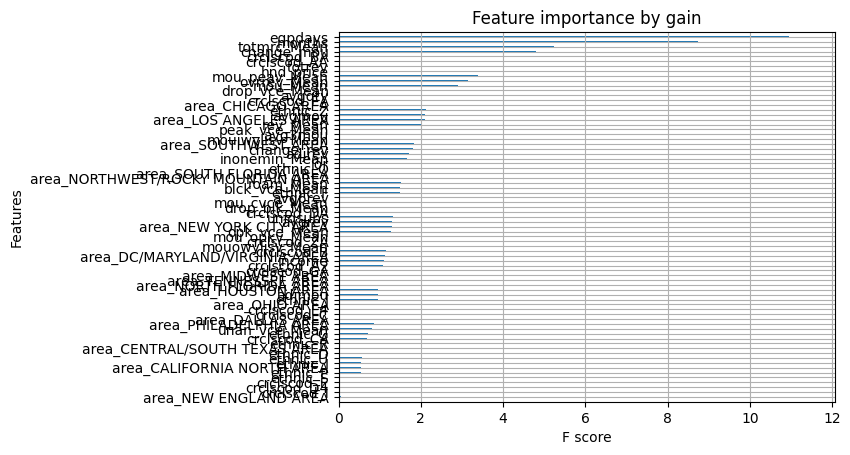

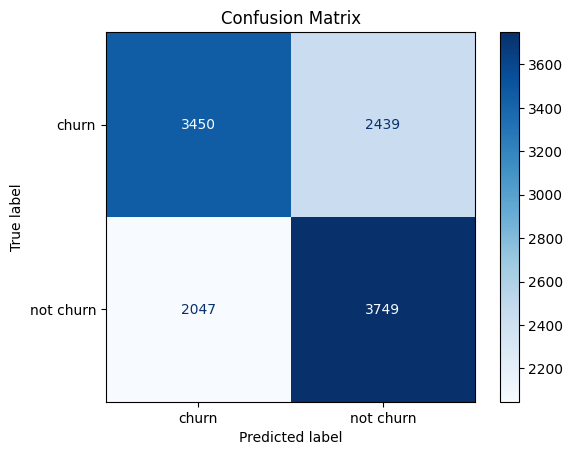

[I 2024-05-30 01:21:29,808] Trial 10 finished with value: 0.6133219226929111 and parameters: {'max_depth': 7, 'reg_alpha': 176, 'reg_lambda': 0.25108899917453265, 'colsample_bytree': 0.9118850742078178, 'subsample': 0.9194215784854487, 'min_child_weight': 10}. Best is trial 6 with value: 0.6239908714876622.


[0.6195977749251177]
[0.6195977749251177, 0.6329482242190843]


[I 2024-05-30 01:21:46,607] Trial 11 finished with value: 0.626272999572101 and parameters: {'max_depth': 6, 'reg_alpha': 90, 'reg_lambda': 0.36690934589254187, 'colsample_bytree': 0.9297020392044443, 'subsample': 0.6345085050274202, 'min_child_weight': 9}. Best is trial 11 with value: 0.626272999572101.


[0.6195977749251177, 0.6329482242190843, 0.626272999572101]
[0.619854514334617]
[0.619854514334617, 0.6292682926829268]


[I 2024-05-30 01:22:01,483] Trial 12 finished with value: 0.6258165739552132 and parameters: {'max_depth': 6, 'reg_alpha': 72, 'reg_lambda': 0.3926207843261648, 'colsample_bytree': 0.857973215081772, 'subsample': 0.6592499580856661, 'min_child_weight': 9}. Best is trial 11 with value: 0.626272999572101.


[0.619854514334617, 0.6292682926829268, 0.6283269148480959]
[0.6195977749251177]
[0.6195977749251177, 0.6267008985879332]


[I 2024-05-30 01:22:14,486] Trial 13 finished with value: 0.6227642276422765 and parameters: {'max_depth': 6, 'reg_alpha': 66, 'reg_lambda': 0.01263922698537101, 'colsample_bytree': 0.853110894061506, 'subsample': 0.6284748605790502, 'min_child_weight': 10}. Best is trial 11 with value: 0.626272999572101.


[0.6195977749251177, 0.6267008985879332, 0.6219940094137784]
[0.6164313222079589]
[0.6164313222079589, 0.6267864783910997]


[I 2024-05-30 01:22:26,363] Trial 14 finished with value: 0.6222222222222222 and parameters: {'max_depth': 6, 'reg_alpha': 71, 'reg_lambda': 0.3607524956871986, 'colsample_bytree': 0.9981814288408741, 'subsample': 0.5197703966296534, 'min_child_weight': 9}. Best is trial 11 with value: 0.626272999572101.


[0.6164313222079589, 0.6267864783910997, 0.6234488660676081]
[0.6093281985451433]
[0.6093281985451433, 0.6166880616174583]
[0.6093281985451433, 0.6166880616174583, 0.6163457424047925]


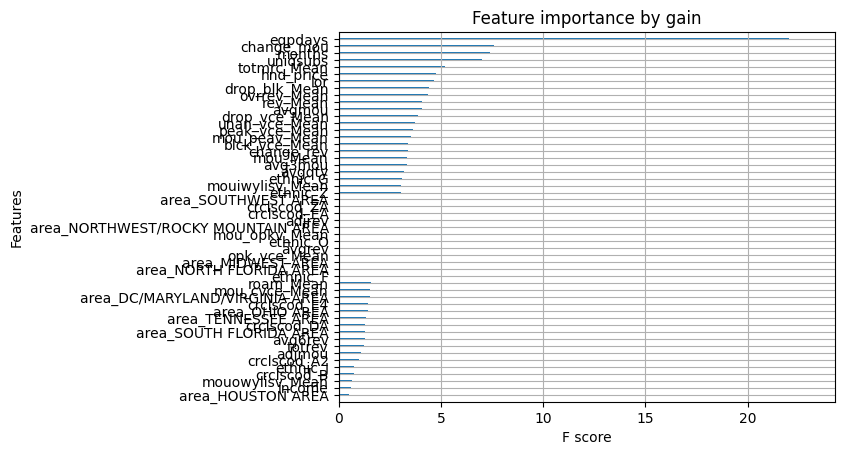

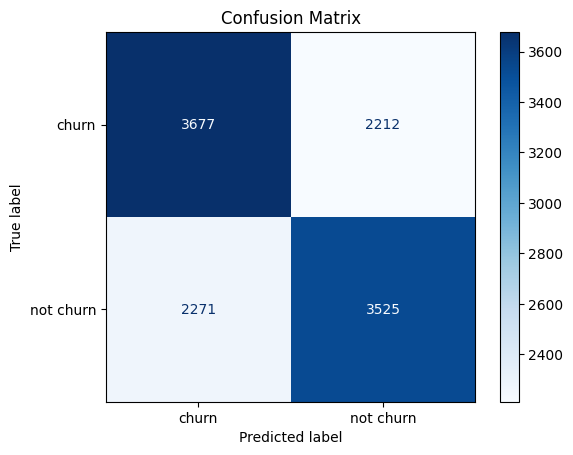

[I 2024-05-30 01:22:47,879] Trial 15 finished with value: 0.6141206675224647 and parameters: {'max_depth': 10, 'reg_alpha': 46, 'reg_lambda': 0.3472255001858355, 'colsample_bytree': 0.8769859409793312, 'subsample': 0.6621848863507491, 'min_child_weight': 8}. Best is trial 11 with value: 0.626272999572101.


[0.6170303808301241]
[0.6170303808301241, 0.6309798887462559]


[I 2024-05-30 01:22:57,802] Trial 16 finished with value: 0.6237911852802739 and parameters: {'max_depth': 5, 'reg_alpha': 81, 'reg_lambda': 0.01870347947092632, 'colsample_bytree': 0.9143349915102195, 'subsample': 0.6453950709978309, 'min_child_weight': 9}. Best is trial 11 with value: 0.626272999572101.


[0.6170303808301241, 0.6309798887462559, 0.6233632862644416]
[0.6213949507916132]
[0.6213949507916132, 0.6290115532734275]


[I 2024-05-30 01:23:05,910] Trial 17 finished with value: 0.6242761374982172 and parameters: {'max_depth': 8, 'reg_alpha': 105, 'reg_lambda': 0.43116244518934943, 'colsample_bytree': 0.8231306134553593, 'subsample': 0.807332540756839, 'min_child_weight': 8}. Best is trial 11 with value: 0.626272999572101.


[0.6213949507916132, 0.6290115532734275, 0.6224219084296106]
[0.6157466837826273]
[0.6157466837826273, 0.6231921266581086]


[I 2024-05-30 01:23:19,539] Trial 18 finished with value: 0.6204820995578376 and parameters: {'max_depth': 6, 'reg_alpha': 57, 'reg_lambda': 0.15029380066388742, 'colsample_bytree': 0.9397756637222112, 'subsample': 0.508106630381427, 'min_child_weight': 10}. Best is trial 11 with value: 0.626272999572101.


[0.6157466837826273, 0.6231921266581086, 0.622507488232777]
[0.6082156611039795]
[0.6082156611039795, 0.6169448010269576]


[I 2024-05-30 01:23:26,597] Trial 19 finished with value: 0.6121238054485808 and parameters: {'max_depth': 4, 'reg_alpha': 142, 'reg_lambda': 0.40200476164429866, 'colsample_bytree': 0.5084825271547996, 'subsample': 0.7023652560009331, 'min_child_weight': 4}. Best is trial 11 with value: 0.626272999572101.


[0.6082156611039795, 0.6169448010269576, 0.6112109542148053]


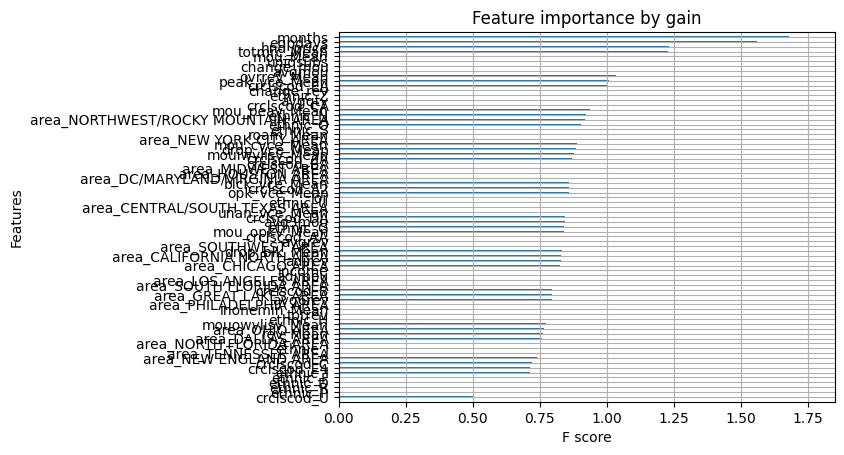

In [67]:
func = lambda trial: objective_xgb(trial, X = X_selected, y=y_selected)
xgb_study = optuna.create_study(direction='maximize', study_name='xgb_study')
xgb_study.optimize(func, n_trials=20)

In [68]:
print("XGB Model")
print('Best hyperparameters:', xgb_study.best_params)
print('Best accuracy:', xgb_study.best_value)
save_model(xgb_study.best_params, "./models/xgb_best_params.pkl")
save_model(xgb_study, "./models/xgb_study.pkl")

XGB Model
Best hyperparameters: {'max_depth': 6, 'reg_alpha': 90, 'reg_lambda': 0.36690934589254187, 'colsample_bytree': 0.9297020392044443, 'subsample': 0.6345085050274202, 'min_child_weight': 9}
Best accuracy: 0.626272999572101


In [77]:
# Lets load our model best params alongside with static params 


static_xgb_params = {
        "gamma": 0,
        "n_estimators": 1000,
        "seed": 0,
    }

xgb_params = load_model("./models/xgb_best_params.pkl")


xgb_params = {**static_xgb_params, **xgb_params}


static_lightgbm_params =  {
    "objective": "binary"
}

lightgbm_params = load_model("./models/lightgbm_best_params.pkl")

lightgbm_params = {**static_lightgbm_params, **lightgbm_params}

static_catboost_params = {
    'eval_metric': 'Accuracy'
}

catboost_params = load_model("./models/catboost_best_params.pkl")

catboost_params = {**static_catboost_params, **catboost_params}

logistic_regression_params = load_model("./models/logistic_regression_best_params.pkl")

decision_tree_params = load_model("./models/decision_tree.pkl")

print(f"XGB: {xgb_params}")
print(f"LightGBM: {lightgbm_params}")
print(f"CatBoost: {catboost_params}")
print(f"Logistic Regression: {logistic_regression_params}")
print(f"Decision Tree: {decision_tree_params}")













    

XGB: {'gamma': 0, 'n_estimators': 1000, 'seed': 0, 'max_depth': 6, 'reg_alpha': 90, 'reg_lambda': 0.36690934589254187, 'colsample_bytree': 0.9297020392044443, 'subsample': 0.6345085050274202, 'min_child_weight': 9}
LightGBM: {'objective': 'binary', 'learning_rate': 0.01480989220455214, 'max_depth': 14, 'num_leaves': 48, 'min_child_samples': 34, 'subsample': 0.8925879806965068, 'colsample_bytree': 0.5998368910791798, 'n_estimators': 563}
CatBoost: {'eval_metric': 'Accuracy', 'learning_rate': 0.08131446989091695, 'max_depth': 5, 'n_estimators': 305, 'colsample_bylevel': 0.9052771060190277, 'min_child_samples': 44}
Logistic Regression: {'max_iter': 1410}
Decision Tree: {'max_depth': 7, 'min_samples_split': 47}


In [80]:
# MODEL initialization
model_xgb = xgb.XGBClassifier(**xgb_params)

model_lightgbm = LGBMClassifier(**lightgbm_params)

model_catboost = CatBoostClassifier(**catboost_params)

model_logistic_regression = LogisticRegression(**logistic_regression_params)

model_decision_tree = DecisionTreeClassifier(**decision_tree_params)





In [156]:
# From RFE,wrapper Methods
filter_cols = ['months', 'eqpdays', 'change_mou', 'mou_Mean', 'totmrc_Mean',
       'change_rev', 'crclscod', 'hnd_price', 'avgqty', 'lor', 'drop_vce_Mean',
       'avgmou', 'avgrev', 'ethnic', 'area', 'avg3mou', 'rev_Mean', 'income',
       'mou_cvce_Mean', 'adjrev', 'uniqsubs', 'mouiwylisv_Mean',
       'unan_vce_Mean', 'drop_blk_Mean', 'inonemin_Mean', 'totrev', 'avg6rev',
       'ovrrev_Mean', 'opk_vce_Mean', 'mou_opkv_Mean', 'adjmou', 'roam_Mean',
       'peak_vce_Mean', 'mouowylisv_Mean', 'blck_vce_Mean', 'mou_peav_Mean','churn']


# From analysis 
quantile_cols = [x for x in filter_cols if x in positive_skewed_continues_features]



standartization_cols = ['change_mou', 'change_rev', 'lor', 'months']

one_hot_encoding_cols = ['crclscod', 'area', 'ethnic']


# None after RFE analysis still in the pipeline 
ordinal_encoding_cols = []


# Imputation of numeric cols 
knn_imputation_cols = [x for x in filter_cols if x not in one_hot_encoding_cols and x not in ordinal_encoding_cols and x not in ['churn']]

# Imputation of categorical cols
mode_imputation_cols = one_hot_encoding_cols + ordinal_encoding_cols



pipeline = Pipeline([
    ('column_filter', ColumnFilter(columns=filter_cols)),
    ('quantiletransformer', CustomQuantileTransformer(columns=quantile_cols,output_distribution='normal')),
    ('standardscaler', CustomStandardScaler(columns=standartization_cols)),
    ('knnimputer', CustomKNNImputer(columns=knn_imputation_cols,n_neighbors=5, weights='uniform')),
    ('mice_imputer', CustomMICEImputer(columns=mode_imputation_cols,iterations=1)),
    ('onehotencoder', OneHotEncoder(categorical_variables=one_hot_encoding_cols, dtype='int')),
    ('ordinalencoder', CustomOrdinalEncoder(ordinal_variables=ordinal_encoding_cols))
])


In [157]:
# Fit only in the train data 
pipeline.fit(train_df)

         months   eqpdays  change_mou  mou_Mean  totmrc_Mean  change_rev  \
19260  0.023177  0.751333         NaN  0.508175    33.333333         NaN   
35703 -0.705884  0.062770   -1.902034  1.745361    61.980000    0.266122   
32721 -0.914187 -0.985610    0.886102  2.125950    84.990000    0.021561   
23330 -0.289277  0.536531    0.039443 -1.117930    39.990000    0.032431   
13272  0.335632 -0.412900   -0.819868  1.380249    74.395000   -0.145167   
...         ...       ...         ...       ...          ...         ...   
11284  0.856391  1.474356   -0.182440 -0.167131    40.157500   -0.812015   
44732 -0.810036 -0.067799    0.130921 -0.586666    39.990000    0.026025   
38158 -1.018339 -0.321611   -0.770236  0.493570    54.990000    0.032431   
860    2.626969  2.675467    0.056960 -1.638929    16.990000    0.019297   
15795  0.023177  0.758004    0.516297  0.851074    10.000000    0.020785   

      crclscod  hnd_price    avgqty       lor  drop_vce_Mean    avgmou  \
19260       Z

/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/miceforest/ImputationKernel.py:370: UserWarning: [crclscod,ethnic] have very rare categories, it is a good idea to group these, or set the min_data_in_leaf parameter to prevent lightgbm from outputting 0.0 probabilities.
  warn(


Pipeline(steps=[('column_filter',
                 ColumnFilter(columns=['months', 'eqpdays', 'change_mou',
                                       'mou_Mean', 'totmrc_Mean', 'change_rev',
                                       'crclscod', 'hnd_price', 'avgqty', 'lor',
                                       'drop_vce_Mean', 'avgmou', 'avgrev',
                                       'ethnic', 'area', 'avg3mou', 'rev_Mean',
                                       'income', 'mou_cvce_Mean', 'adjrev',
                                       'uniqsubs', 'mouiwylisv_Mean',
                                       'unan_vce_Mean', 'drop_blk_Mean',
                                       'inonemin_Mean', 'totr...
                                           'inonemin_Mean', 'totrev', 'avg6rev',
                                           'ovrrev_Mean', 'opk_vce_Mean',
                                           'mou_opkv_Mean', 'adjmou',
                                           'roam_Mean', 'peak_vce_Mean', ...])),
                ('mice_imputer',
                 CustomMICEImputer(columns=['crclscod', 'area', 'ethnic'],
                                   iterations=1)),
                ('onehotencoder',
                 OneHotEncoder(categorical_variables=['crclscod', 'area',
                                                      'ethnic'])),
                ('ordinalencoder', CustomOrdinalEncoder(ordinal_variables=[]))])

In [159]:
transformed_train_df = pipeline.transform(train_df)

in transform          months   eqpdays  change_mou  mou_Mean  totmrc_Mean  change_rev  \
19260  0.023177  0.751333         NaN  0.508175    33.333333         NaN   
35703 -0.705884  0.062770   -1.902034  1.745361    61.980000    0.266122   
32721 -0.914187 -0.985610    0.886102  2.125950    84.990000    0.021561   
23330 -0.289277  0.536531    0.039443 -1.117930    39.990000    0.032431   
13272  0.335632 -0.412900   -0.819868  1.380249    74.395000   -0.145167   
...         ...       ...         ...       ...          ...         ...   
11284  0.856391  1.474356   -0.182440 -0.167131    40.157500   -0.812015   
44732 -0.810036 -0.067799    0.130921 -0.586666    39.990000    0.026025   
38158 -1.018339 -0.321611   -0.770236  0.493570    54.990000    0.032431   
860    2.626969  2.675467    0.056960 -1.638929    16.990000    0.019297   
15795  0.023177  0.758004    0.516297  0.851074    10.000000    0.020785   

      crclscod  hnd_price    avgqty       lor  drop_vce_Mean    avgmou  \


In [160]:
transformed_test_df = pipeline.transform(test_df)

in transform          months   eqpdays  change_mou  mou_Mean  totmrc_Mean  change_rev  \
41653 -1.018339 -1.397837    1.651988  1.127175      59.9900    2.704740   
46841 -0.914187 -0.329548    3.917531  0.536021      27.7450    1.038299   
44302 -1.122491 -0.570161    0.200016 -0.234219      39.9900    0.051258   
15054  0.648087  1.267794   -0.095828 -0.692715      44.9100   -0.167876   
1097   2.106210  2.458422   -0.003377 -1.310017      37.9800    0.023632   
...         ...       ...         ...       ...          ...         ...   
8166   0.543936  1.202392   -0.622314  1.179467      59.9900    0.062839   
16476  0.439784 -0.023839   -0.196065 -1.133559      58.4575   -0.186703   
49994  1.064694  0.138444         NaN       NaN          NaN         NaN   
29422 -0.601732  0.209787    0.381026 -0.756333      10.0000    0.027578   
17172  0.543936 -1.381364    0.383945  0.549616      37.5700    0.172374   

      crclscod  hnd_price    avgqty       lor  drop_vce_Mean    avgmou  \


In [168]:
from sklearn.metrics import f1_score, accuracy_score

def evaluate_model(model, train_df, test_df, target_column='churn'):
    # Fit the model
    model.fit(train_df.drop(columns=[target_column]), train_df[target_column])
    
    # Make predictions
    predictions = model.predict(test_df.drop(columns=[target_column]))
    
    # Calculate F1 score and accuracy
    f1 = f1_score(test_df[target_column], predictions)
    accuracy = accuracy_score(test_df[target_column], predictions)
    
    # Print the results
    print(f"F1 Score: {f1:.4f}")
    print(f"Accuracy: {accuracy:.4f}")
    
    return accuracy, f1



In [169]:
# Fit the data to the model


print("XGB Model")
xgb_accuracy,xg1_f1_score = evaluate_model(model_xgb, transformed_train_df, transformed_test_df) 

print("LightGBM Model")
lightgbm_accuracy,lightgbm_f1_score =  evaluate_model(model_lightgbm, transformed_train_df, transformed_test_df)

print("CatBoost Model")
catboost_accuracy,catboost_f1_score = evaluate_model(model_catboost, transformed_train_df, transformed_test_df)

print("Logistic Regression Model")
logistic_regression_accuracy,logistic_regression_f1_score = evaluate_model(model_logistic_regression, transformed_train_df, transformed_test_df)

print("Decision Tree Model")
decision_tree_accuracy,decision_tree_f1_score = evaluate_model(model_decision_tree, transformed_train_df, transformed_test_df)






XGB Model
F1 Score: 0.6325
Accuracy: 0.6340
LightGBM Model
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 17390, number of negative: 17665
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004996 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7557
[LightGBM] [Info] Number of data points in the train set: 35055, number of used features: 95
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.496078 -> initscore=-0.015690
[LightGBM] [Info] Start training from score -0.015690
F1 Score: 0.6363
Accuracy: 0.6335
CatBoost Model
0:	learn: 0.5784339	total: 9.02ms	remaining: 2.74s
1:	learn: 0.5854514	total: 14.7ms	remaining: 2.23s
2:	learn: 0.5823420	total: 20.5ms	remaining: 2.06s
3:	learn: 0.5894452	total: 26.5ms	remaining: 2s
4:	learn: 0.5899586	total: 32.3ms	remaining: 1.94s
5:	learn: 0.5889602	total: 38.1ms	remaining: 1.9s
6:	learn: 0.5881

/Users/calik/Documents/mv_cs/mv_cs_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


F1 Score: 0.5949
Accuracy: 0.6021
Decision Tree Model
F1 Score: 0.6150
Accuracy: 0.5903


In [170]:
print(f"Xgb Accuracy: {xgb_accuracy:.2f}, F1 Score: {xg1_f1_score:.2f}")
print(f"LightGBM Accuracy: {lightgbm_accuracy:.2f}, F1 Score: {lightgbm_f1_score:.2f}")
print(f"CatBoost Accuracy: {catboost_accuracy:.2f}, F1 Score: {catboost_f1_score:.2f}")
print(f"Logistic Regression Accuracy: {logistic_regression_accuracy:.2f}, F1 Score: {logistic_regression_f1_score:.2f}")
print(f"Decision Tree Accuracy: {decision_tree_accuracy:.2f}, F1 Score: {decision_tree_f1_score:.2f}")


Xgb Accuracy: 0.63, F1 Score: 0.63
LightGBM Accuracy: 0.63, F1 Score: 0.64
CatBoost Accuracy: 0.63, F1 Score: 0.64
Logistic Regression Accuracy: 0.60, F1 Score: 0.59
Decision Tree Accuracy: 0.59, F1 Score: 0.62


# Case Study Conclusion

After careful analysis and testing, we have identified a few constraints and made several selections based on the results. 

## Model Selection

Based on performance, ease of use, and speed, the following models have been identified as the most suitable for this case study:

- **CatBoost**: This model stands out for its ease of use and excellent performance.
- **LightGBM**
- **XGBoost**

## Feature Selection

Given the computational resources, we recommend conducting Recursive Feature Elimination (RFE) with all the models. Following this, hyperparameter tuning should be performed on the features selected by RFE using the model itself.

## Data Scaling

Data scaling could be applied in combination with different strategies to achieve the best possible results. The choice of scaling method should be based on the specific characteristics of the data and the requirements of the model.

## Handling Collinearity

Principal Component Analysis (PCA) could be used to overcome the collinearity in the data, especially when using logistic regression.

## Hyperparameter Tuning

Hyperparameter tuning was performed based on Bayesian optimization. While Grid Search or Random Search could also be used, these methods may be computationally expensive. The models were hyperparameter tuned for only 20 epochs due to computational and time constraints, but with more resources and time, this could be further increased to potentially improve the results.

## Model Stacking

For optimal results, model stacking could be considered. However, it's important to note that this approach may also be computationally expensive.
